# Import Packages

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
from AdvEMDpy.AdvEMDpy import EMD
import matplotlib.pyplot as plt
from sklearn.gaussian_process.kernels import ExpSineSquared, WhiteKernel, RBF, RationalQuadratic

In [2]:
import sys
sys.path.append("..")
from CovRegpy_forecasting import gp_forecast
from CovRegpy_SSA import CovRegpy_ssa
from CovRegpy_RCR import cov_reg_given_mean, cubic_b_spline

In [3]:
plt.rcParams['figure.figsize'] = [15, 12]
sns.set(style='darkgrid')
np.random.seed(0)

In [4]:
# construct portfolios
end_of_month_vector = np.asarray([0, 31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31,
                                  31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31,
                                  31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31,
                                  31, 29, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31,
                                  31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31])
end_of_month_vector_cumsum = np.cumsum(end_of_month_vector)

# how many months to consider when calculating realised covariance
months = 12

# load 11 sector indices
sector_11_indices = pd.read_csv('sp_500_11_sector_indices.csv', header=0)
sector_11_indices = sector_11_indices.set_index(['Unnamed: 0'])

# sector numpy array
sector_11_indices_array = np.vstack((np.zeros((1, 11)), np.asarray(sector_11_indices)))

IMF_11 ALL IMF CONDITIONS MET
IMF_21 Standard deviation STOPPING CRITERION NOT MET with sd = 13444.18
IMF_22 ALL IMF CONDITIONS MET
IMF_31 ALL IMF CONDITIONS MET
IMF_11 ALL IMF CONDITIONS MET
IMF_21 Standard deviation STOPPING CRITERION NOT MET with sd = 2373.79
IMF_22 ALL IMF CONDITIONS MET
IMF_31 ALL IMF CONDITIONS MET
IMF_11 ALL IMF CONDITIONS MET
IMF_21 Standard deviation STOPPING CRITERION NOT MET with sd = 2291.32
IMF_22 ALL IMF CONDITIONS MET
IMF_31 ALL IMF CONDITIONS MET
IMF_11 Standard deviation STOPPING CRITERION NOT MET with sd = 413.93
IMF_12 Standard deviation STOPPING CRITERION NOT MET with sd = 49.37
IMF_13 ALL IMF CONDITIONS MET
IMF_21 Standard deviation STOPPING CRITERION NOT MET with sd = 60332.17
IMF_22 ALL IMF CONDITIONS MET
IMF_11 ALL IMF CONDITIONS MET
IMF_21 Standard deviation STOPPING CRITERION NOT MET with sd = 1158.97
IMF_22 ALL IMF CONDITIONS MET
IMF_31 ALL IMF CONDITIONS MET
IMF_11 Standard deviation STOPPING CRITERION NOT MET with sd = 340.45
IMF_12 Standar

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

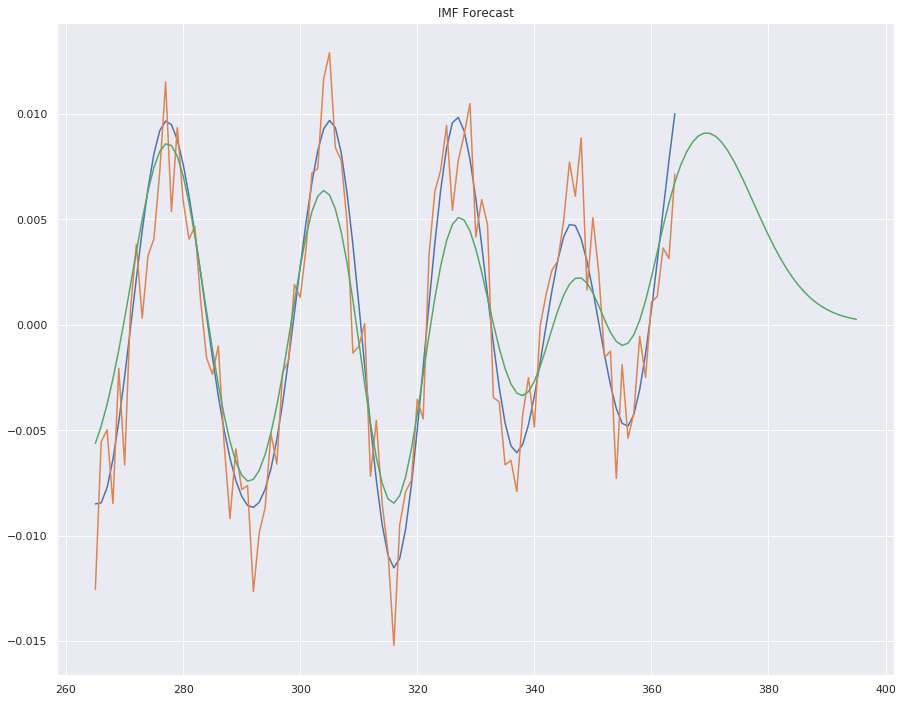

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

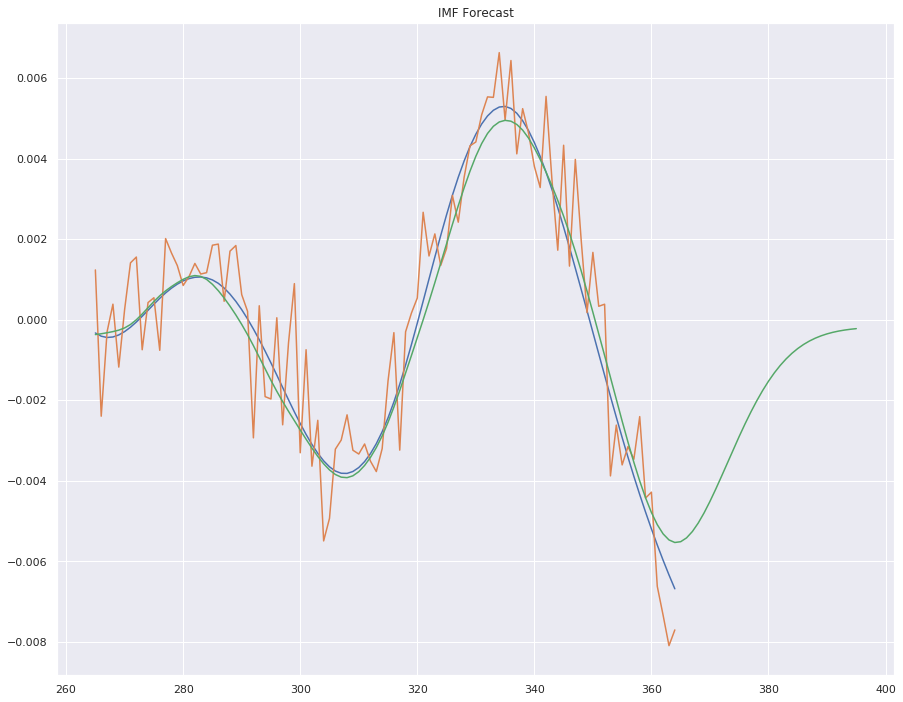

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

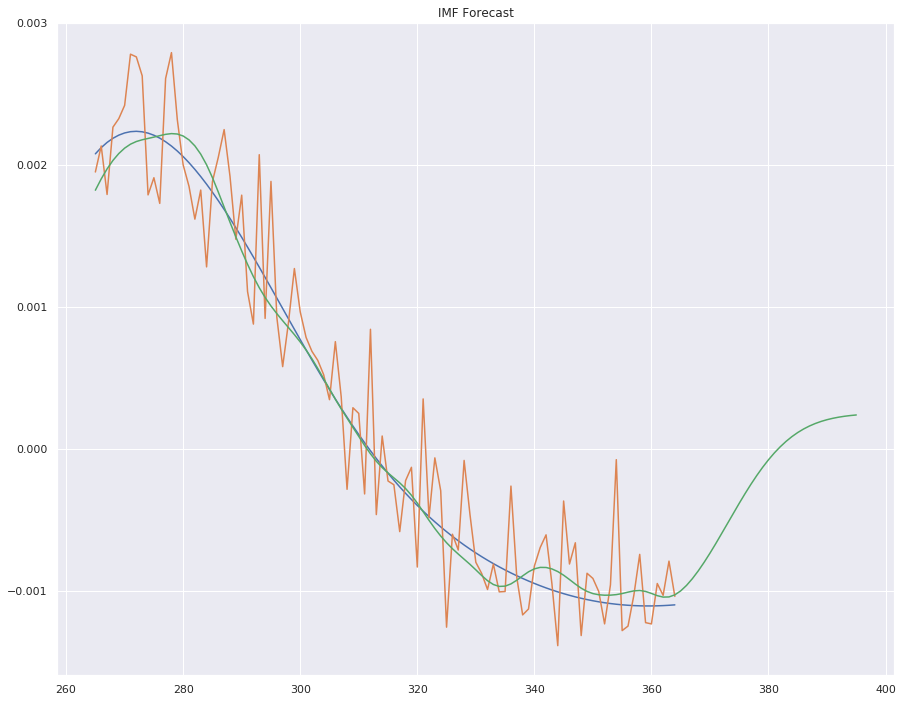

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

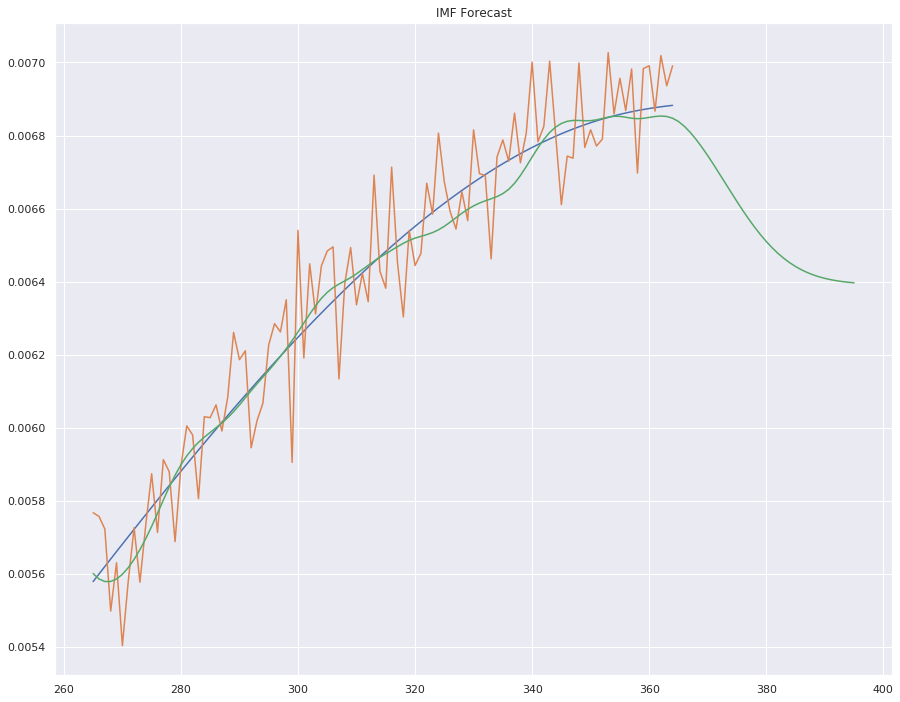

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

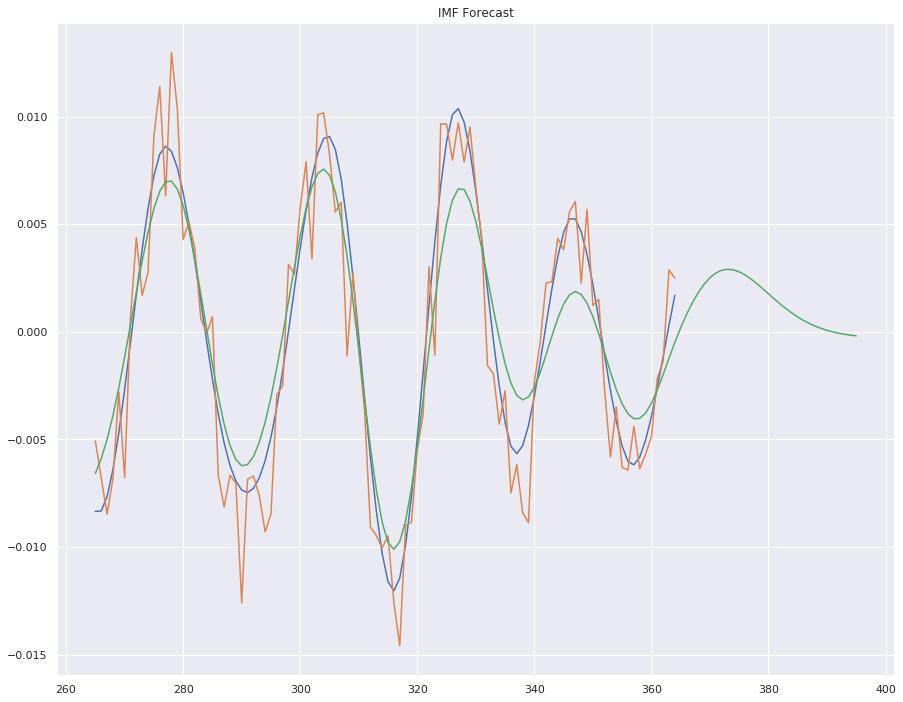

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

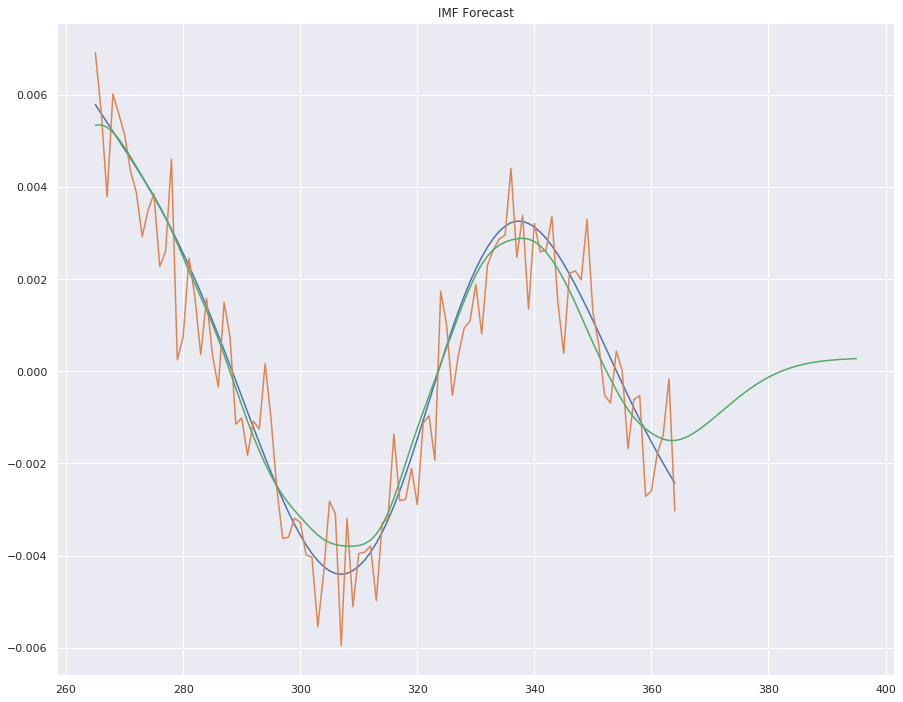

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

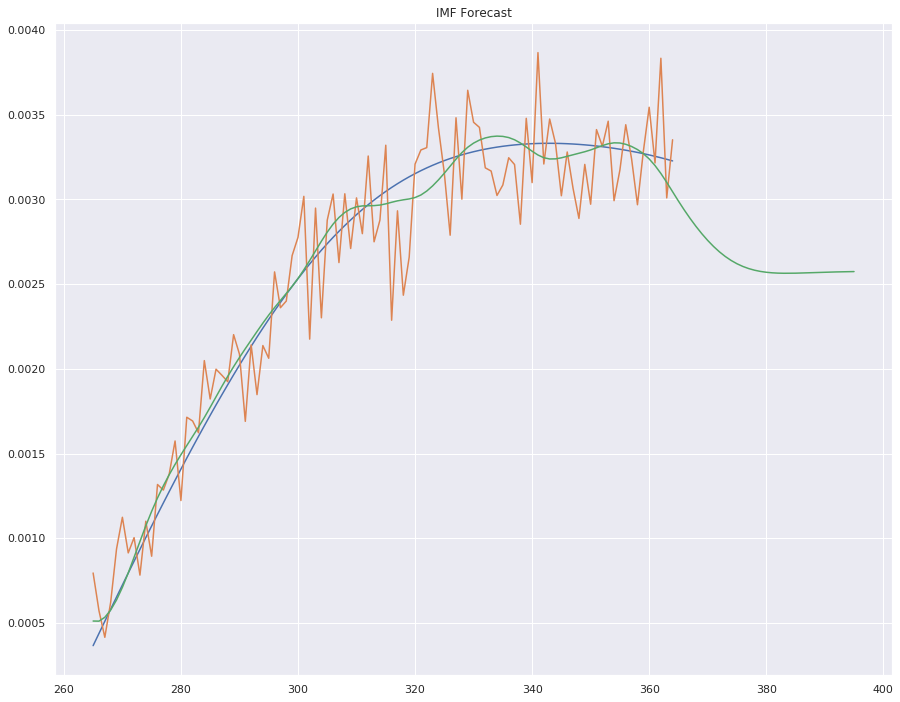

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

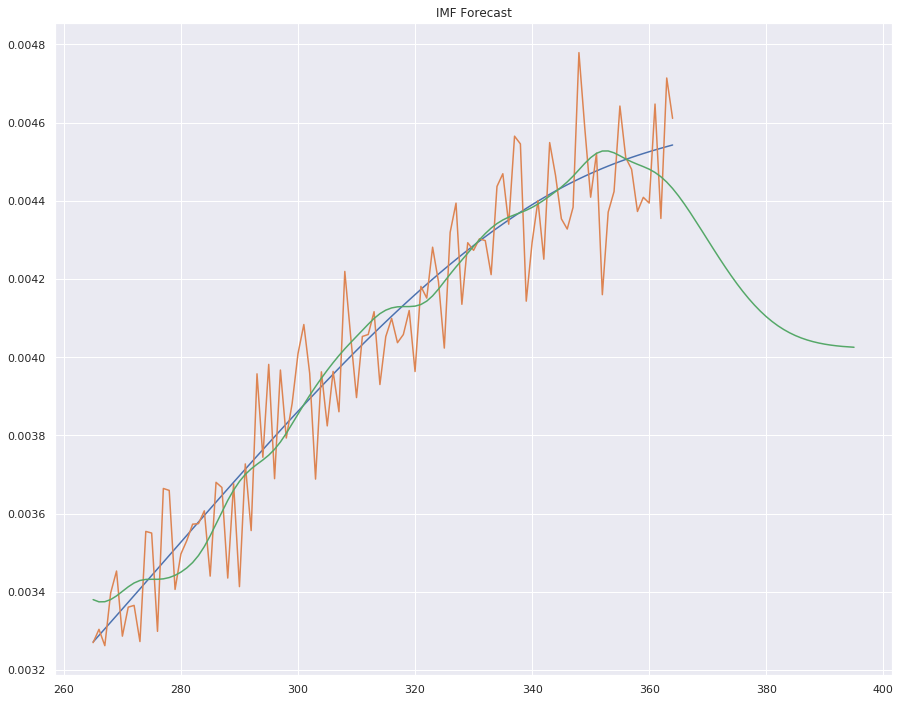

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

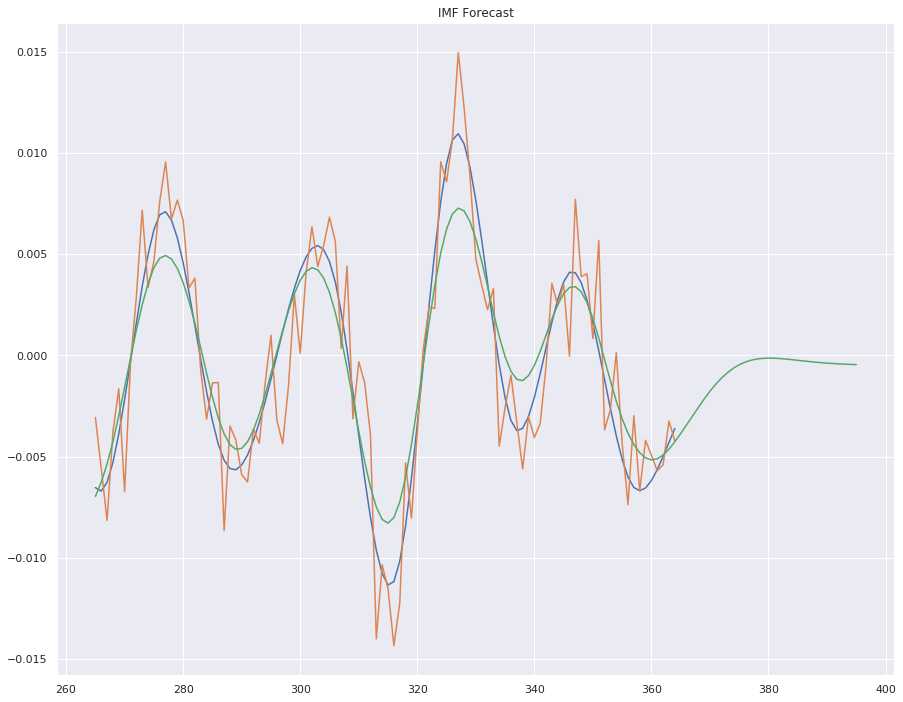

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

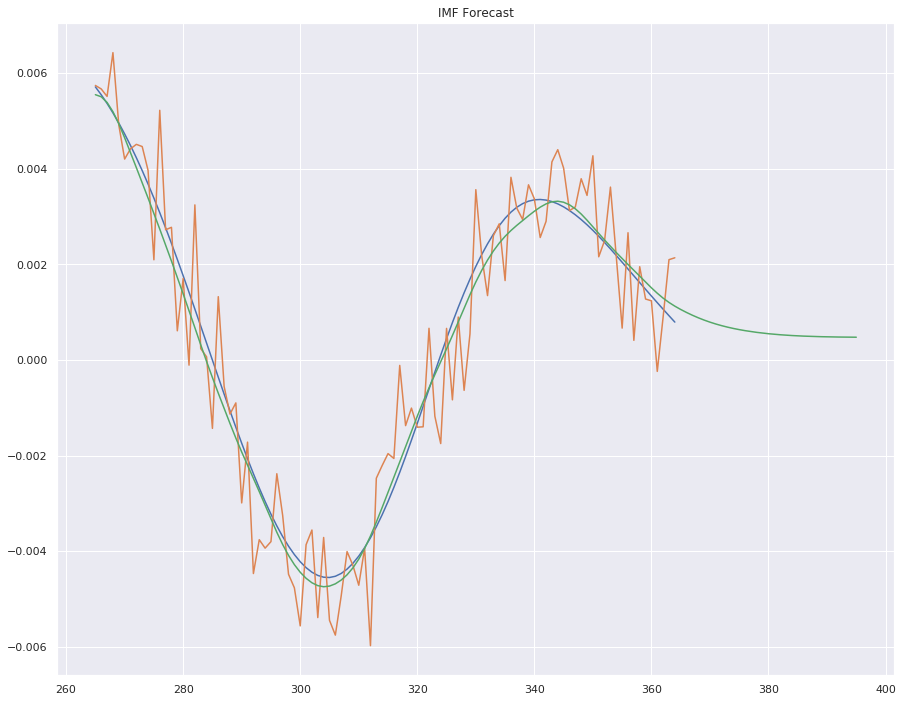

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

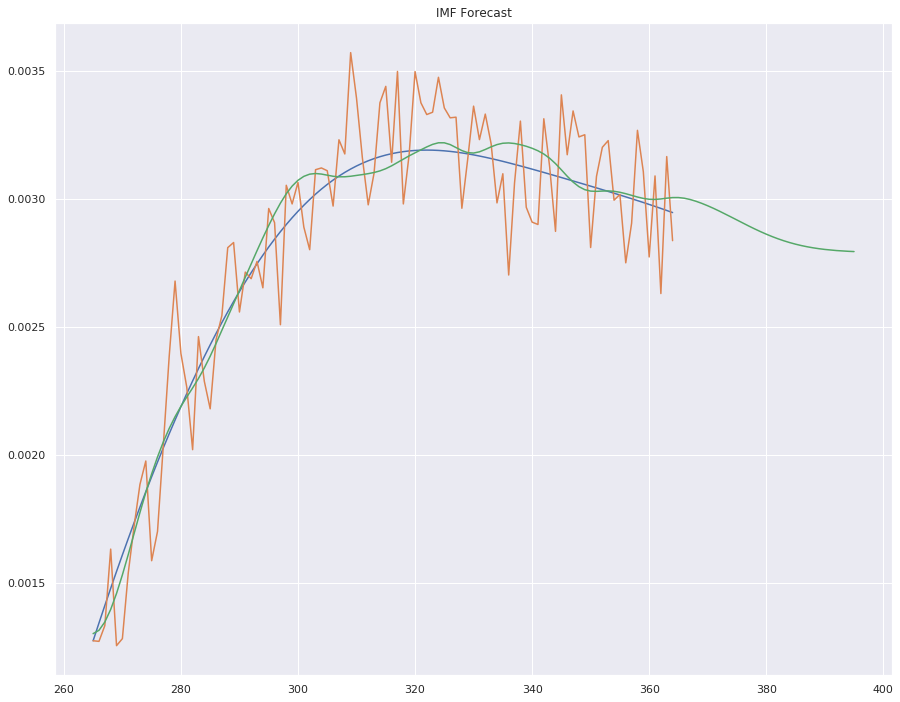

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

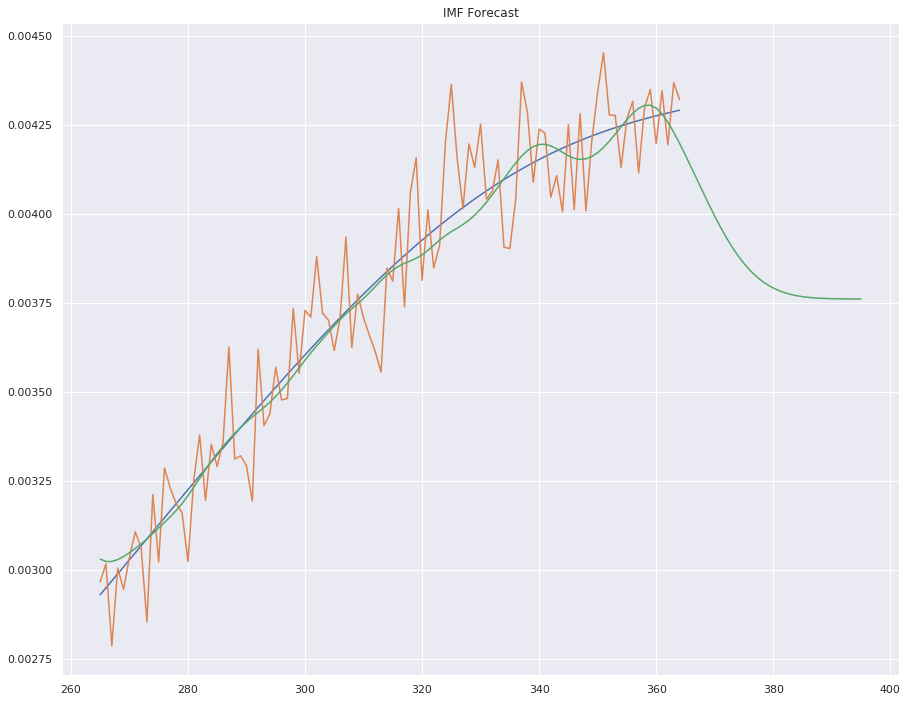

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

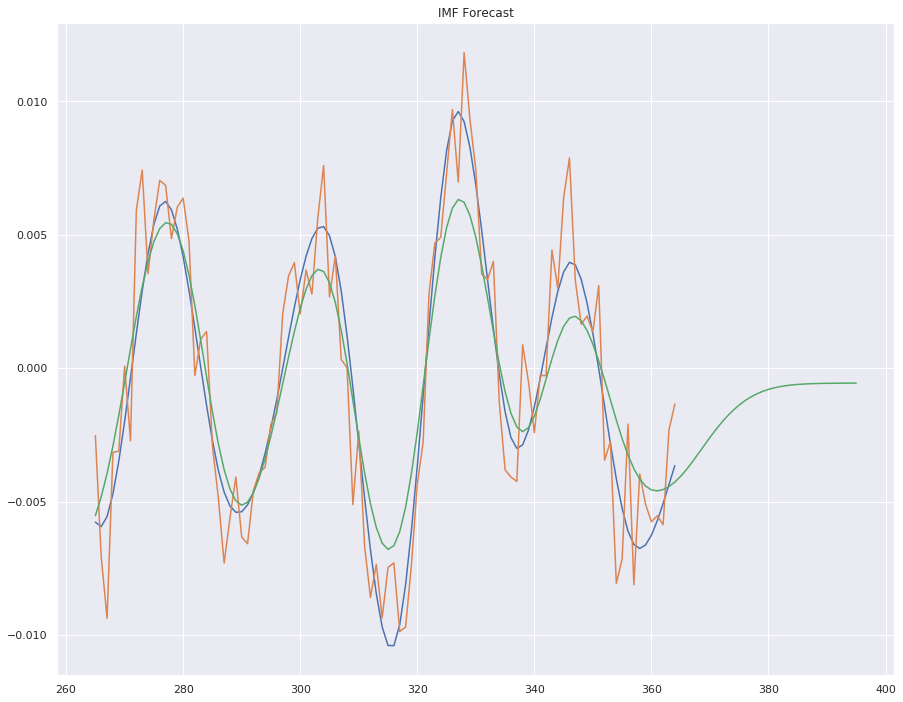

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

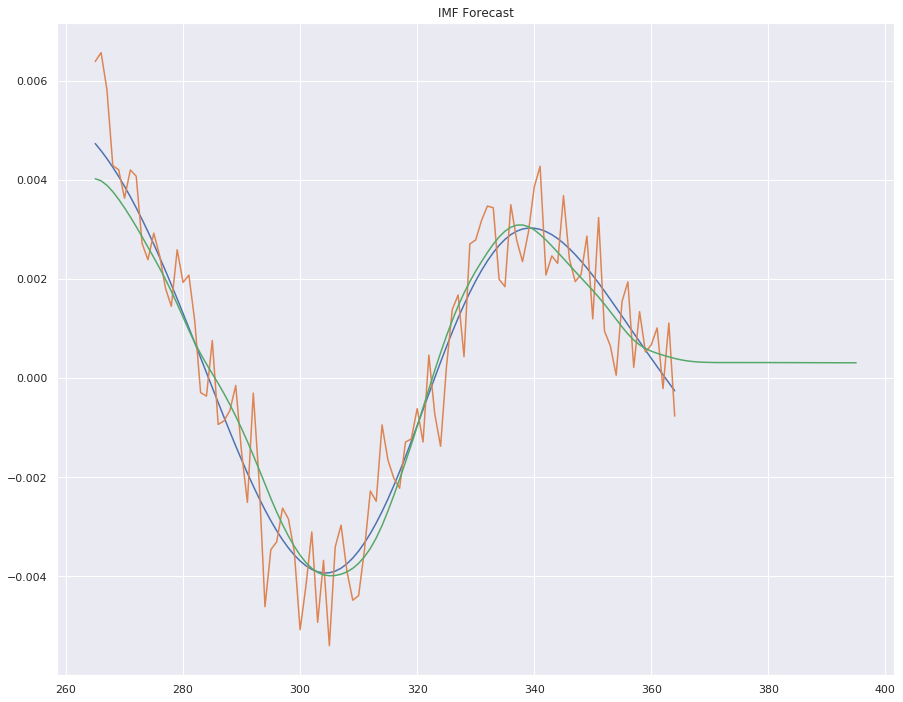

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

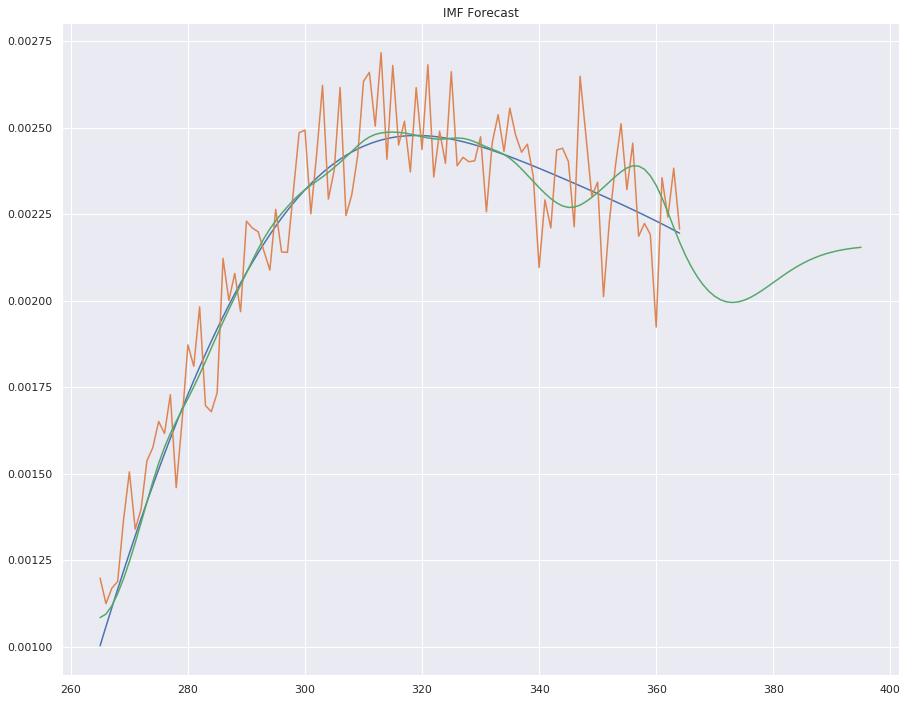

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

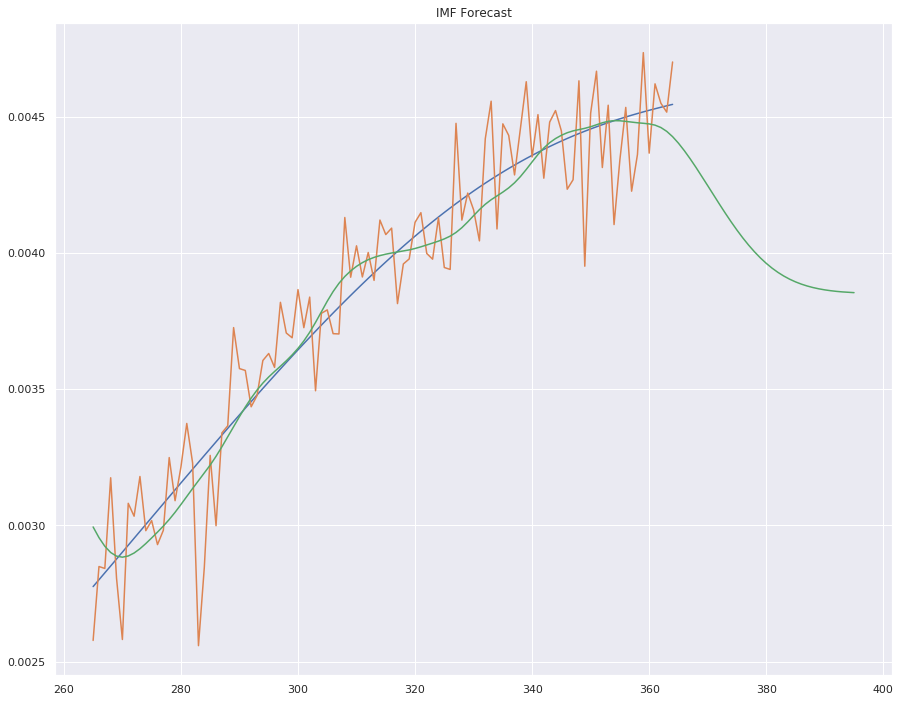

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

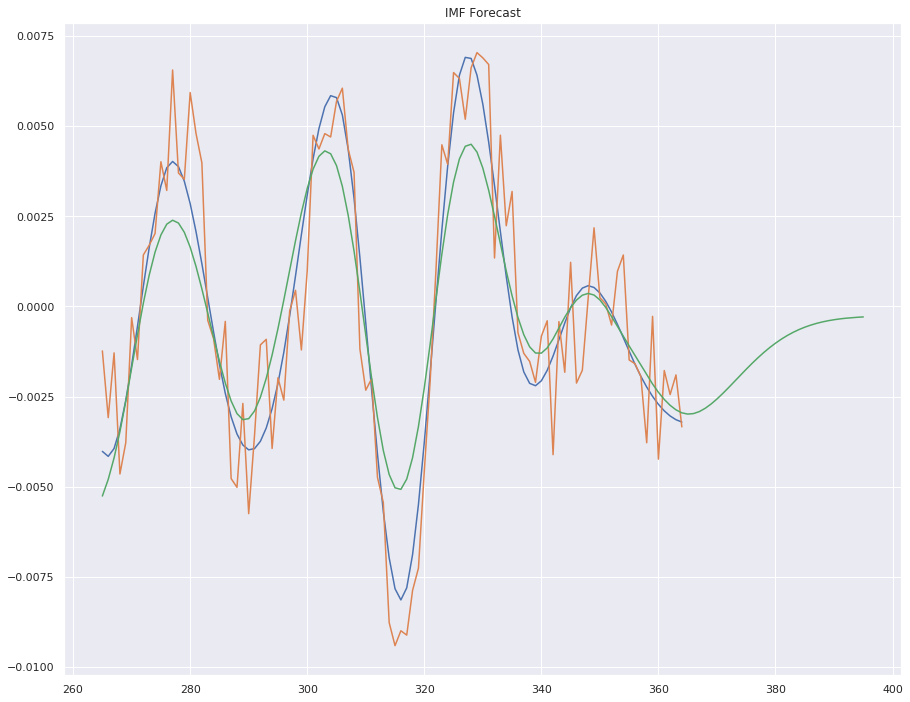

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

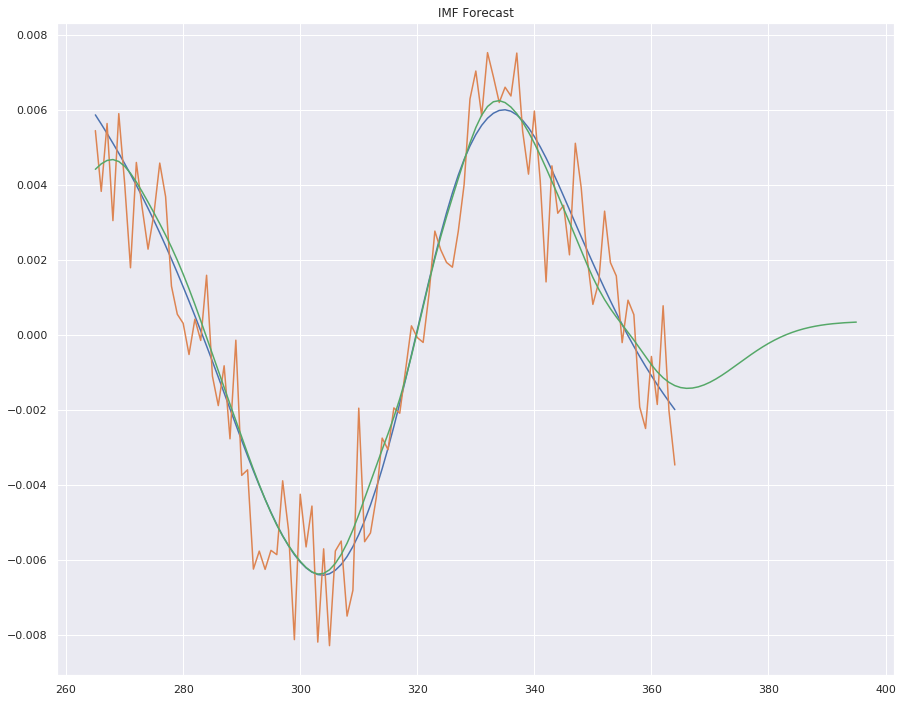

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

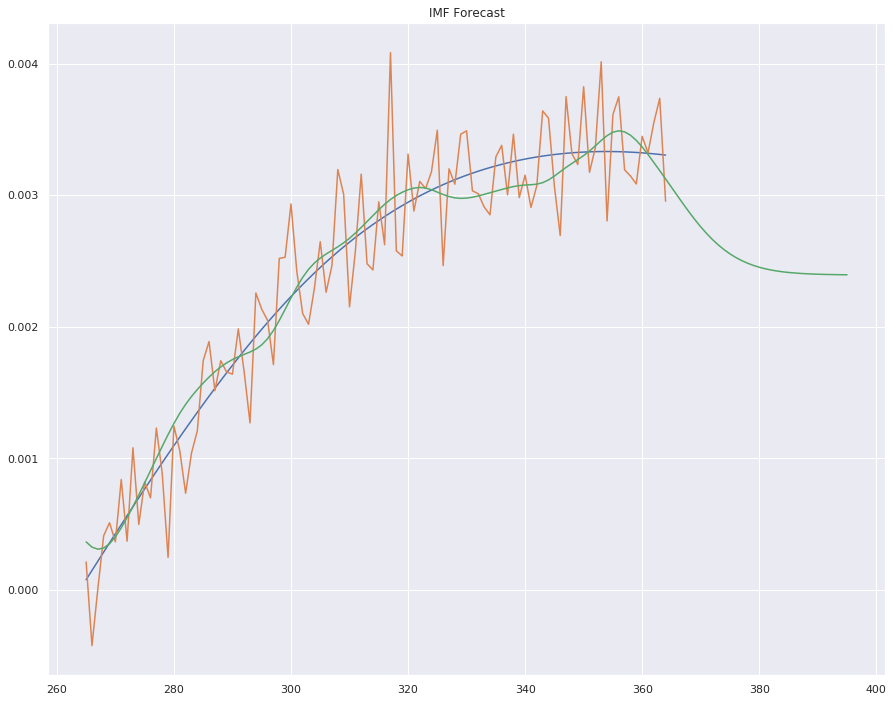

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

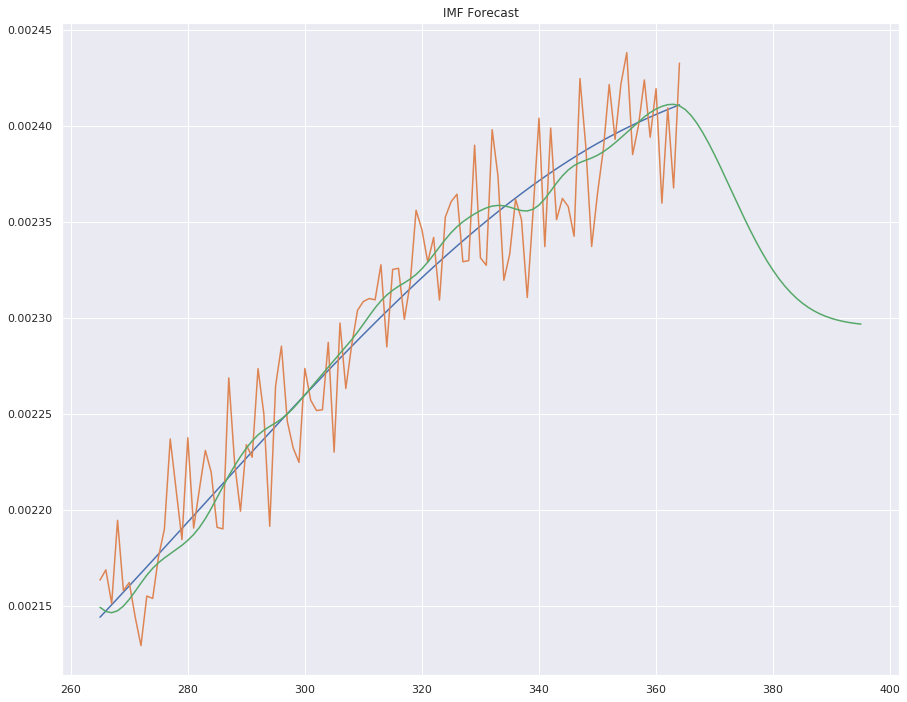

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

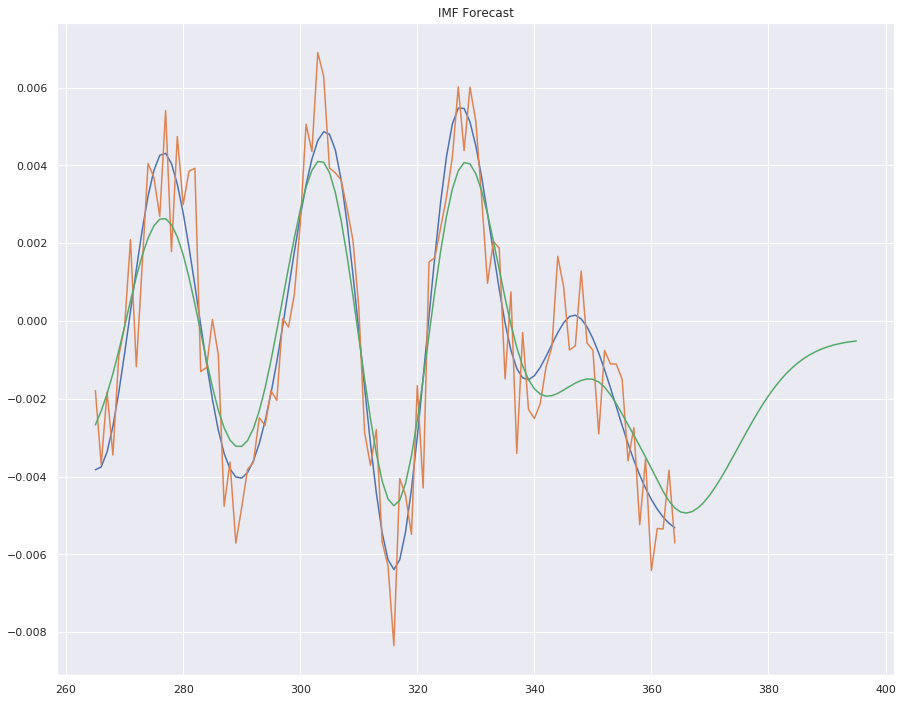

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

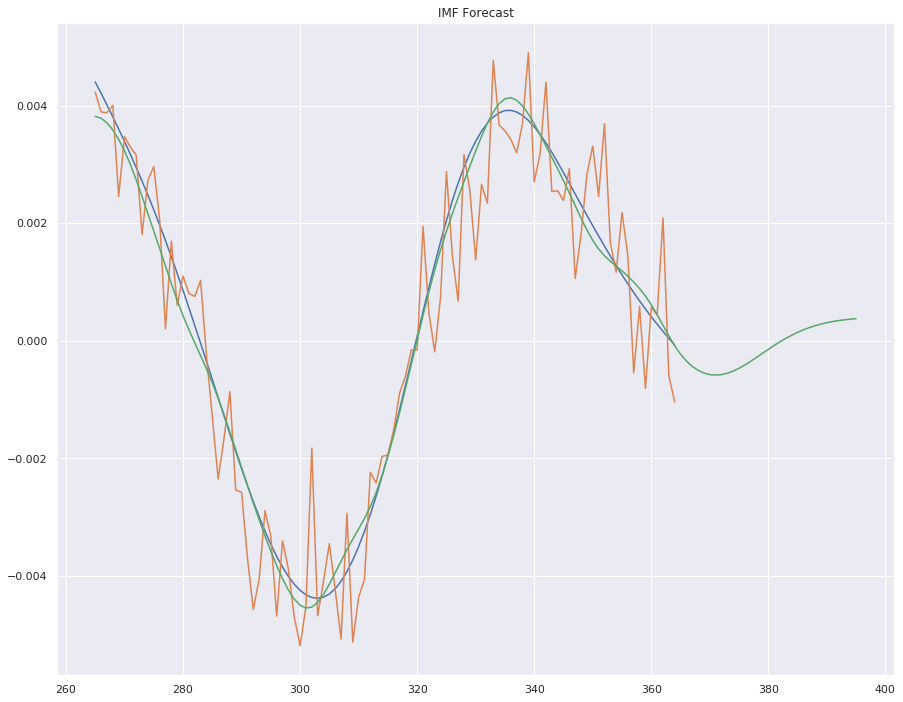

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

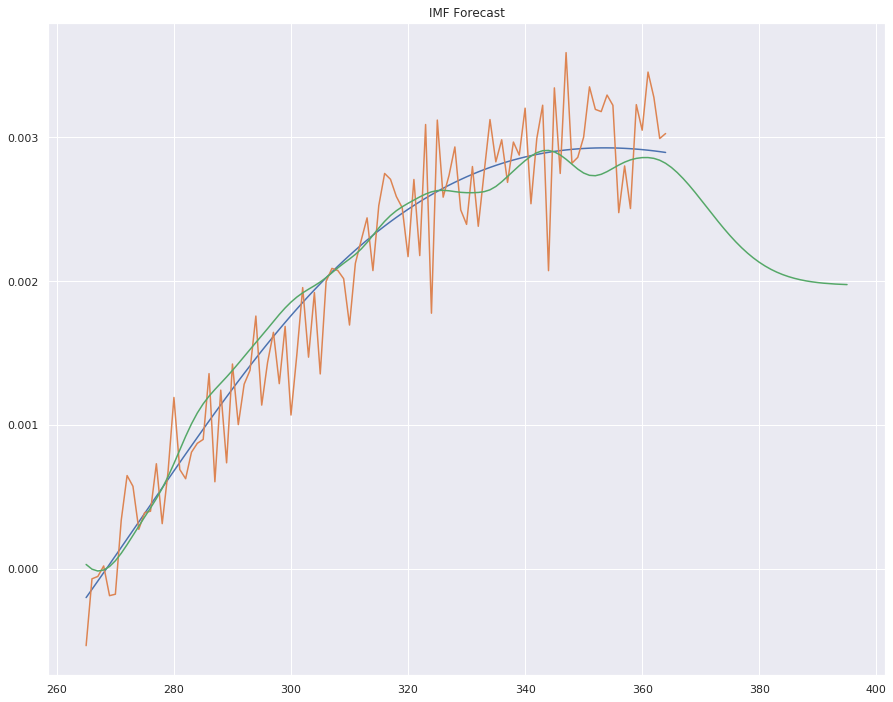

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

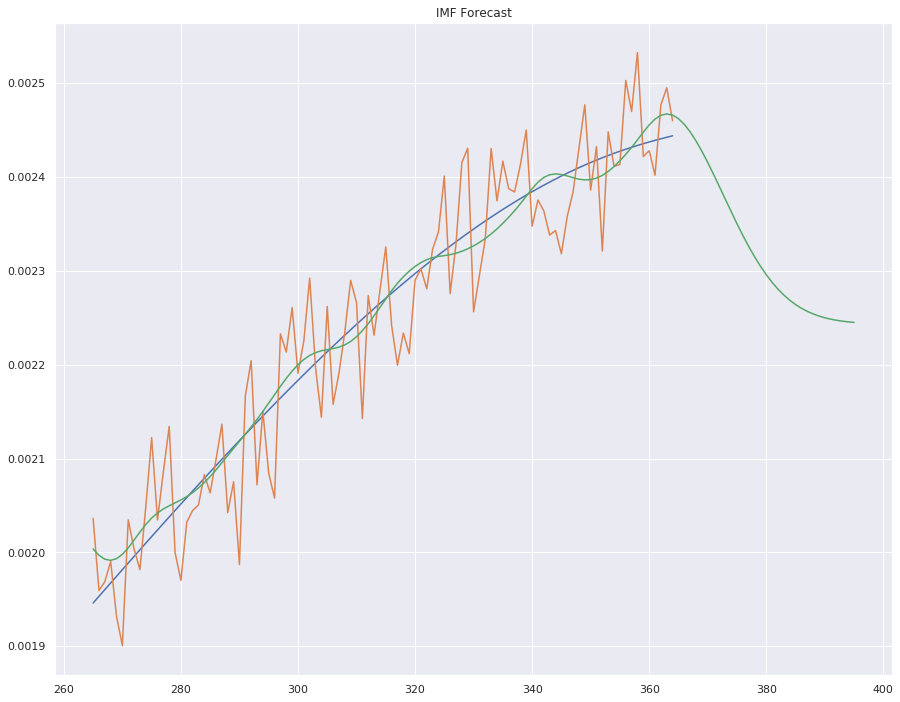

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

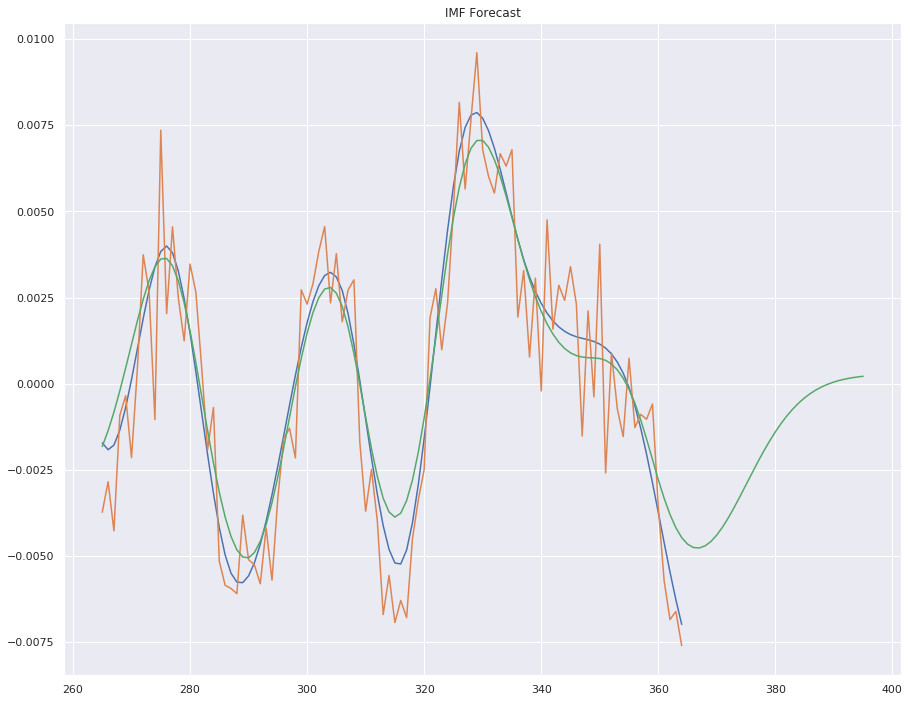

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

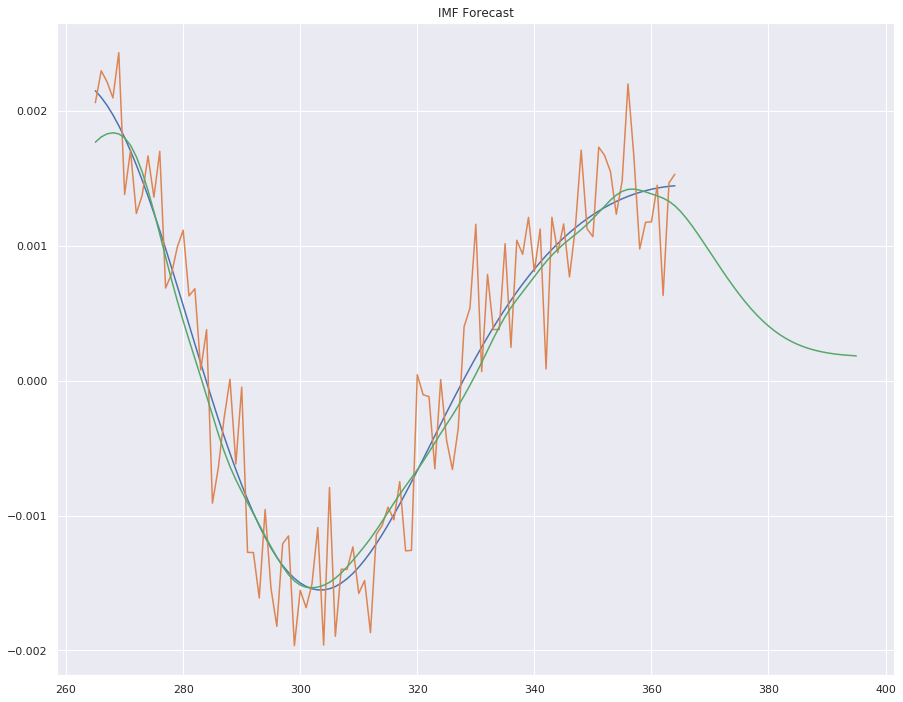

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

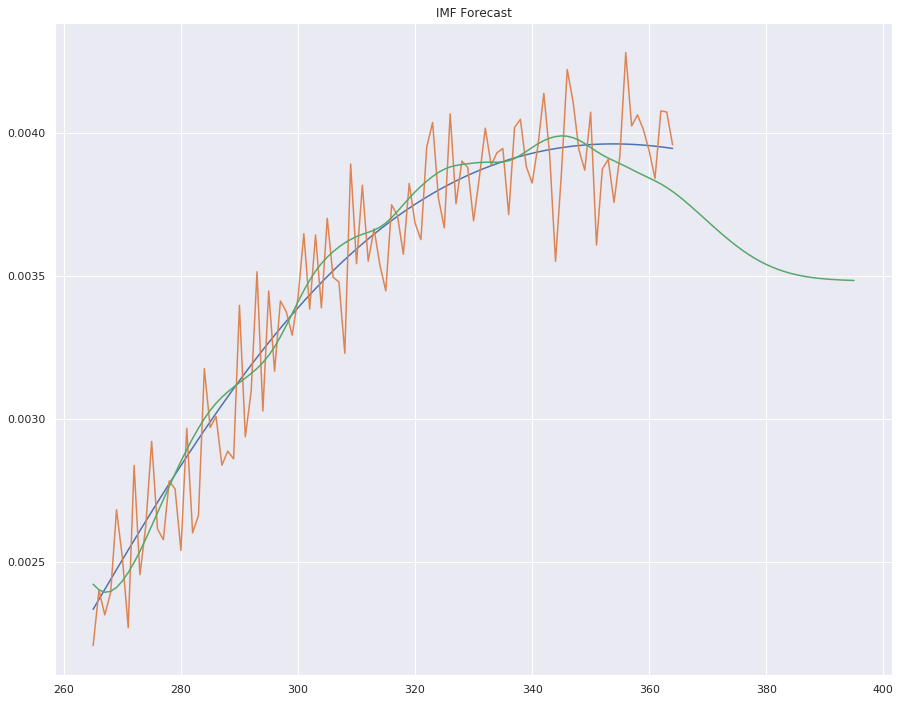

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

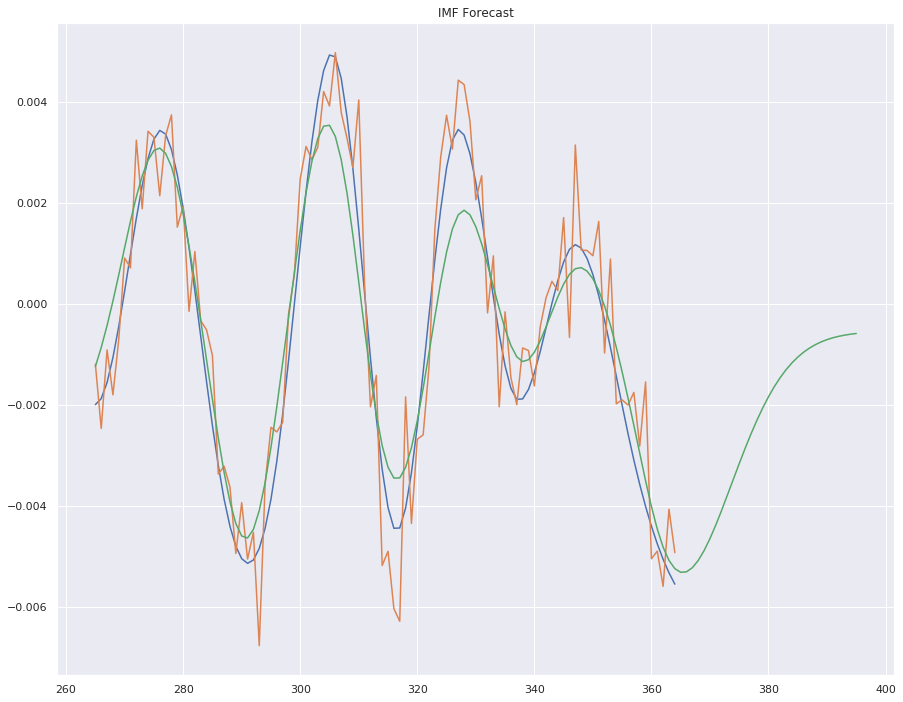

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

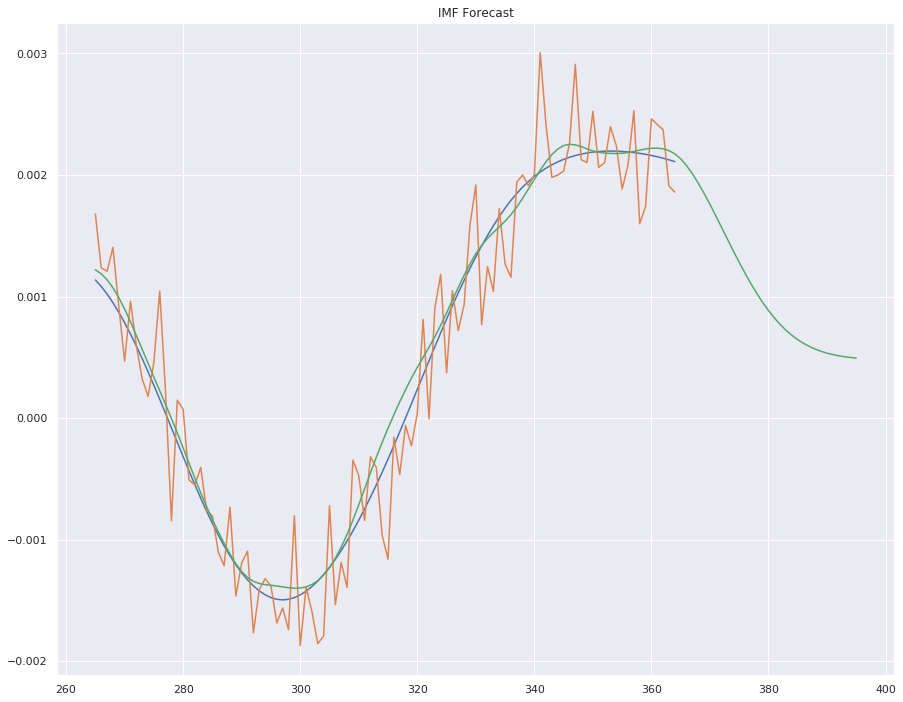

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

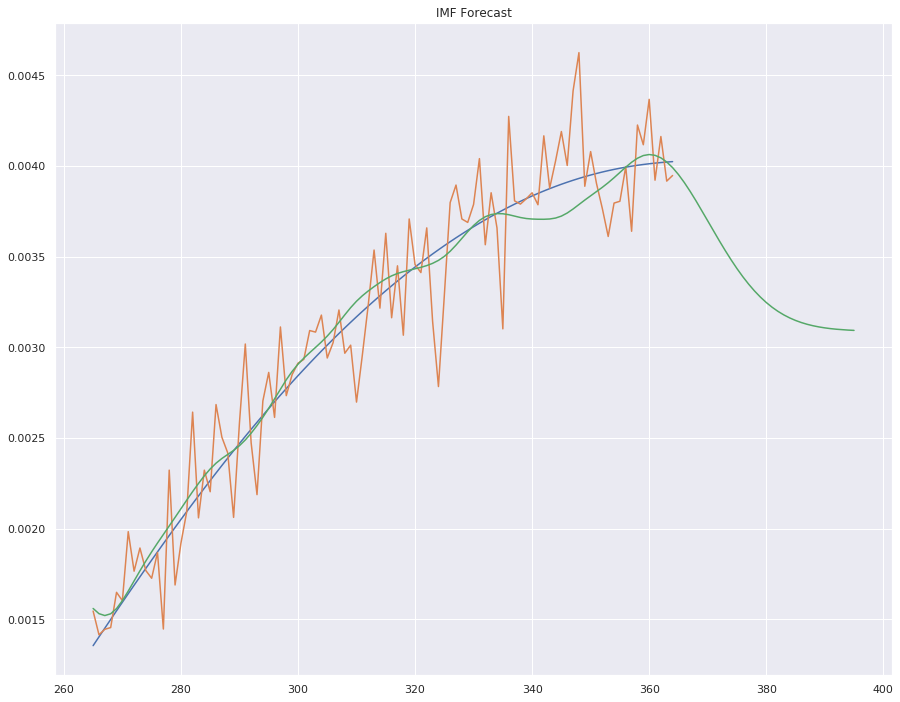

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

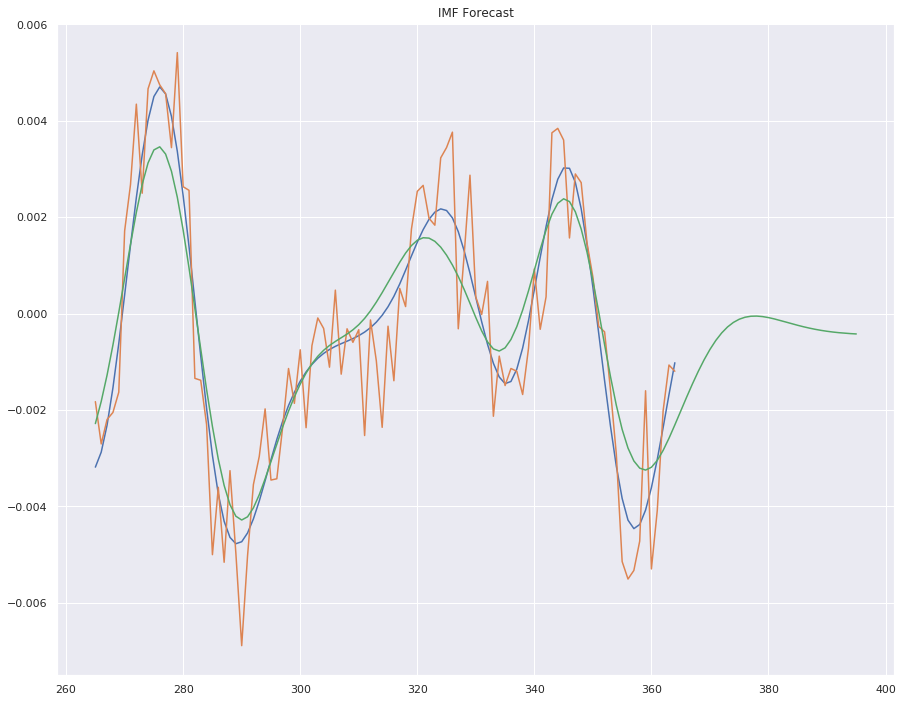

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

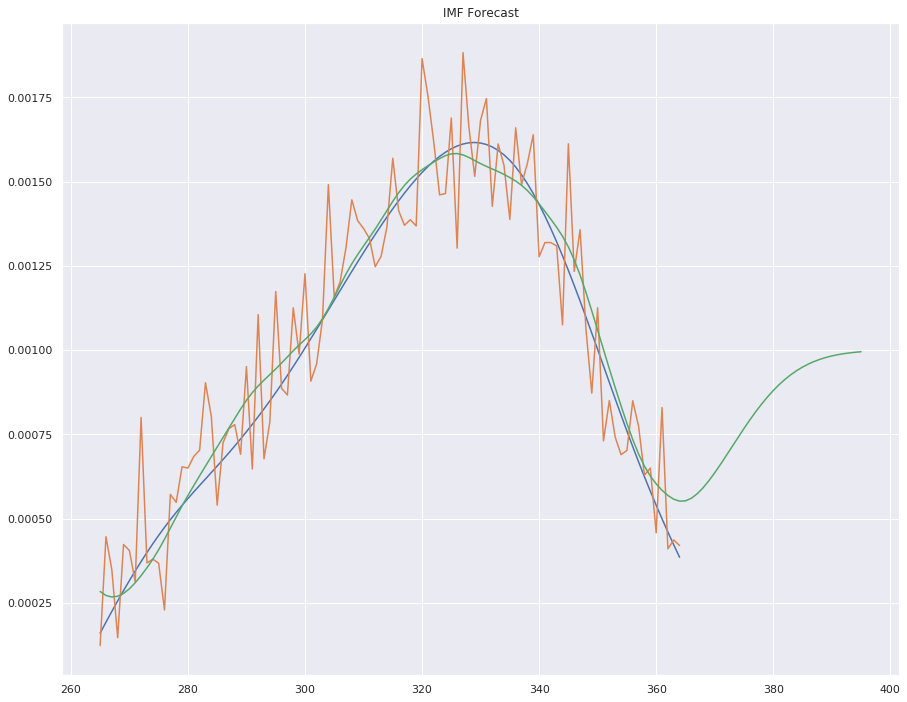

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

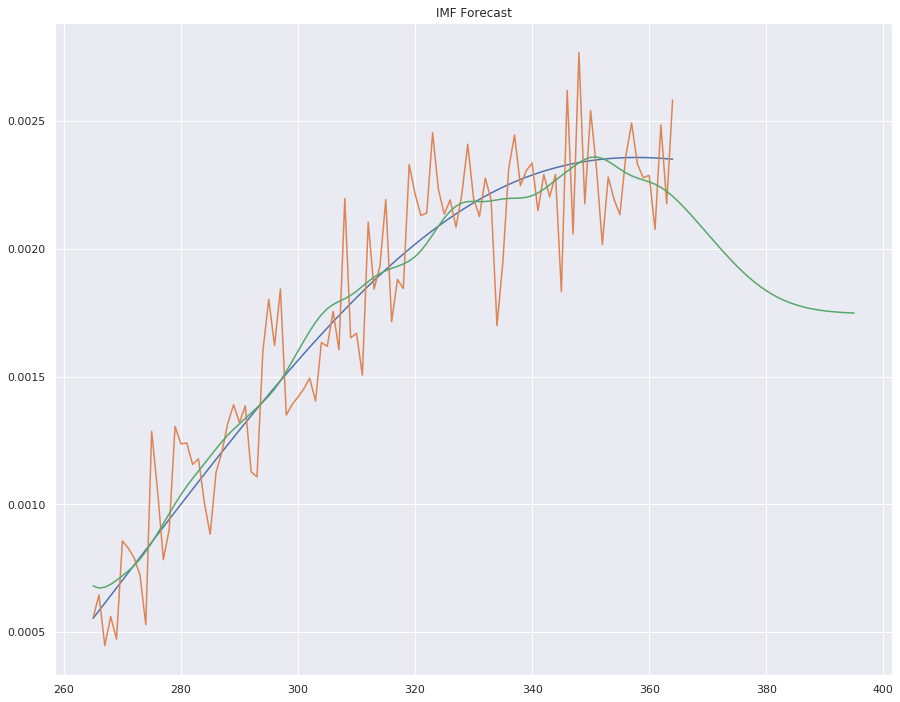

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

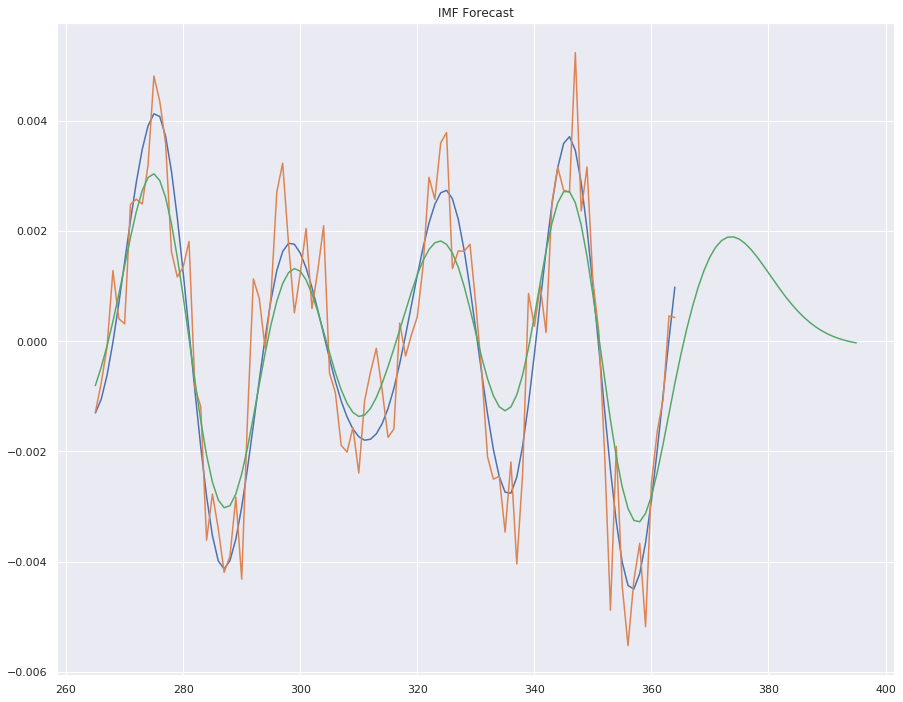

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

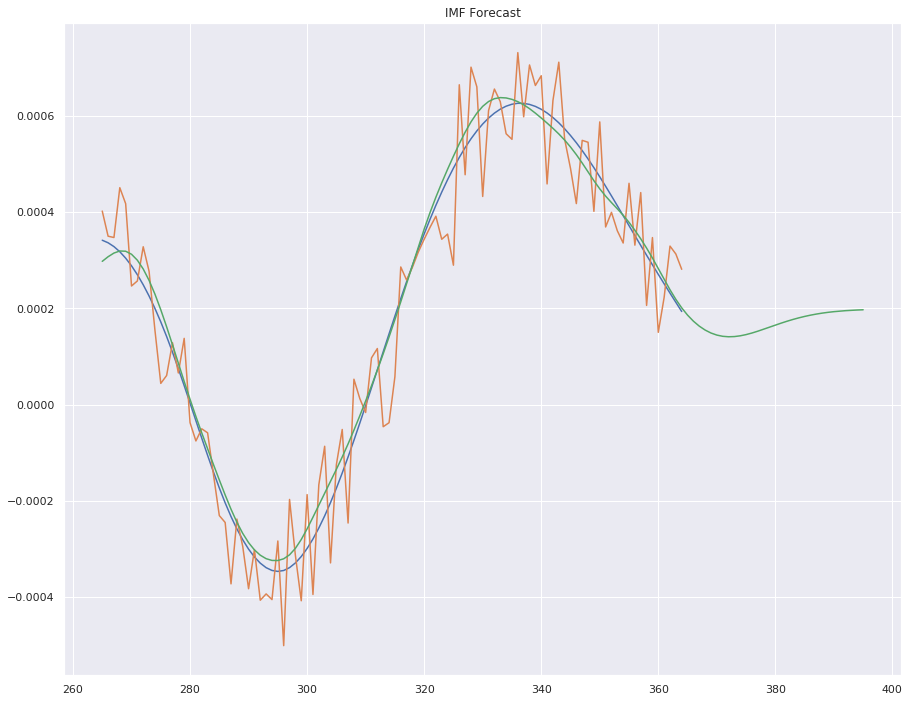

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

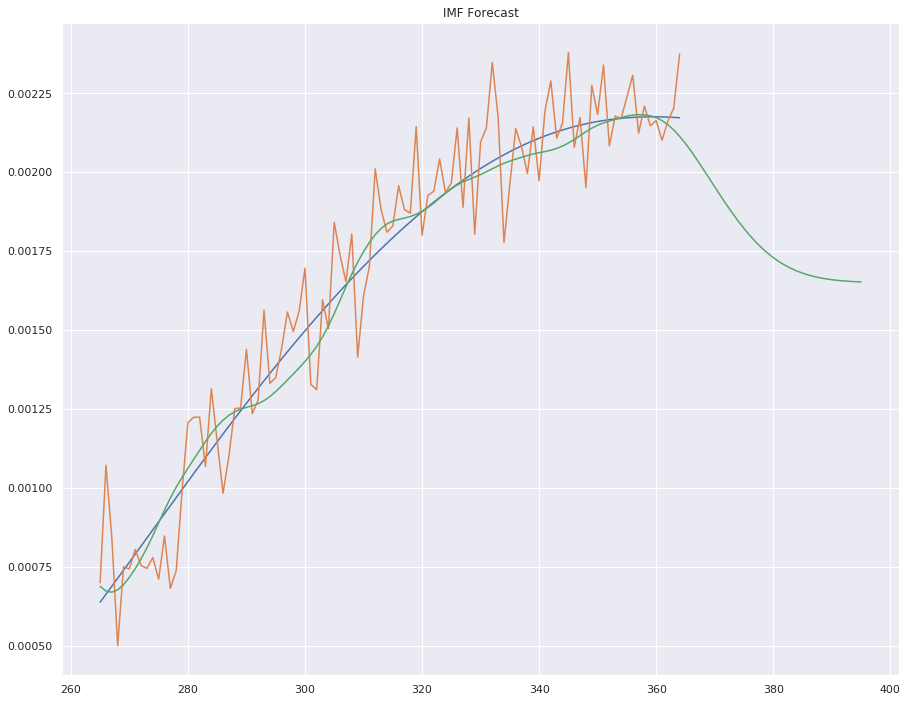

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

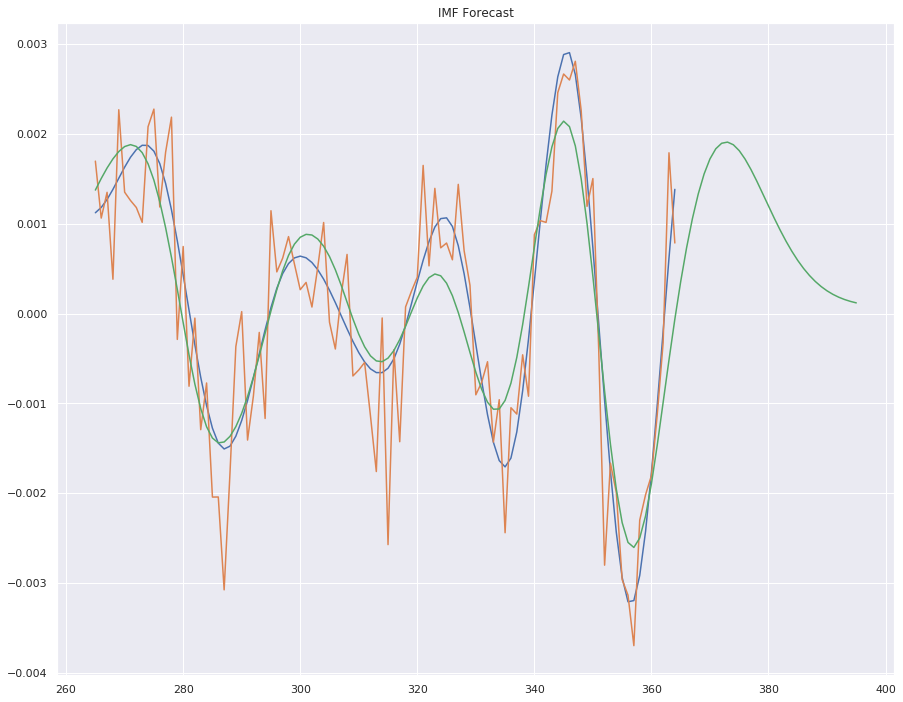

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

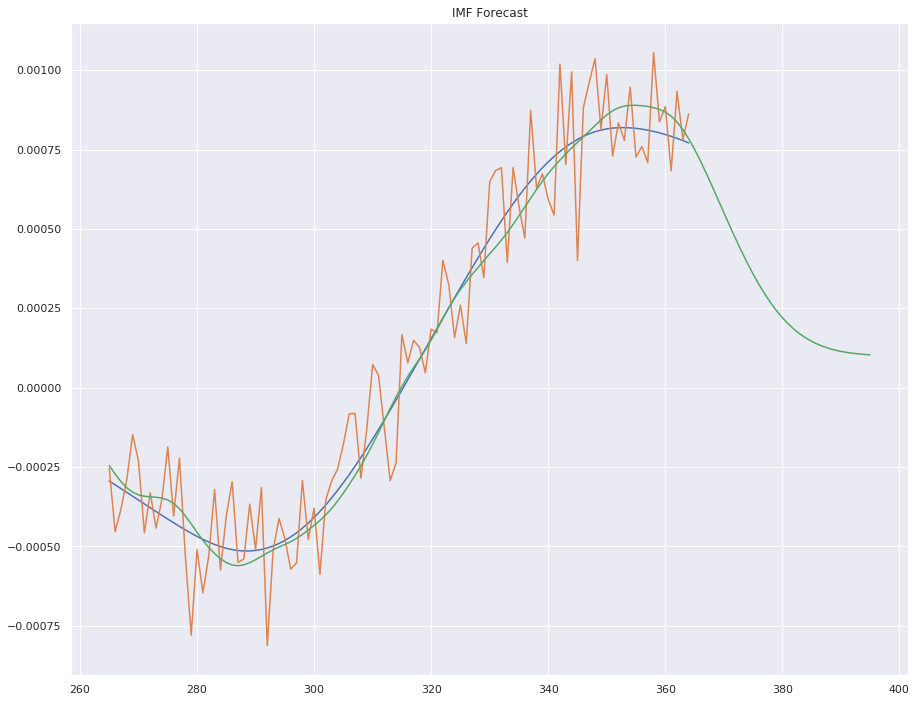

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

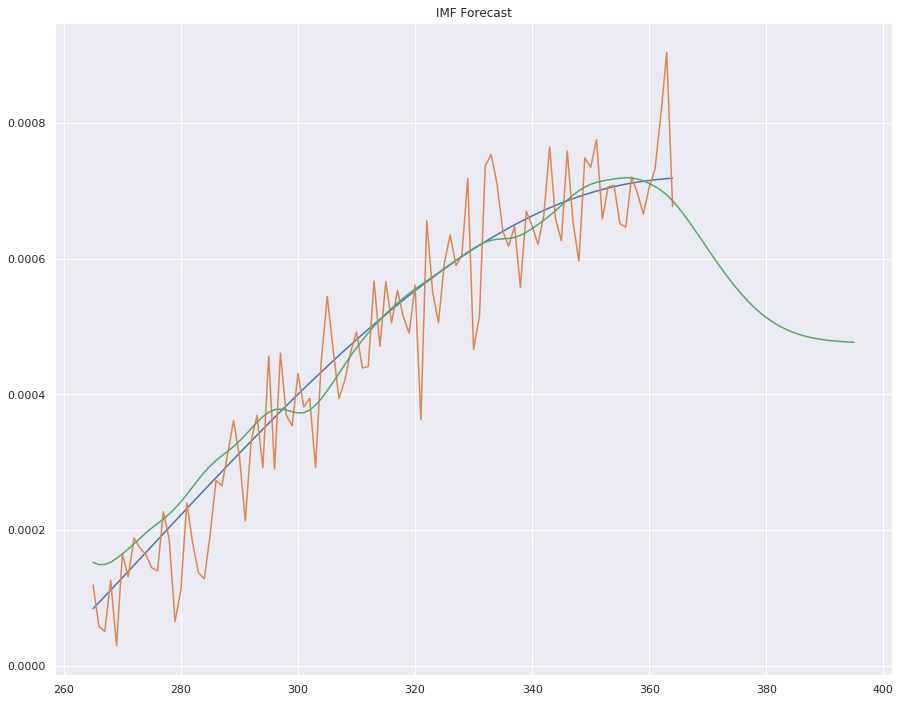

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

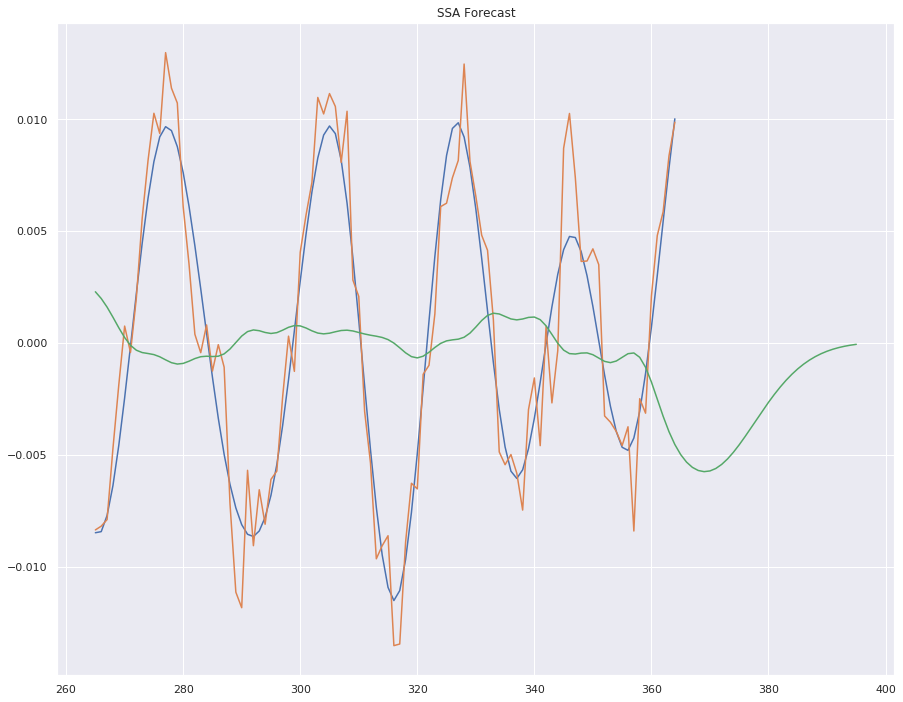

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

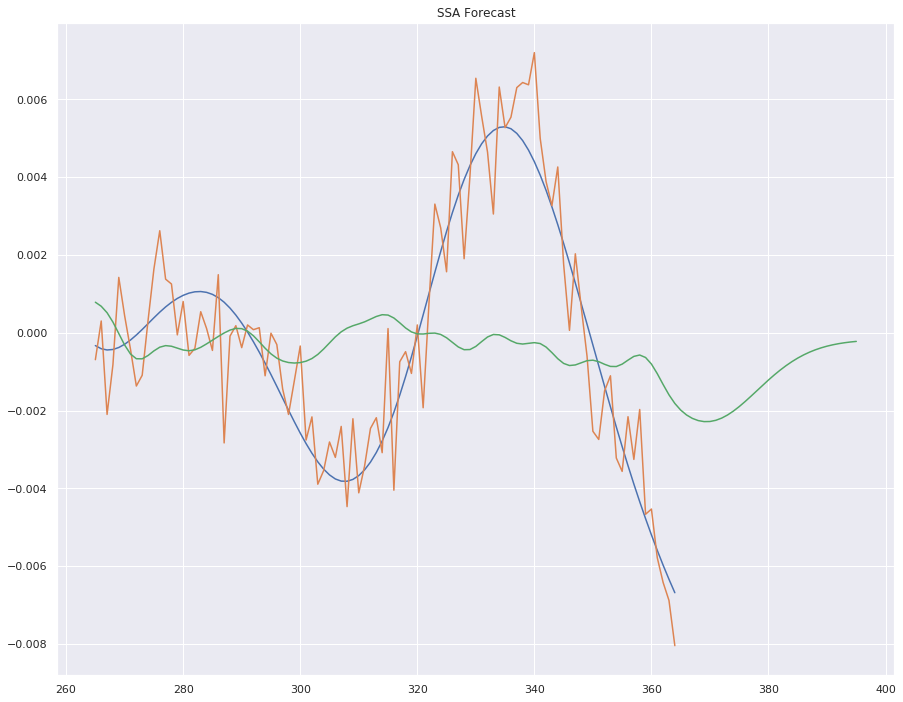

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

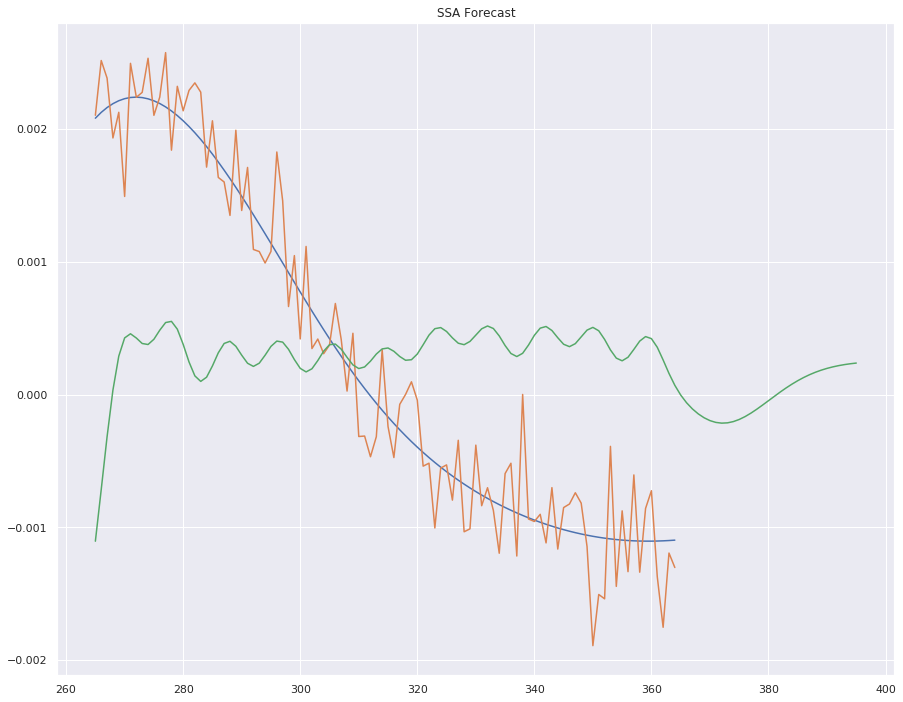

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

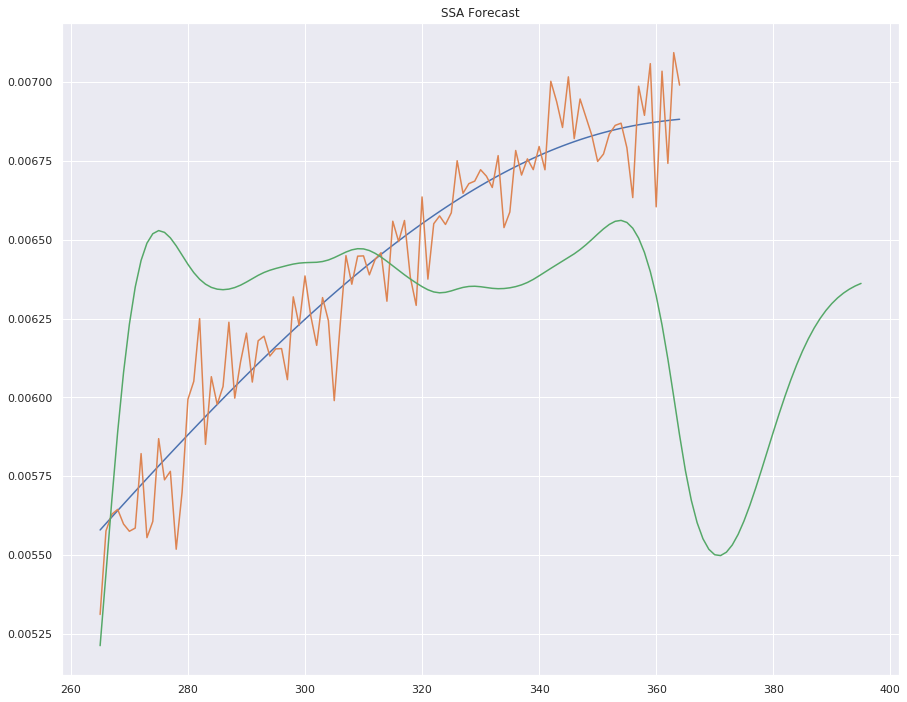

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

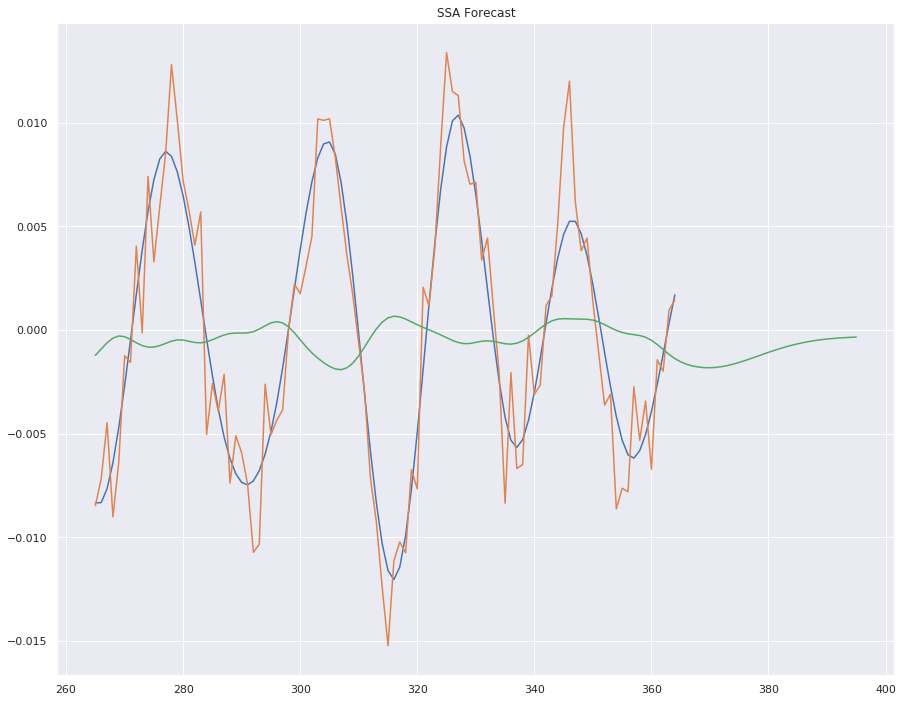

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

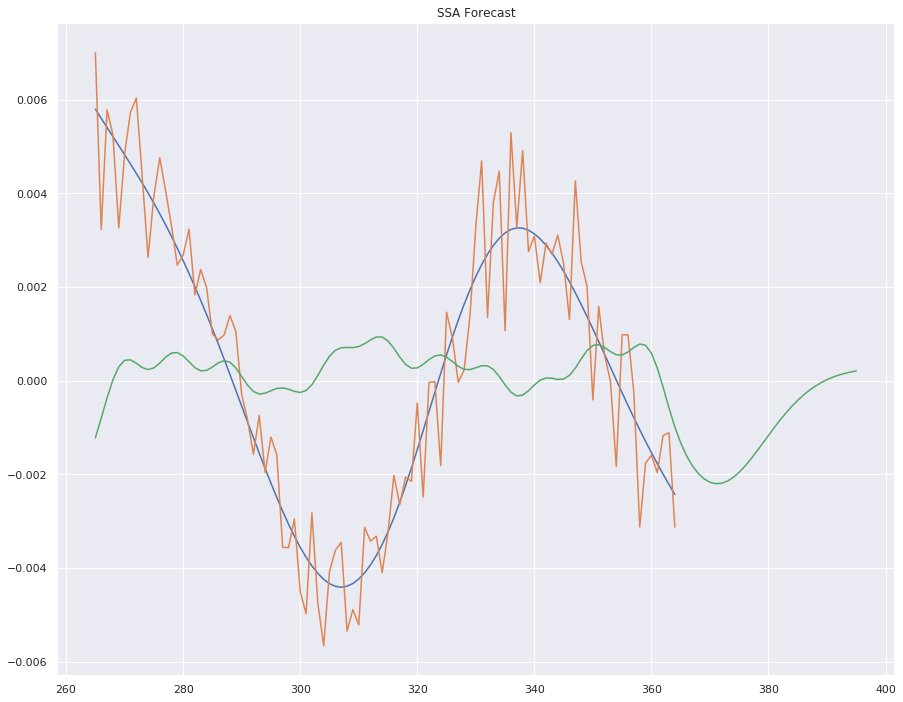

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

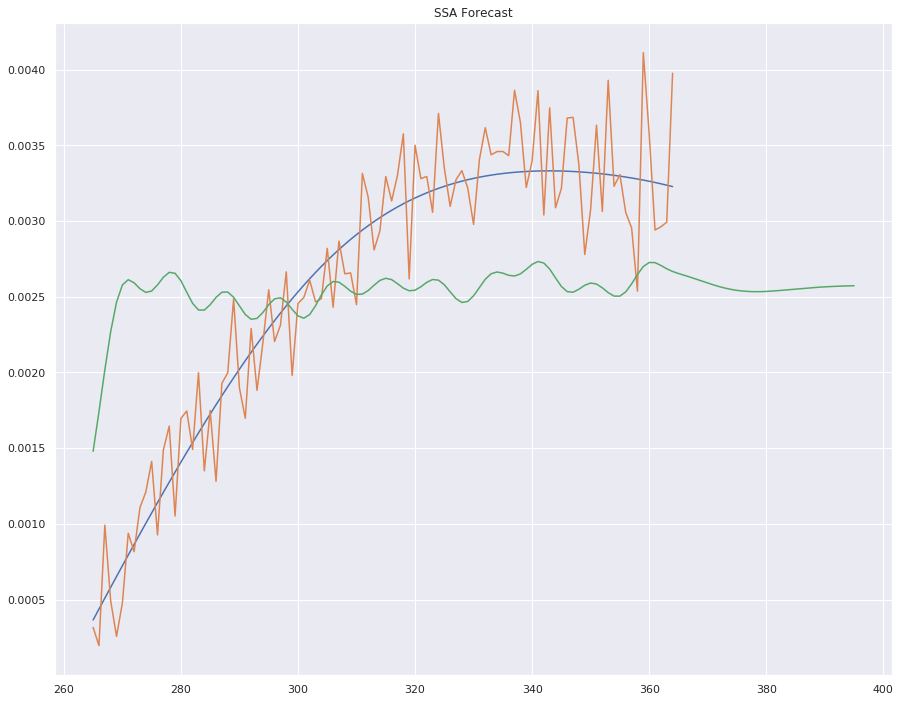

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

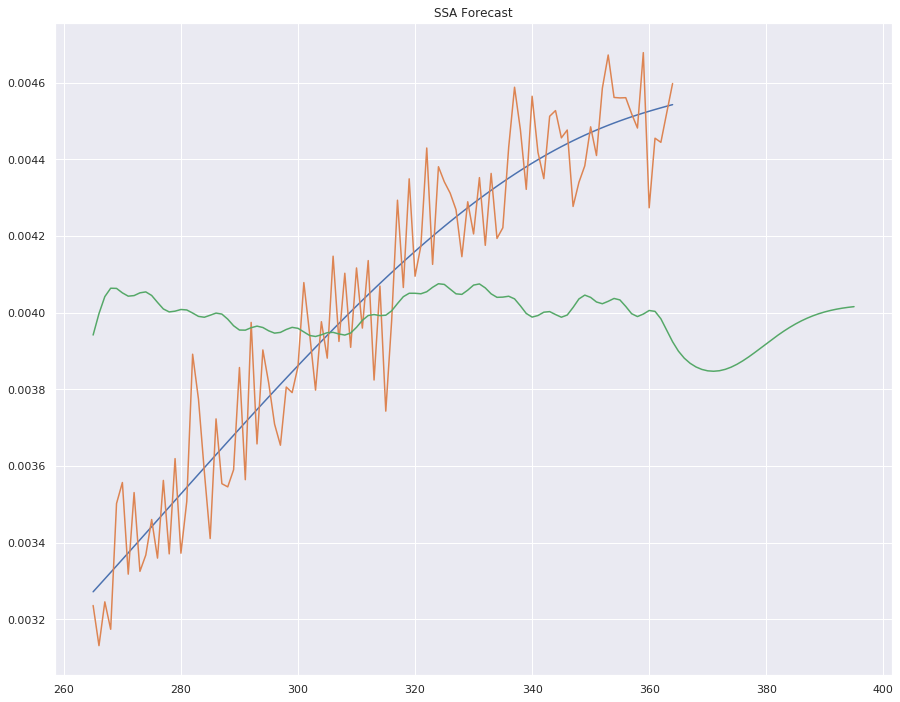

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

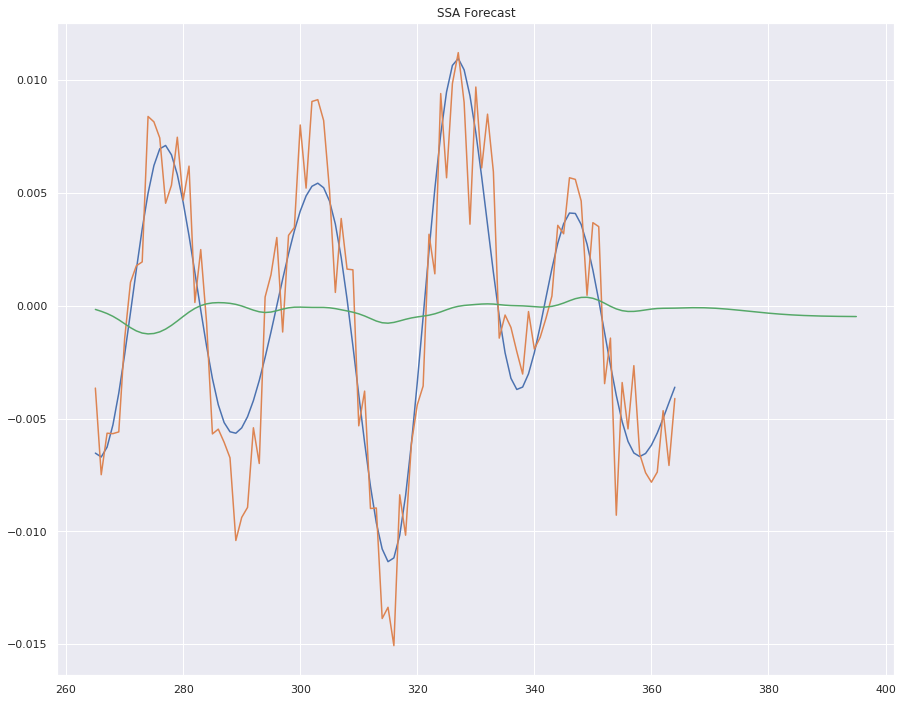

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

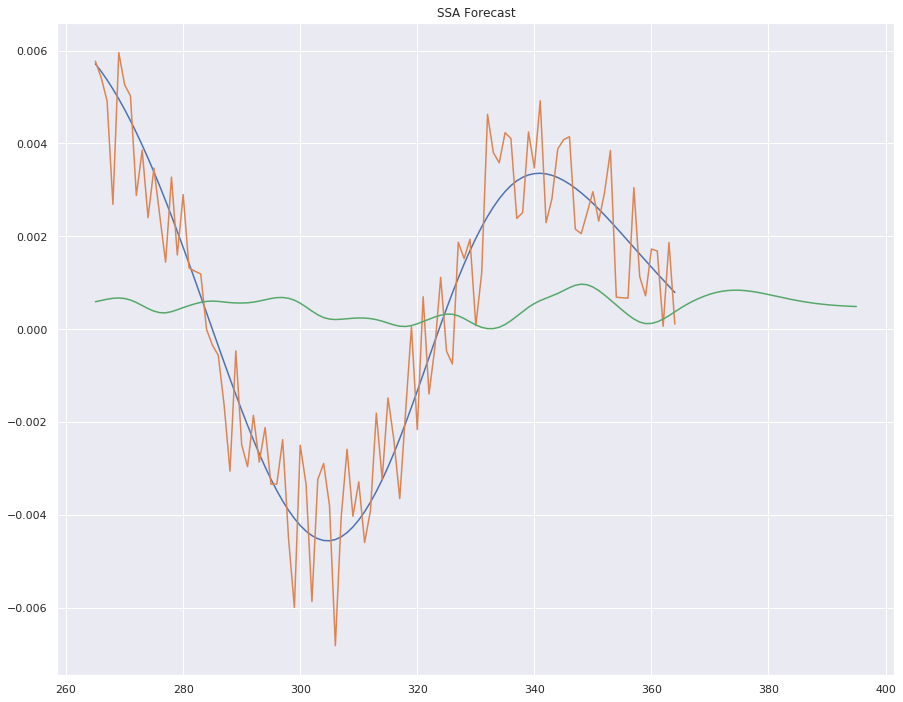

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

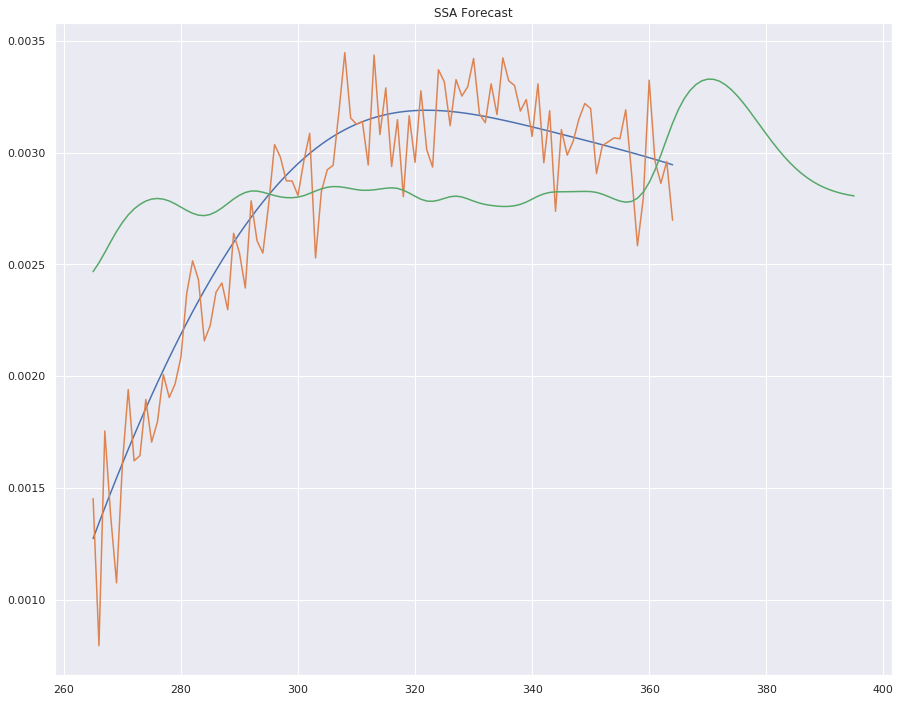

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
IMF_11 Standard deviation STOPPING CRITERION NOT MET with sd = 204.93
IMF_12 Standard deviation STOPPING CRITERION NOT MET with sd = 720.91
IMF_13 Standard deviation STOPPING CRITERION NOT MET with sd = 36.54
IMF_14 Standard deviation STOPPING CRITERION NOT MET with sd = 1419.53
IMF_15 Standard deviation STOPPING CRITERION NOT MET with sd = 65.39
IMF_16 Standard deviation STOPPING CRITERION NOT MET with sd = 16.5

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/AdvEMDpy/AdvEMDpy.py:1191: UserWarning: Recommended knots are subset of knot time points for discontinuity issues.
  warnings.warn('Recommended knots are subset of knot time points for discontinuity issues.')


IMF_11 Standard deviation STOPPING CRITERION NOT MET with sd = 179.96
IMF_12 ALL IMF CONDITIONS MET
IMF_21 Standard deviation STOPPING CRITERION NOT MET with sd = 22943.32
IMF_22 ALL IMF CONDITIONS MET
IMF_31 ALL IMF CONDITIONS MET
IMF_11 ALL IMF CONDITIONS MET
IMF_21 Standard deviation STOPPING CRITERION NOT MET with sd = 723.91
IMF_22 ALL IMF CONDITIONS MET
IMF_31 ALL IMF CONDITIONS MET
IMF_11 Standard deviation STOPPING CRITERION NOT MET with sd = 3687.21
IMF_12 Standard deviation STOPPING CRITERION NOT MET with sd = 1266.02
IMF_13 Standard deviation STOPPING CRITERION NOT MET with sd = 1610.05
IMF_14 Standard deviation STOPPING CRITERION NOT MET with sd = 83.73
IMF_15 Standard deviation STOPPING CRITERION NOT MET with sd = 278.33
IMF_16 Standard deviation STOPPING CRITERION NOT MET with sd = 34.79
IMF_17 Standard deviation STOPPING CRITERION NOT MET with sd = 24.04
IMF_18 Standard deviation STOPPING CRITERION NOT MET with sd = 27.01
IMF_19 ALL IMF CONDITIONS MET
IMF_21 Standard dev

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

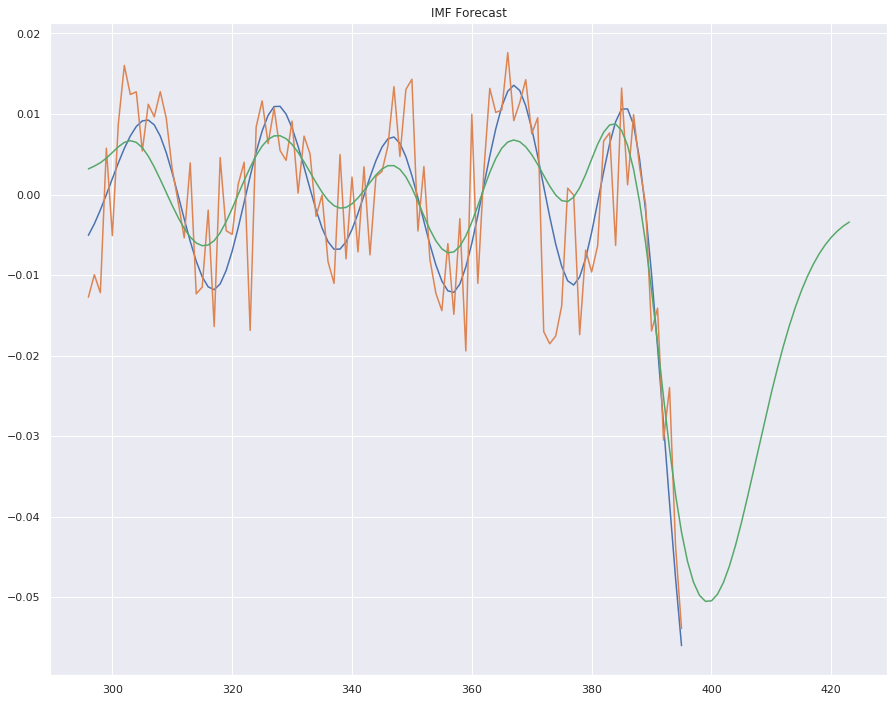

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

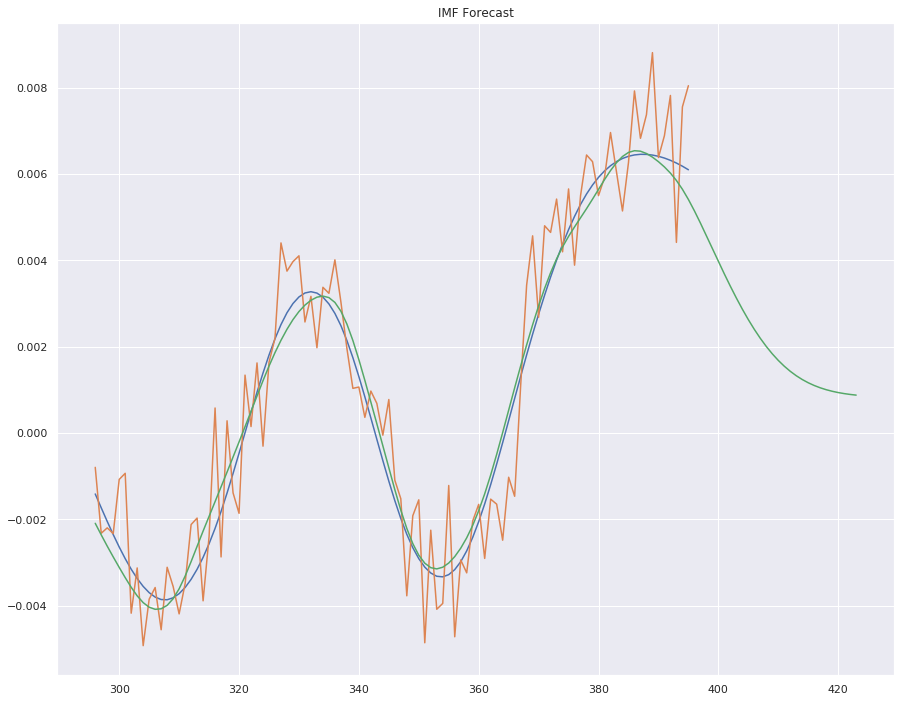

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

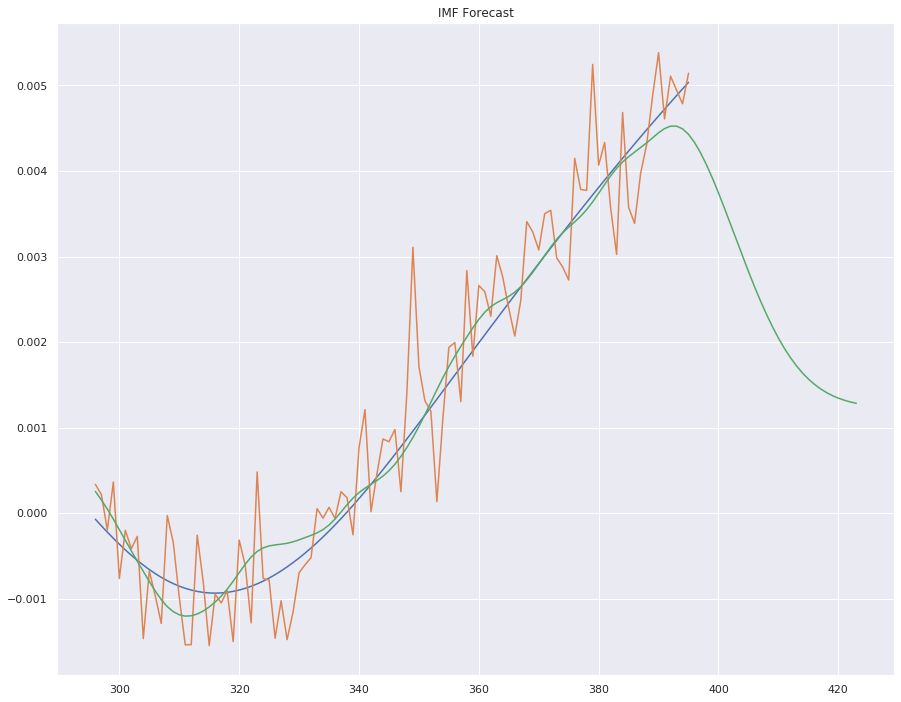

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

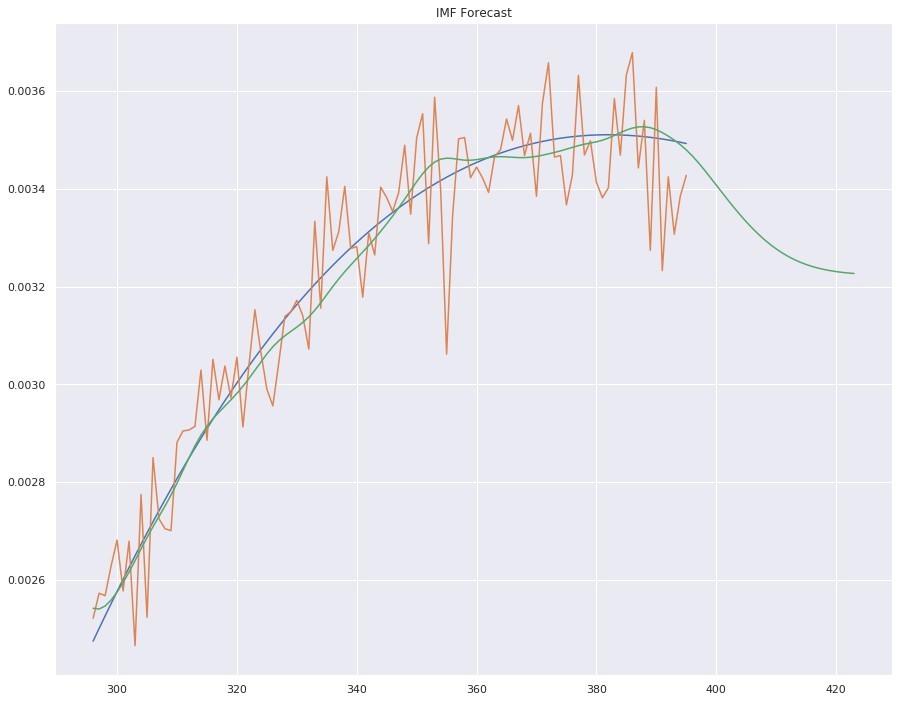

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

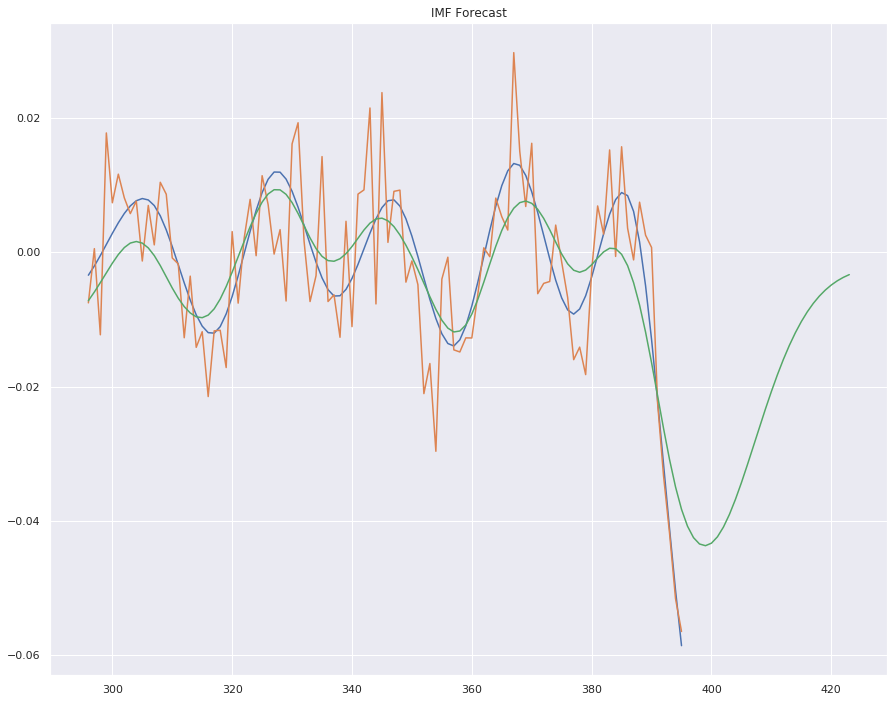

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

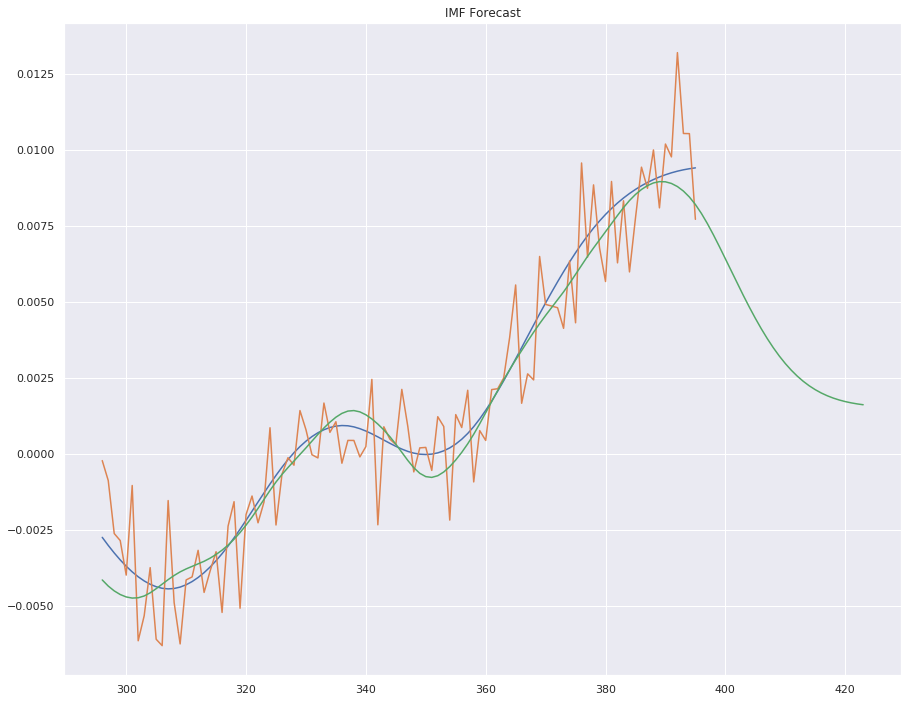

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

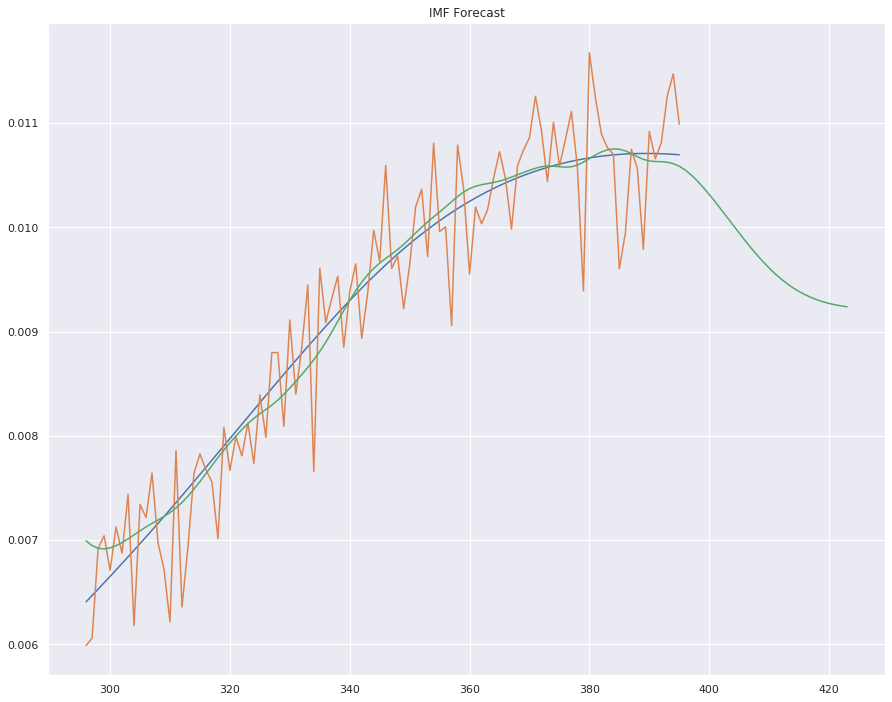

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

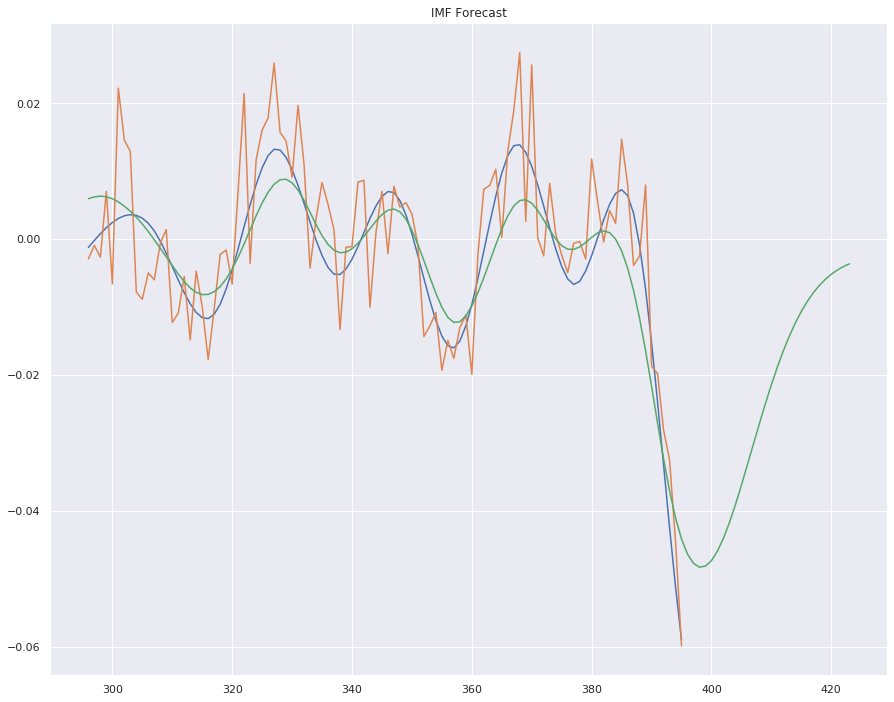

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

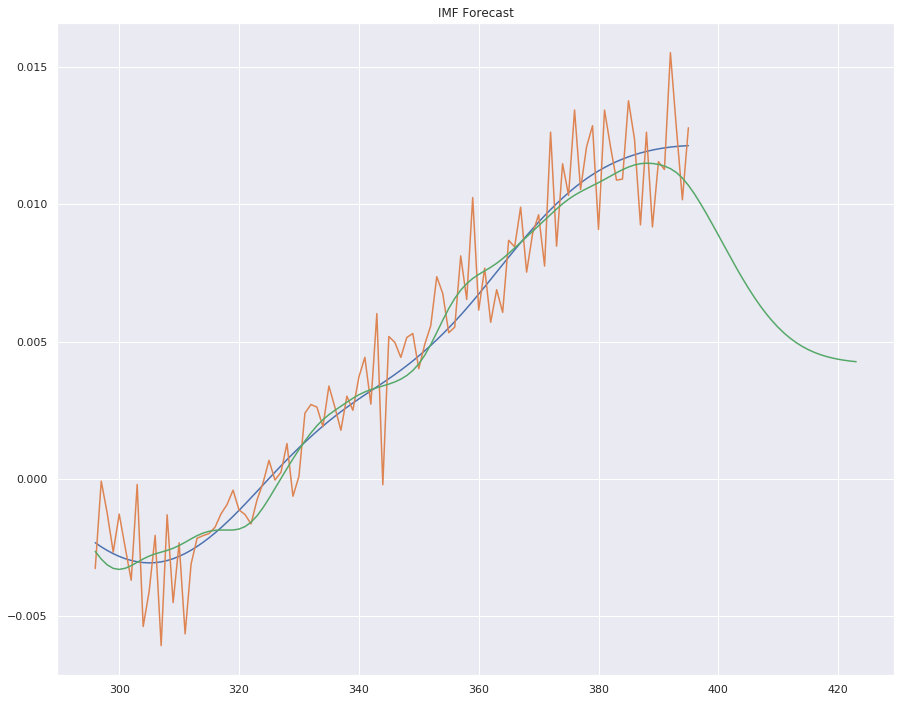

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

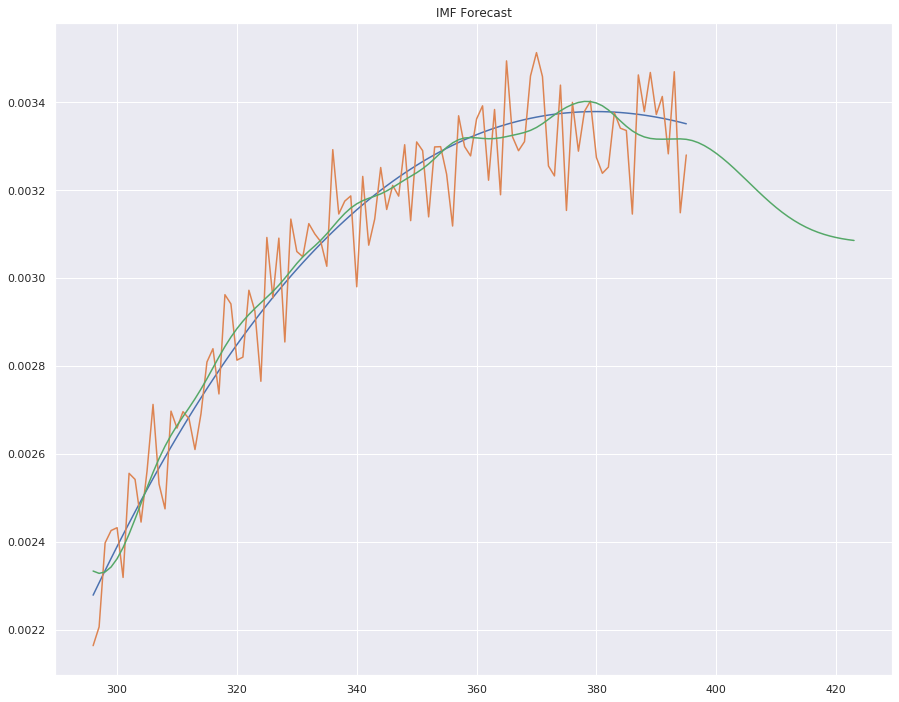

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

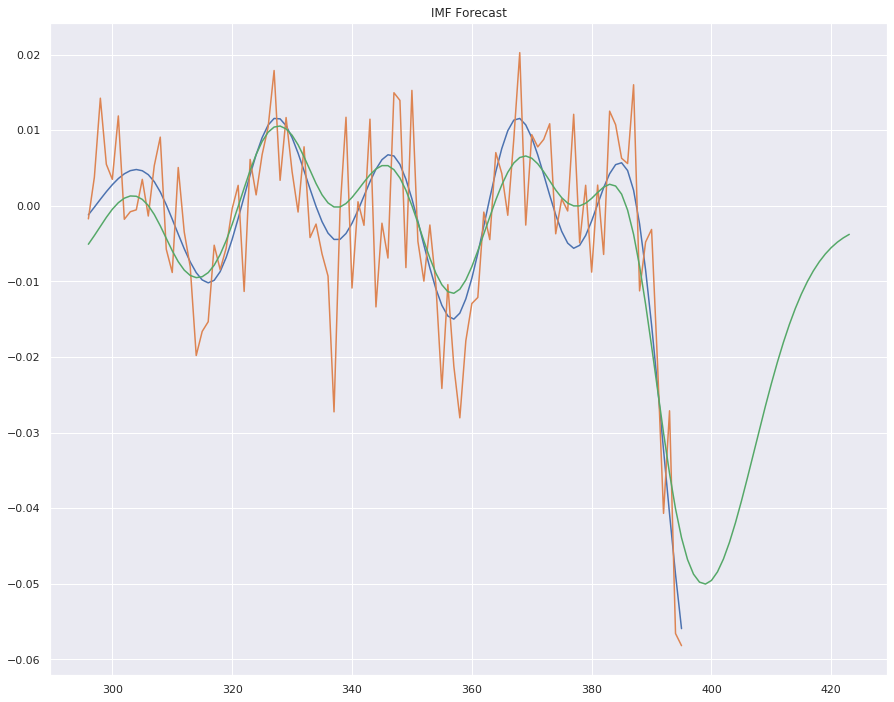

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

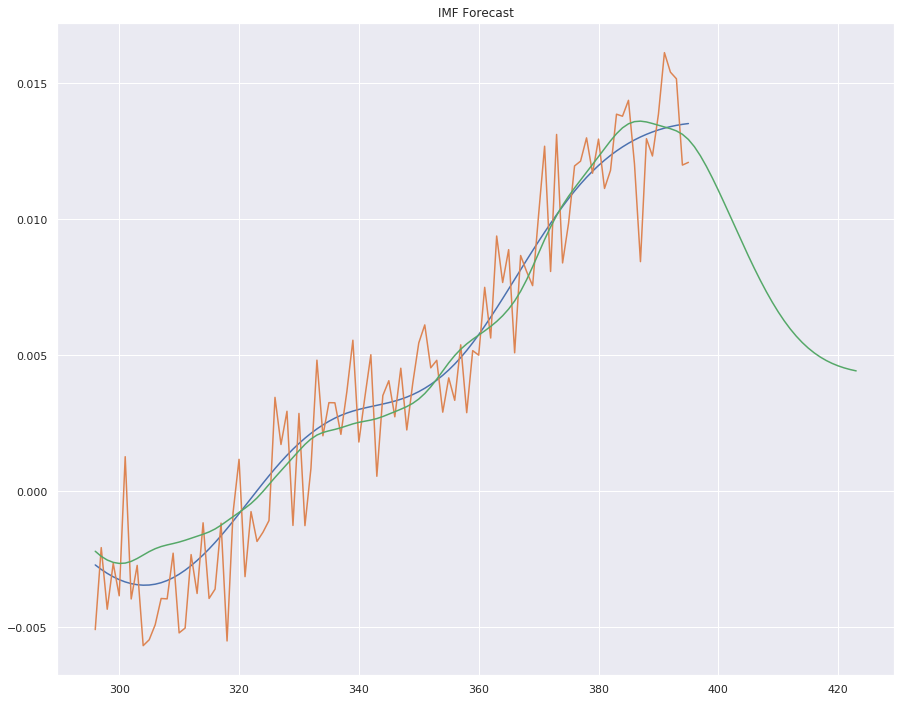

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

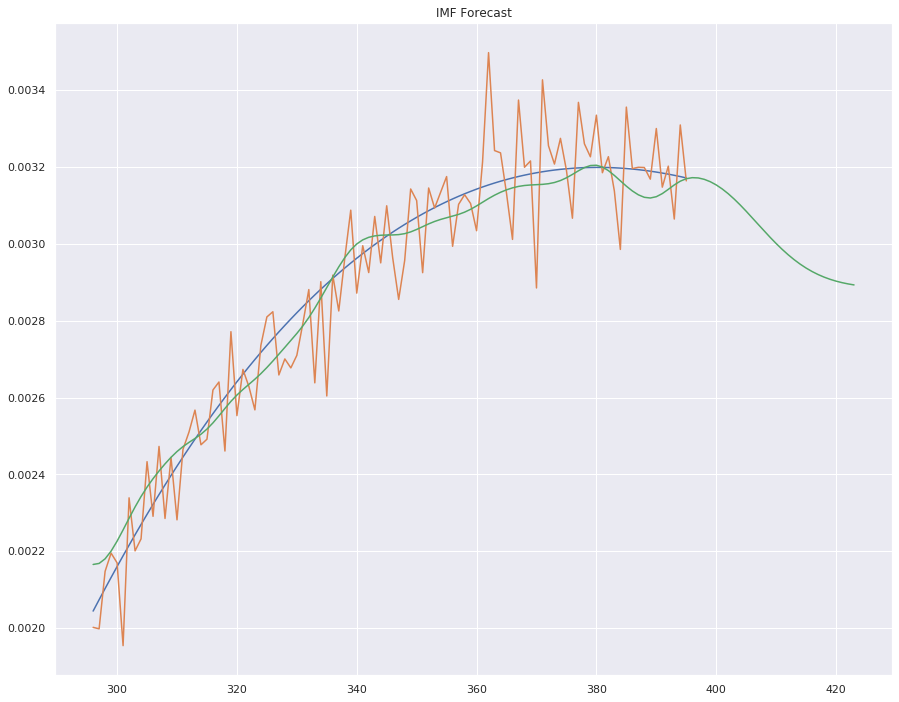

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

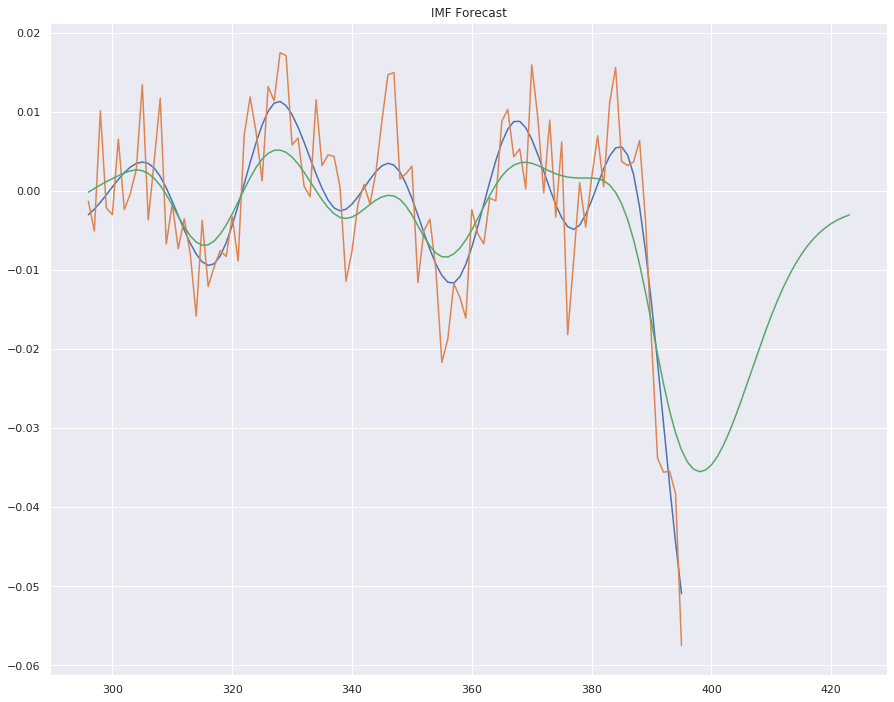

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

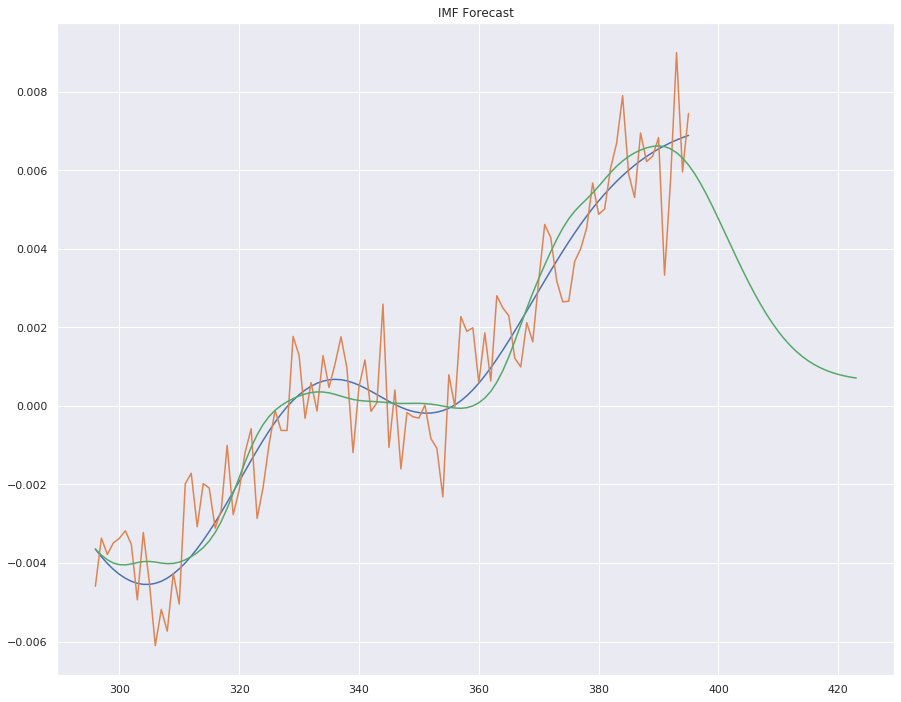

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

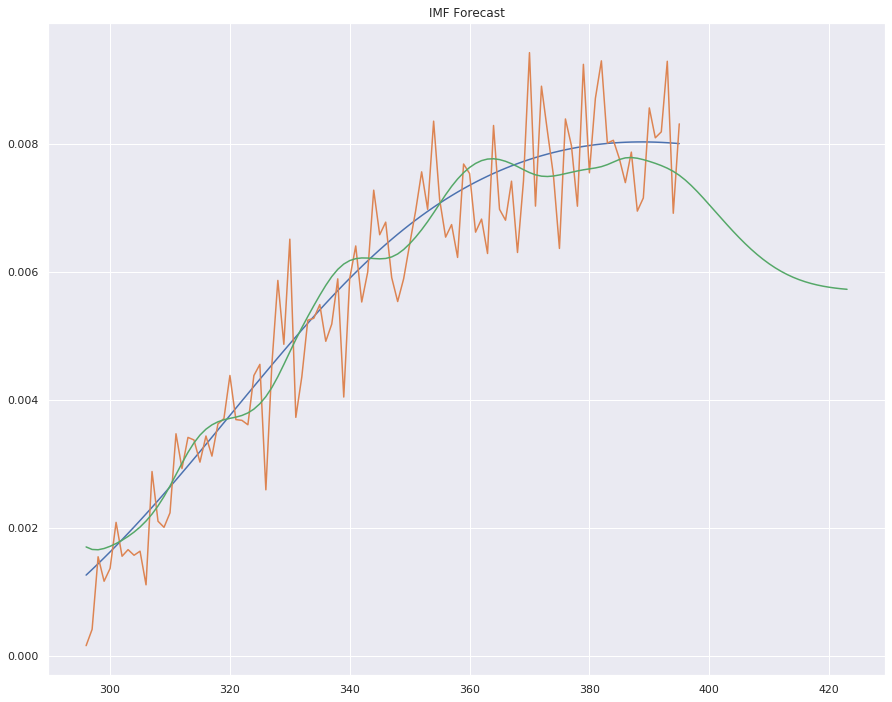

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

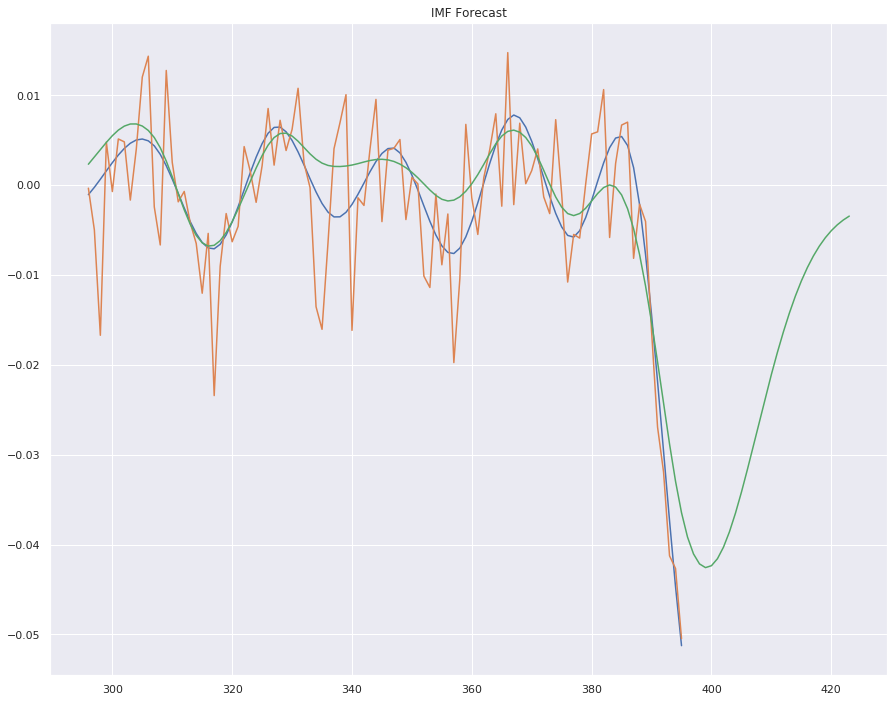

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

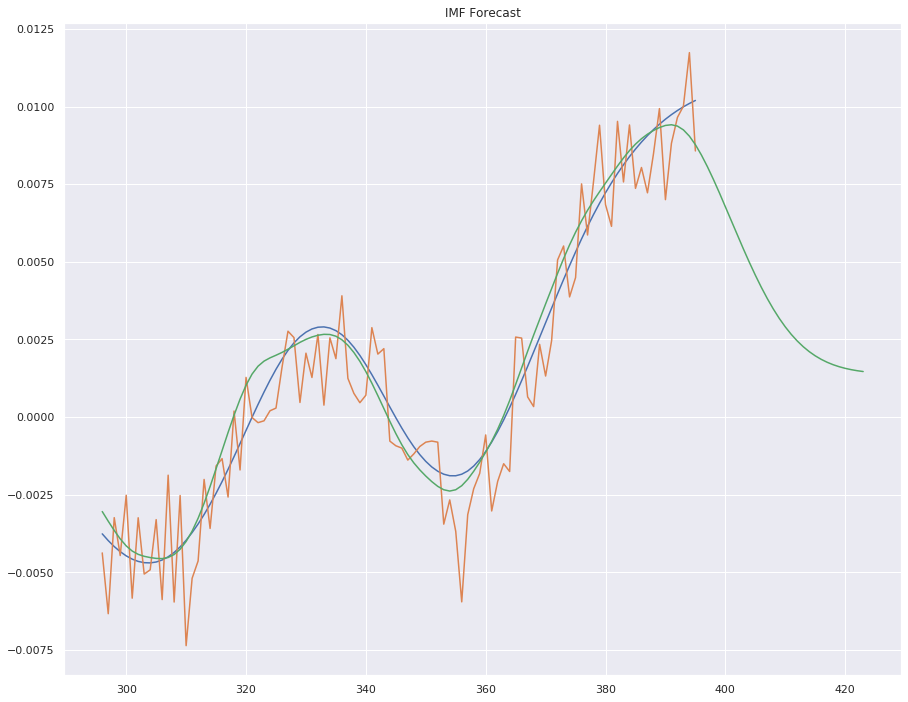

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

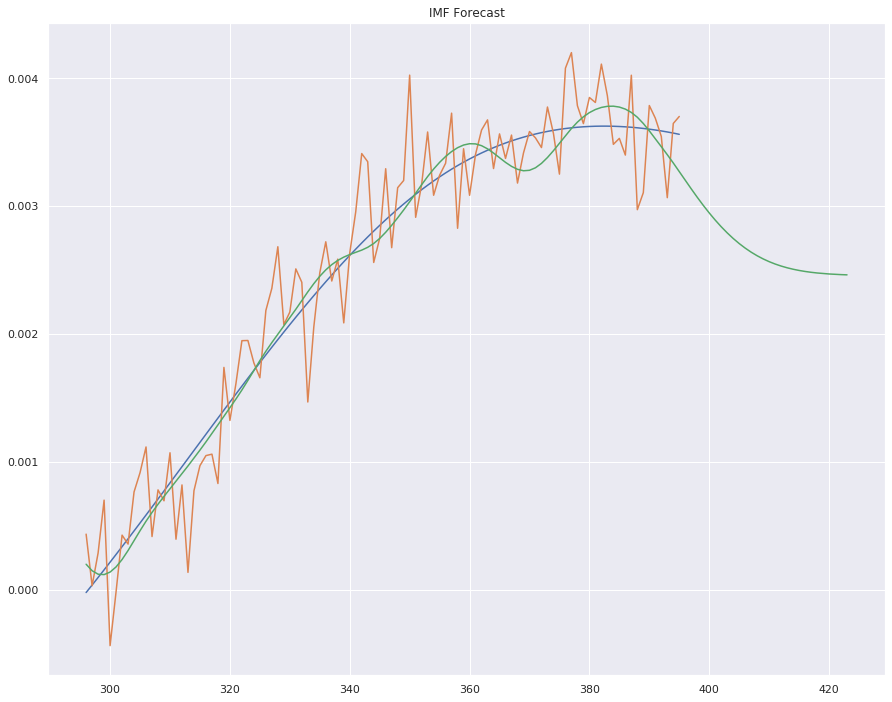

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

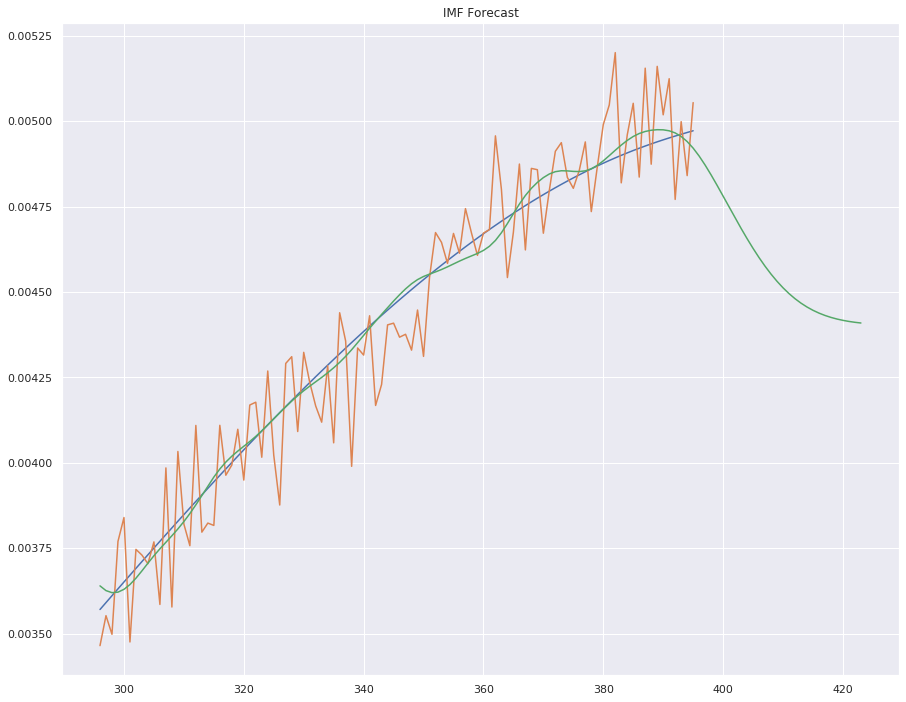

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

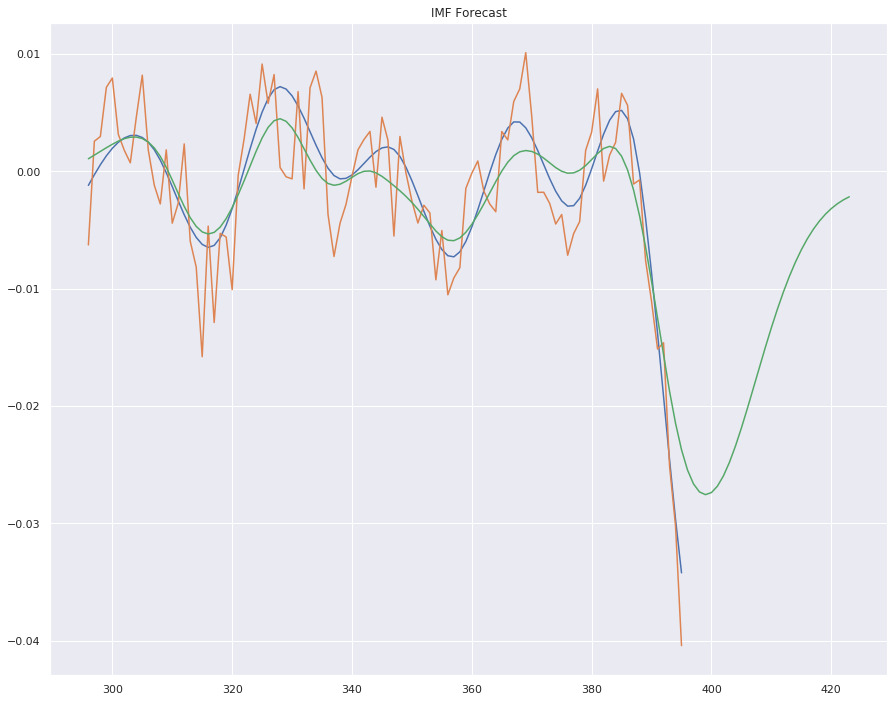

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

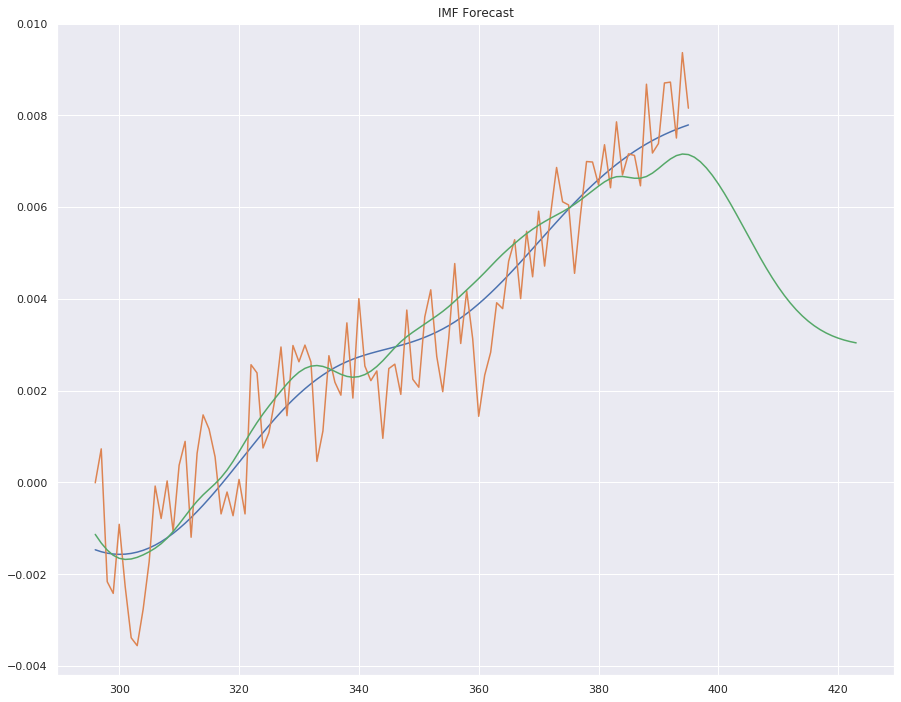

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

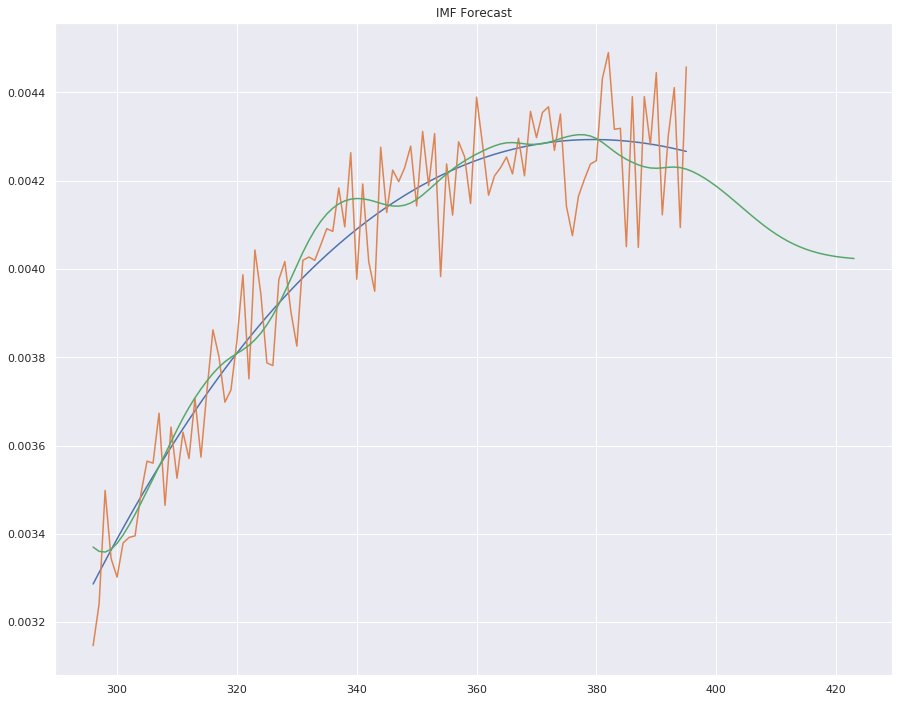

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

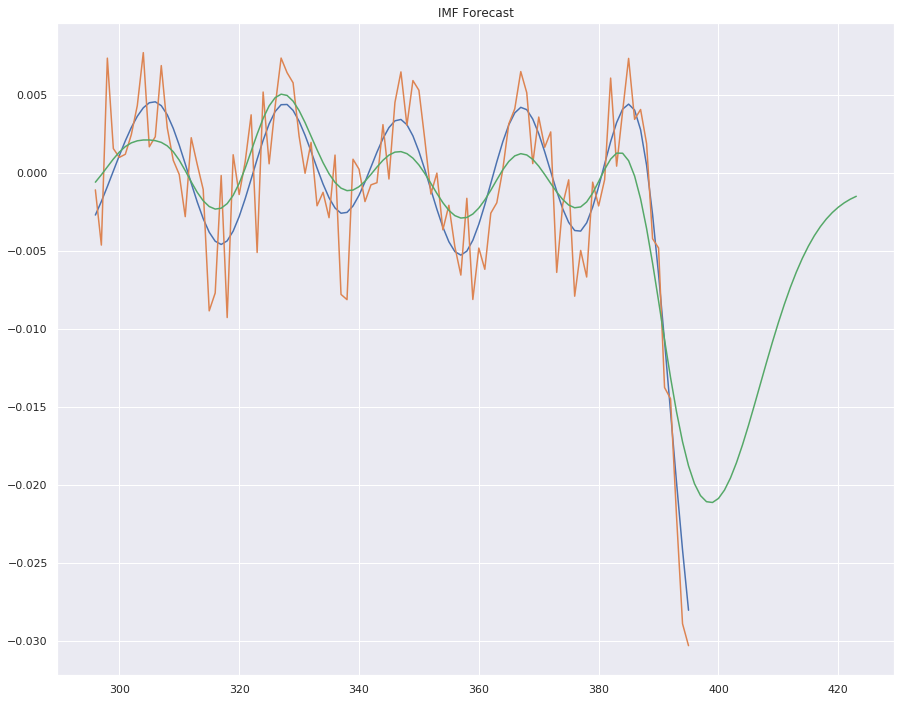

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

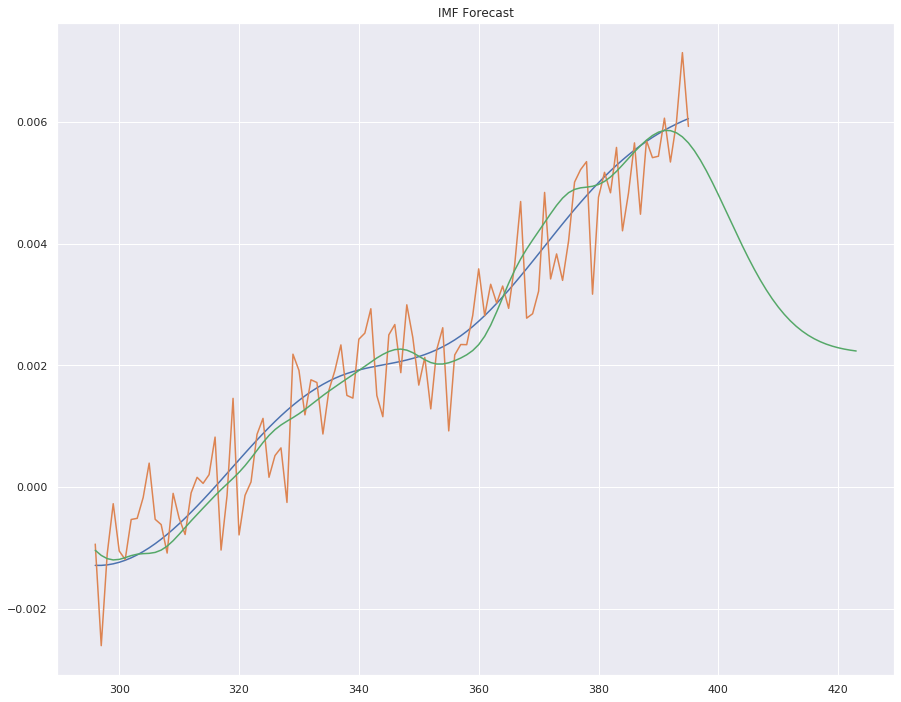

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

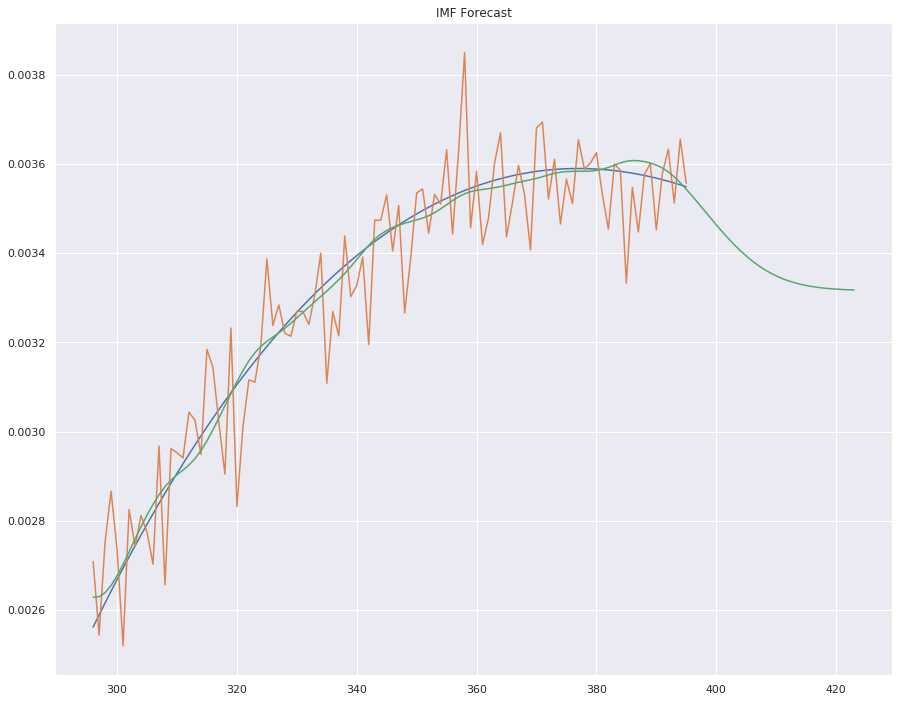

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

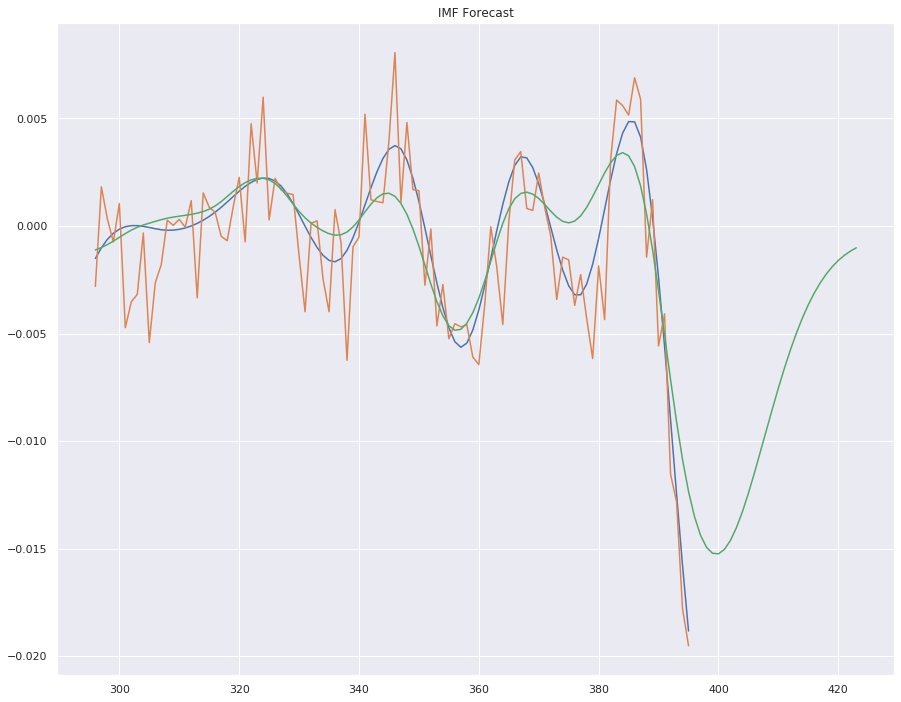

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

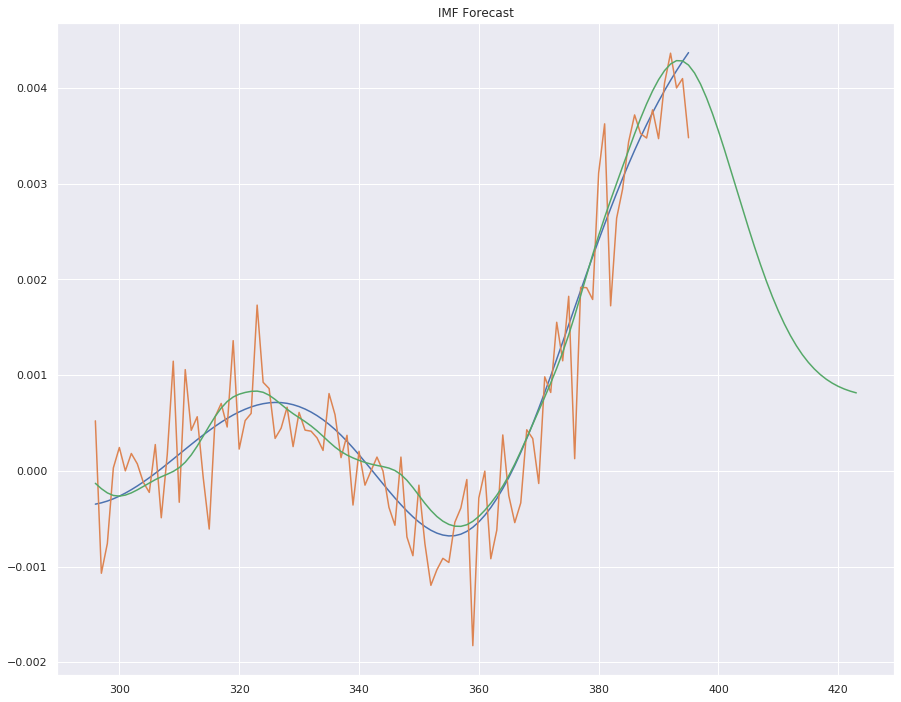

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

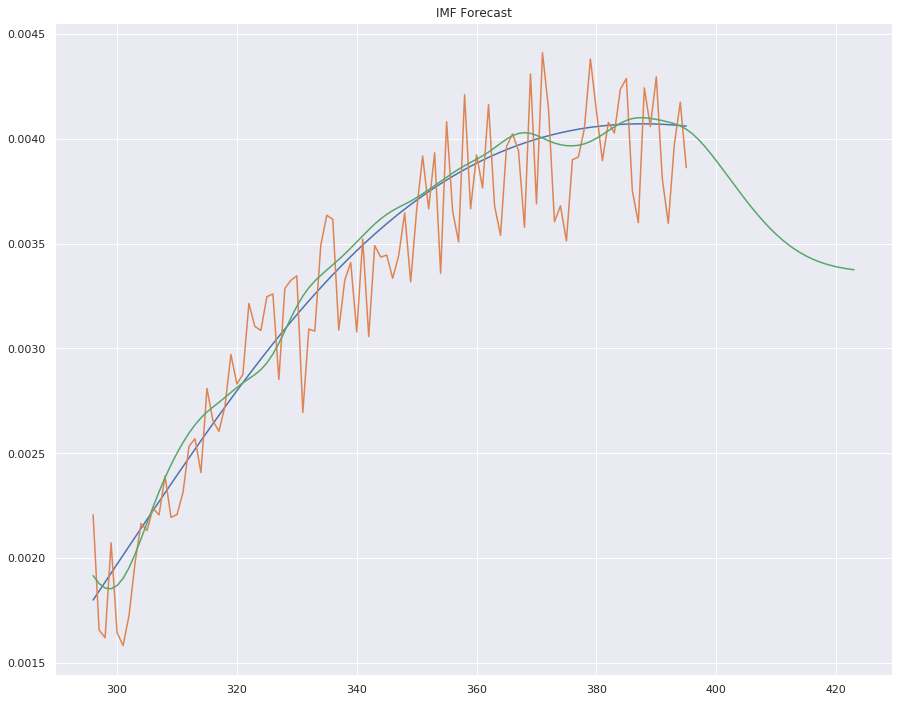

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

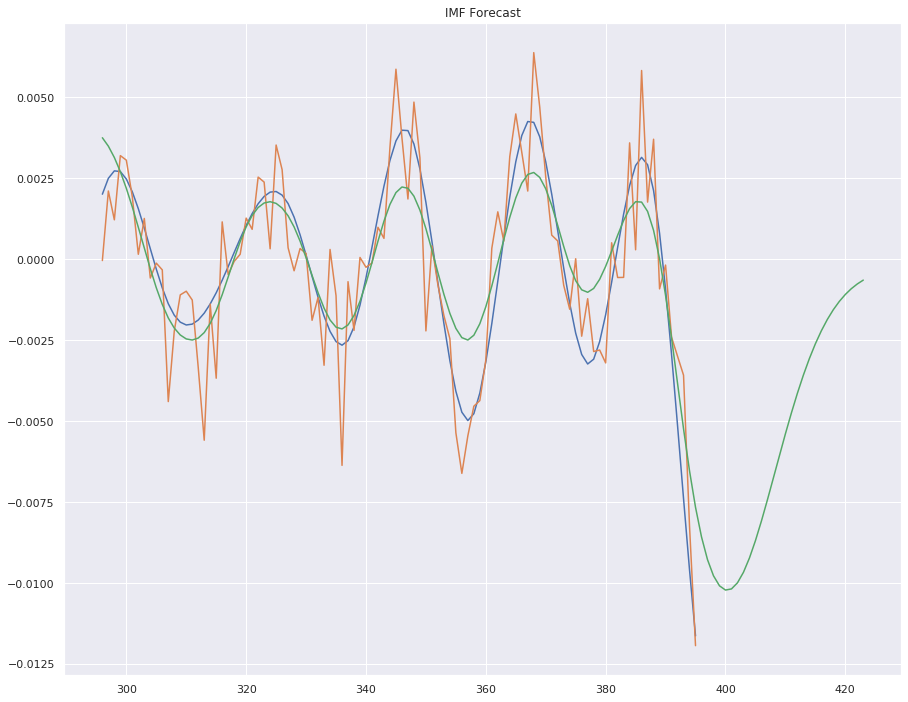

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

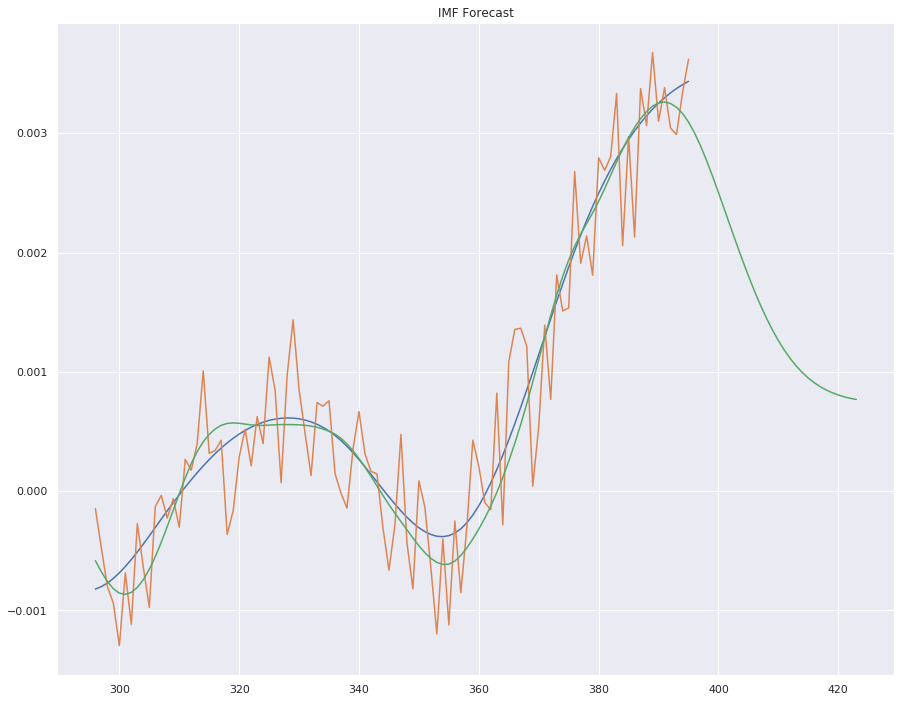

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

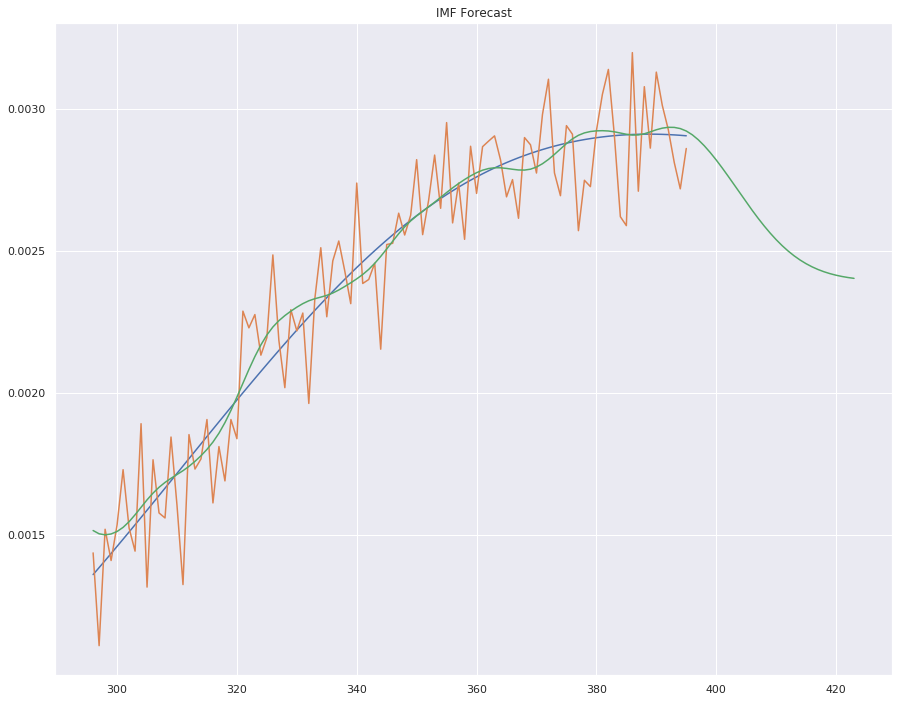

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

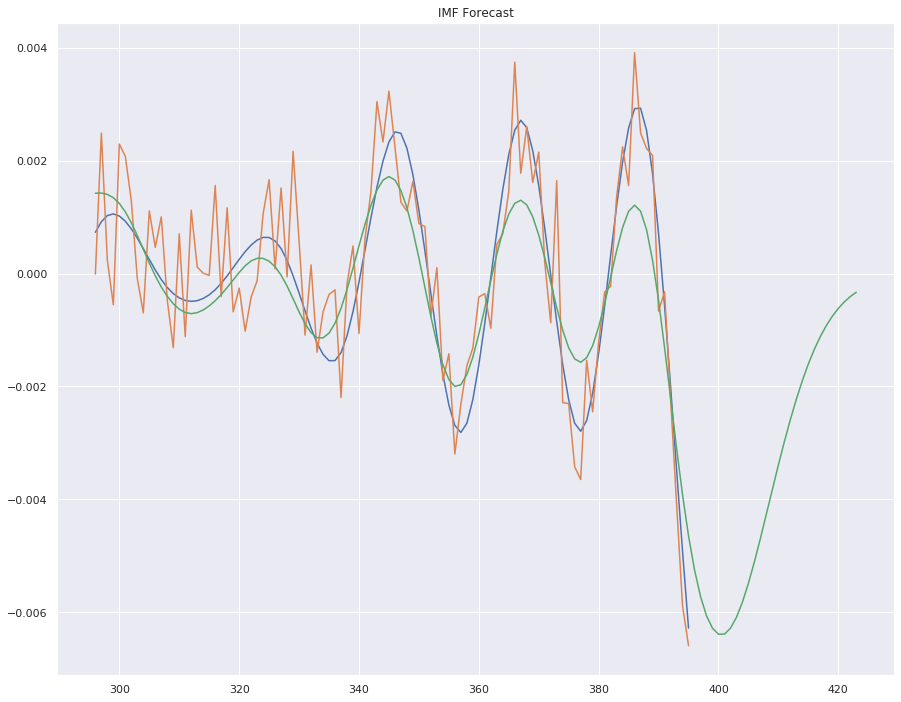

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

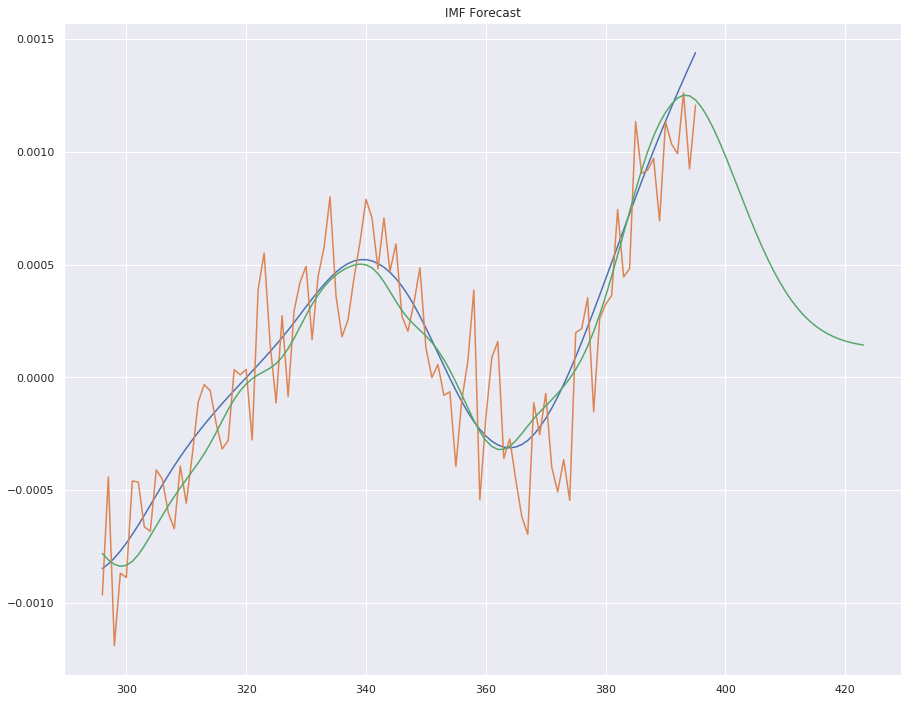

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

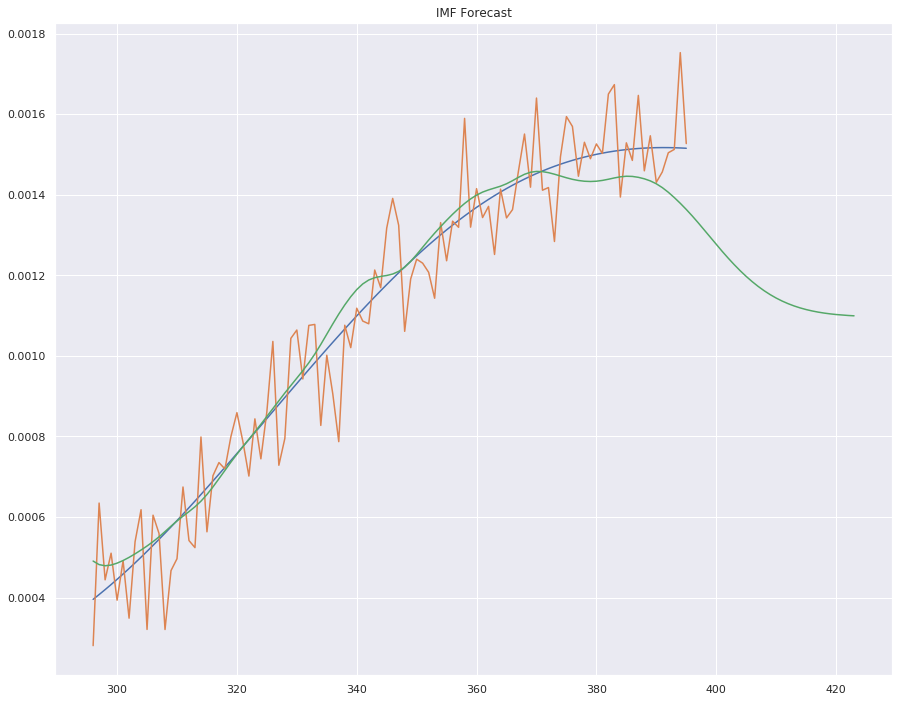

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

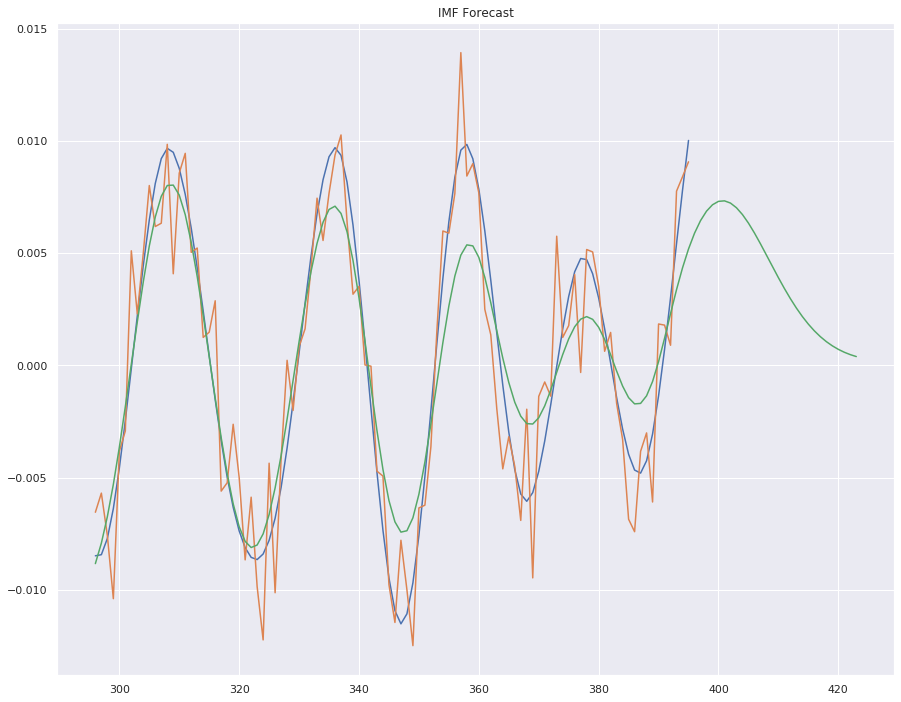

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

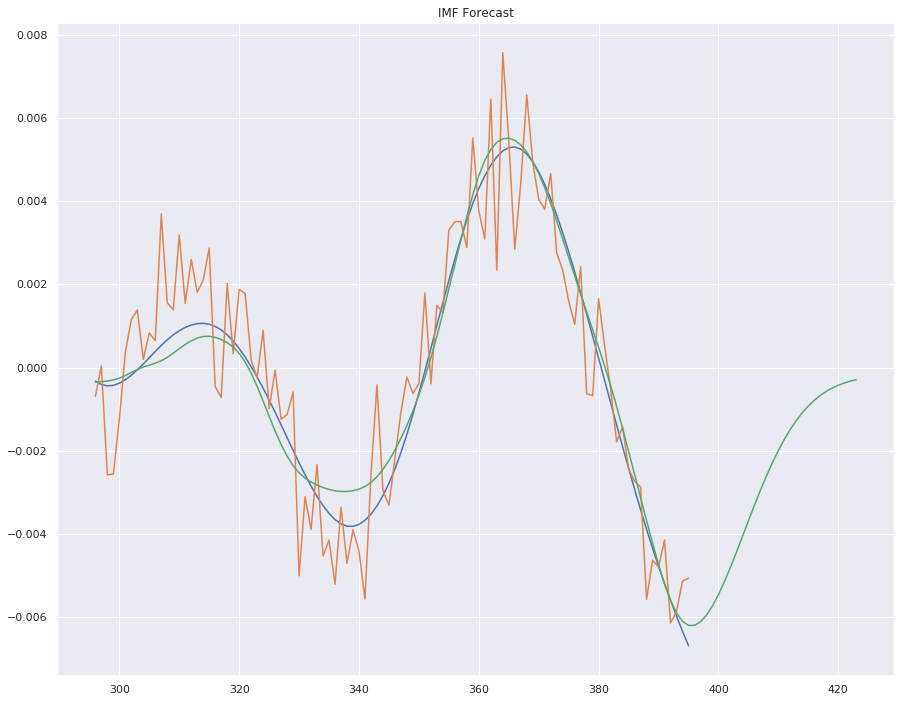

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

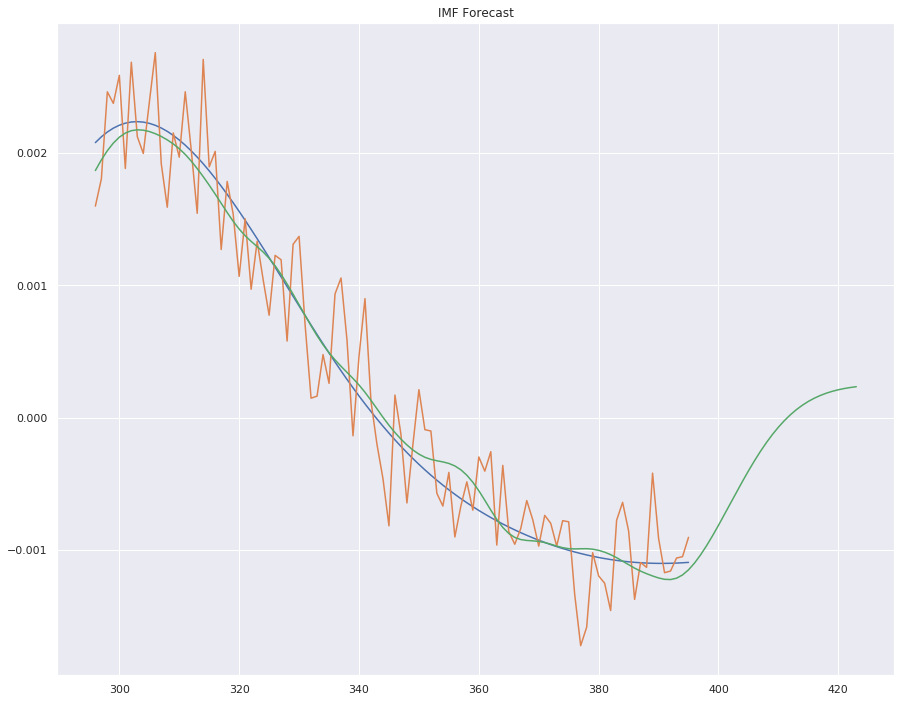

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

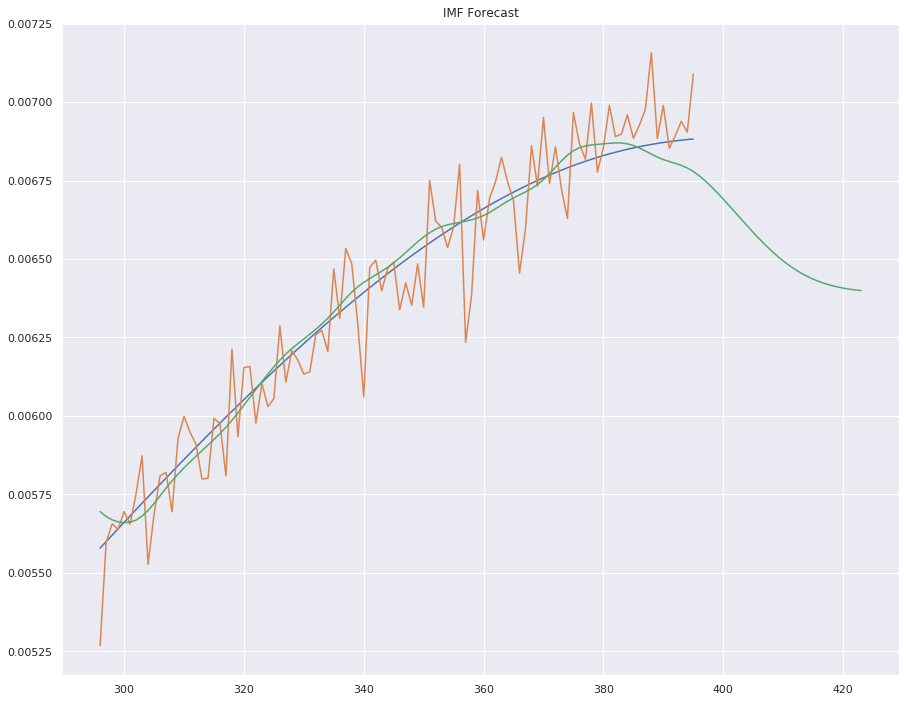

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

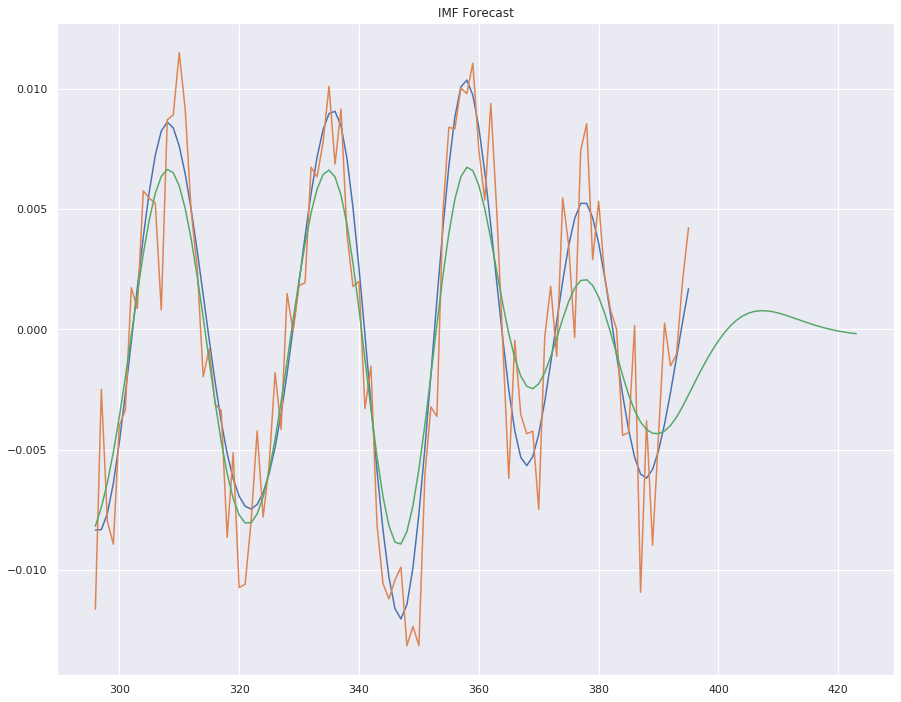

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

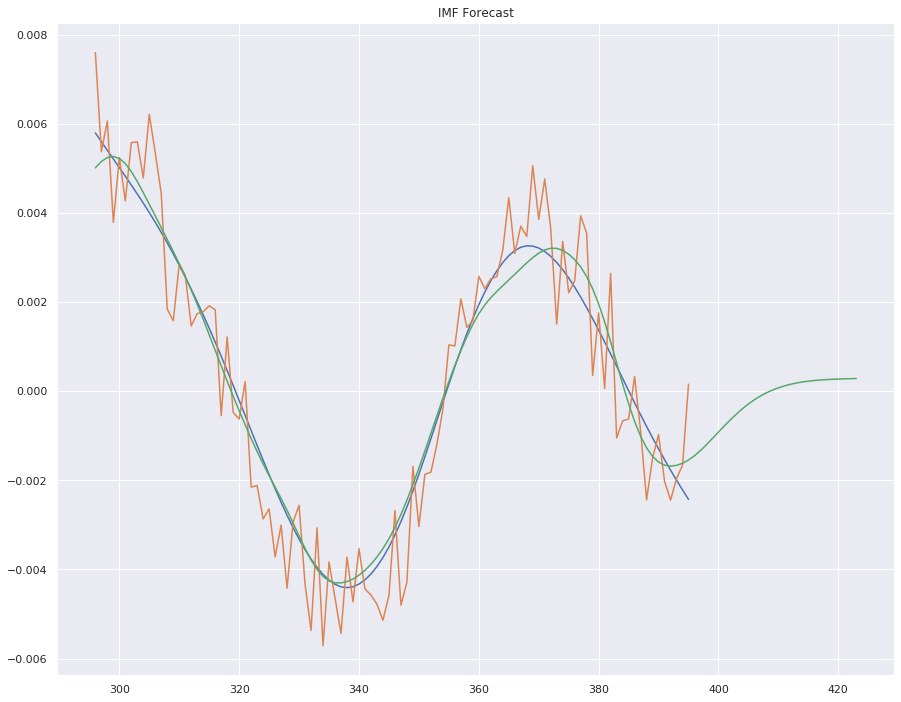

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

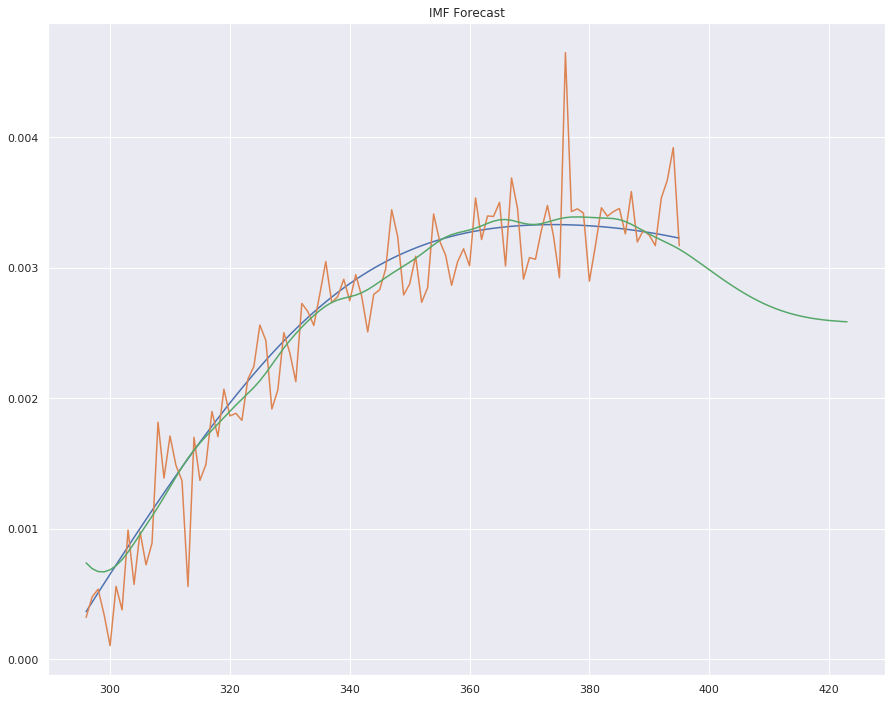

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

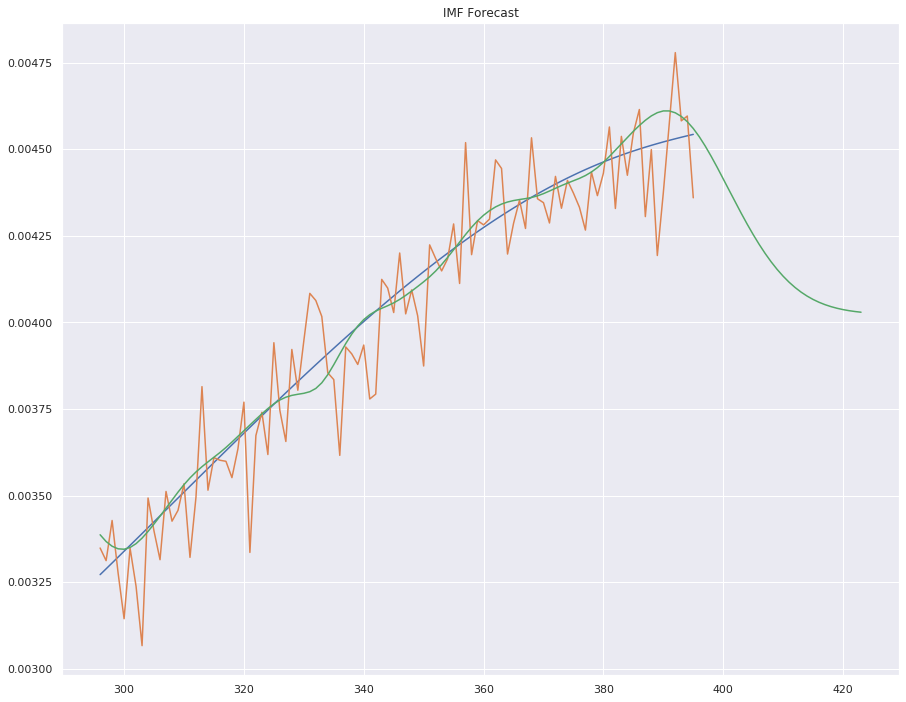

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

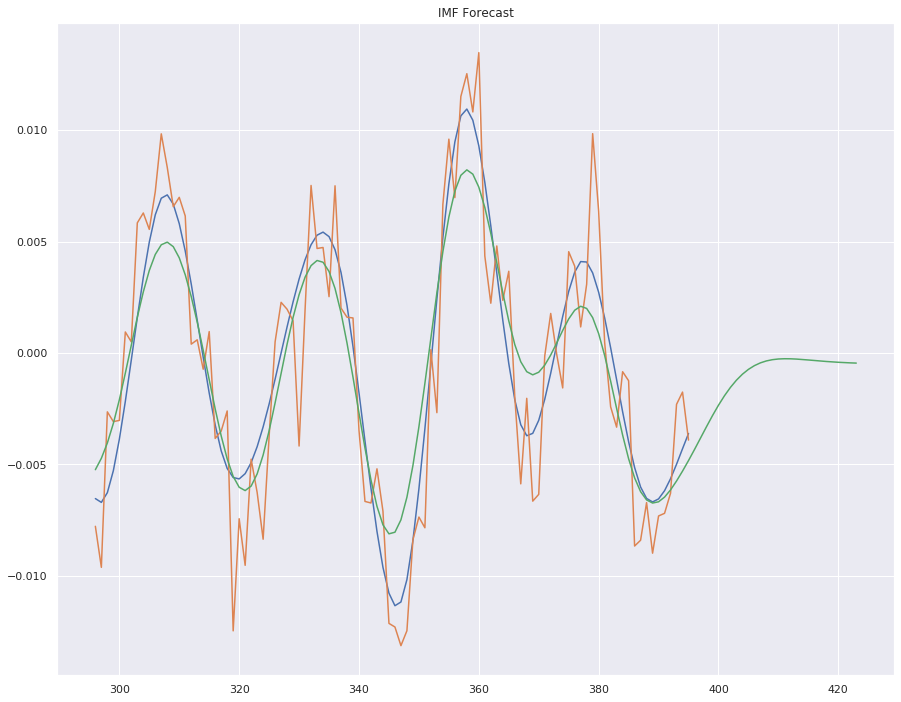

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

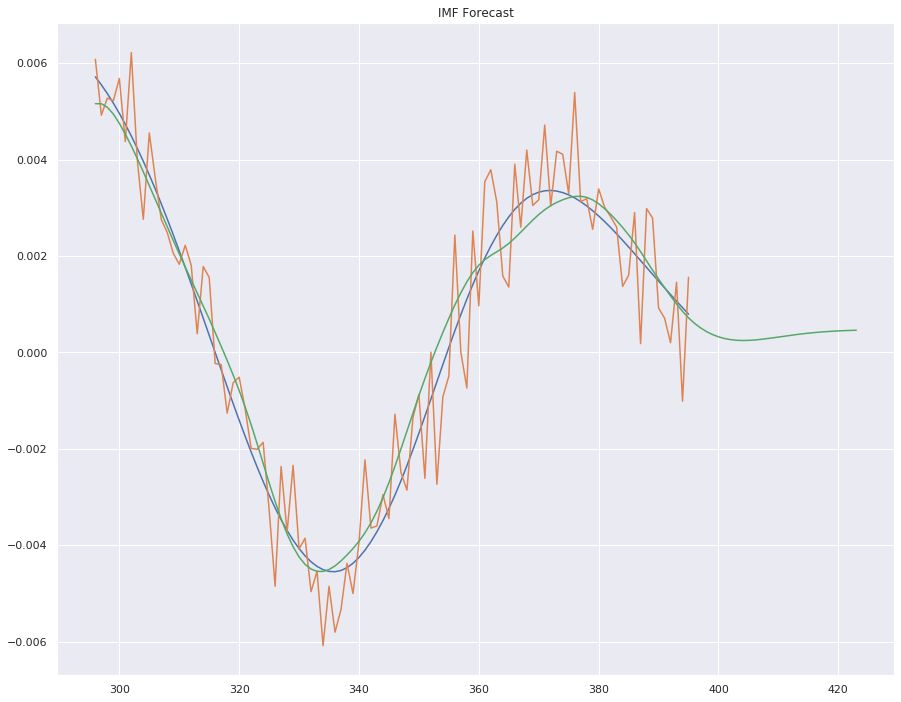

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

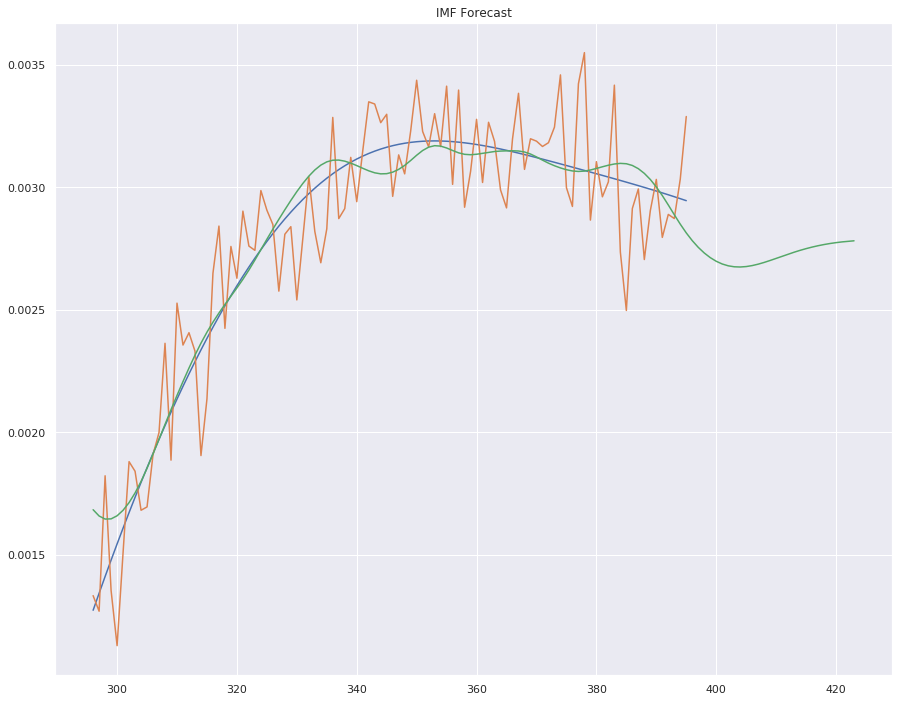

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

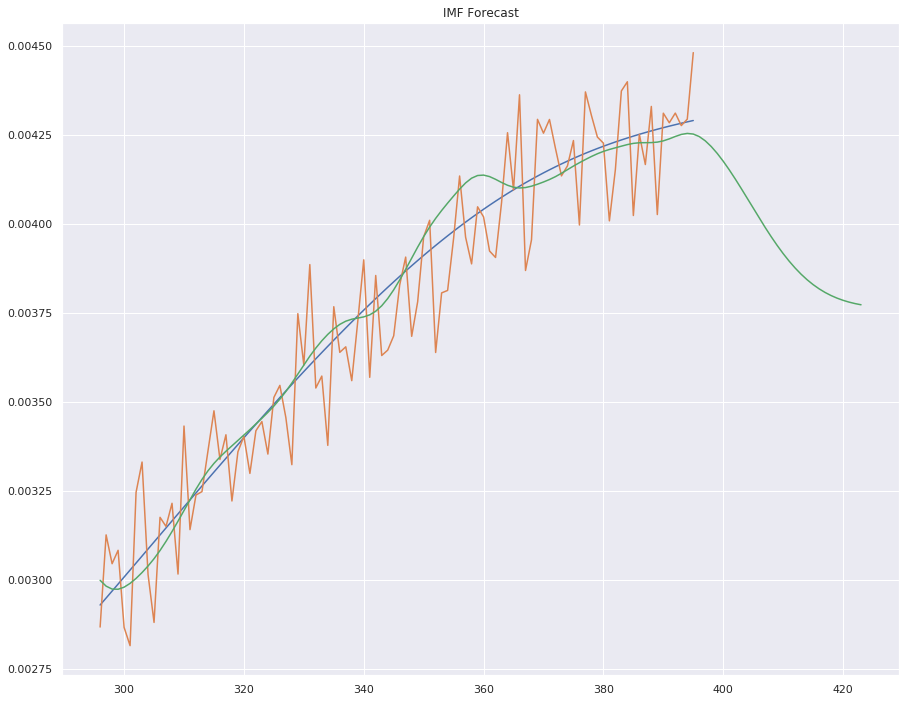

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

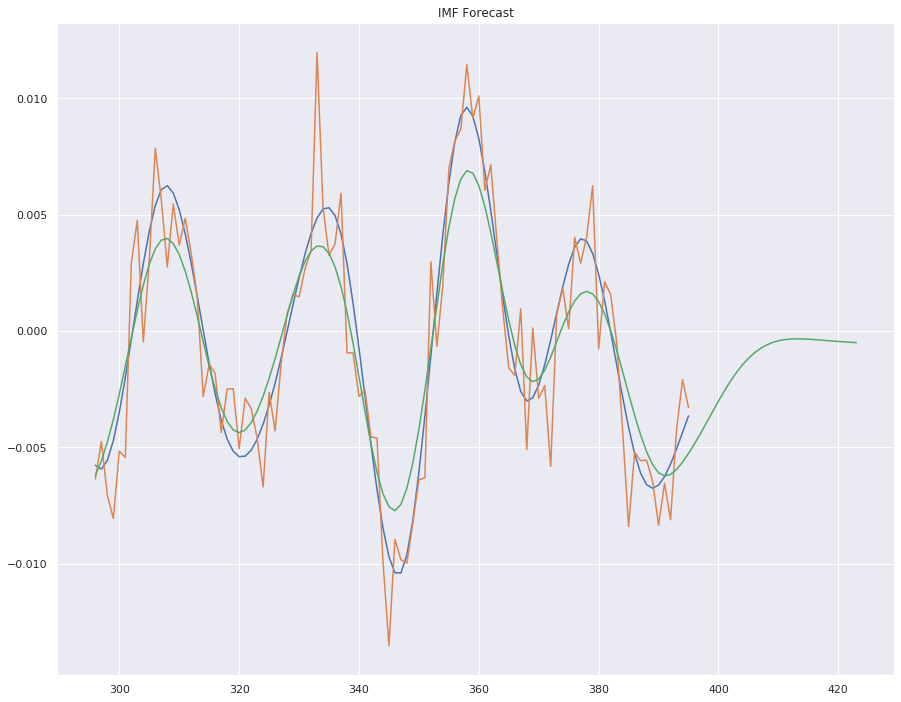

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

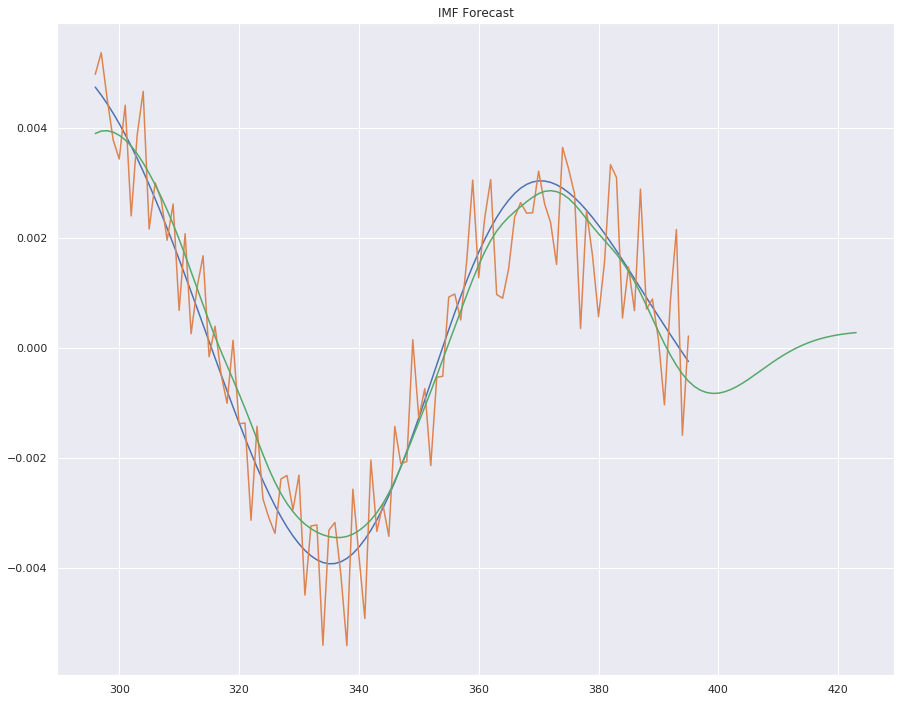

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

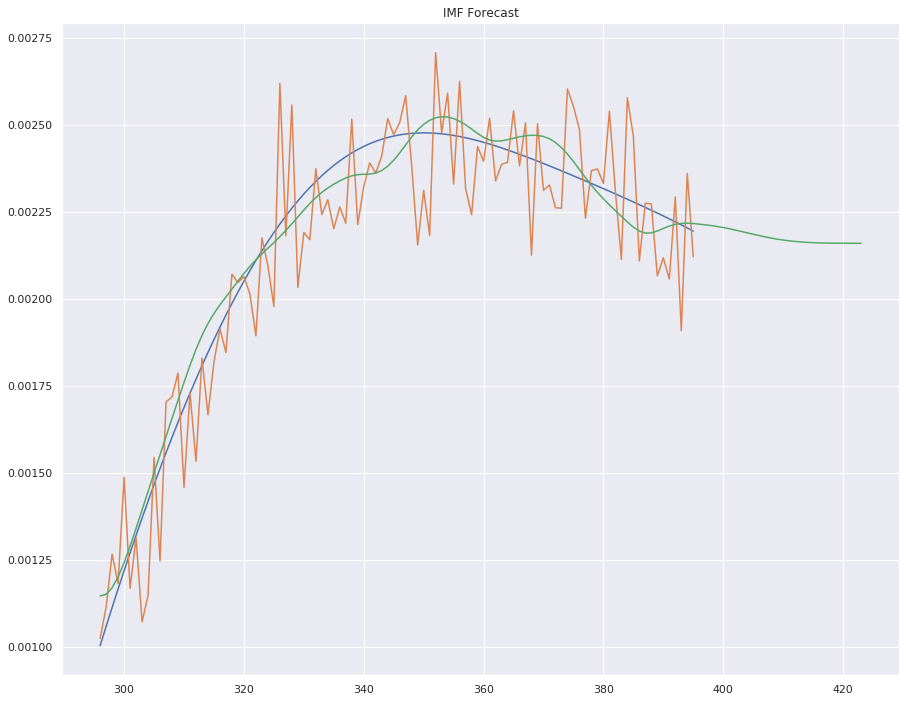

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

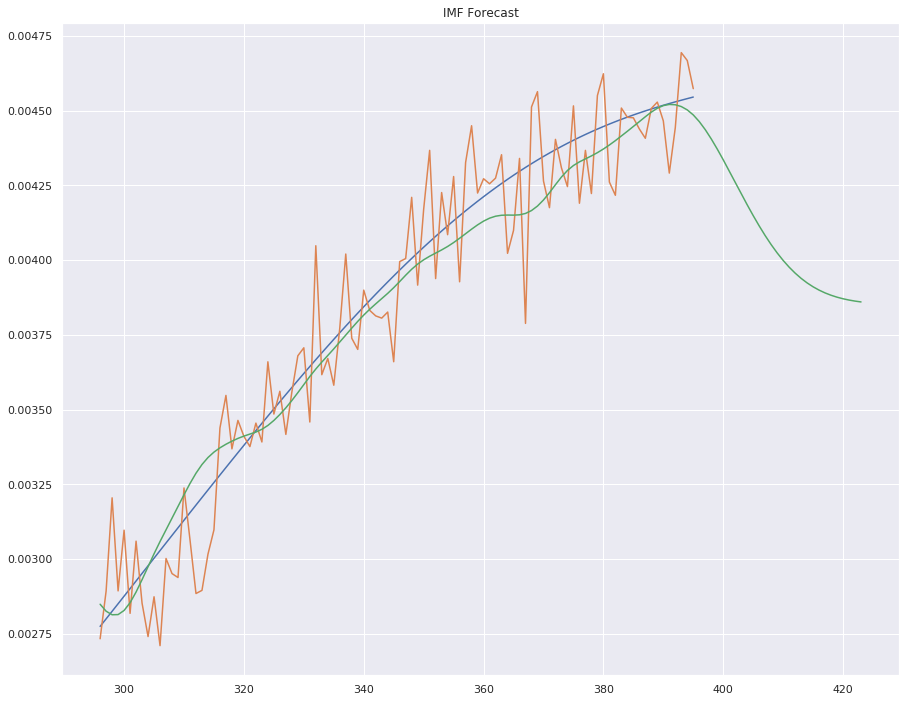

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

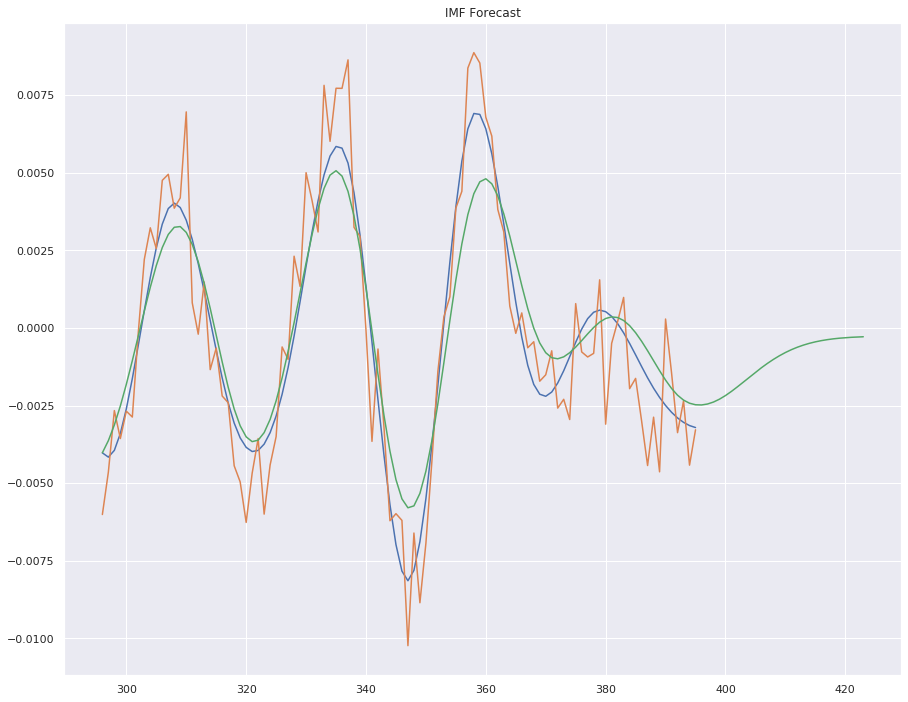

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

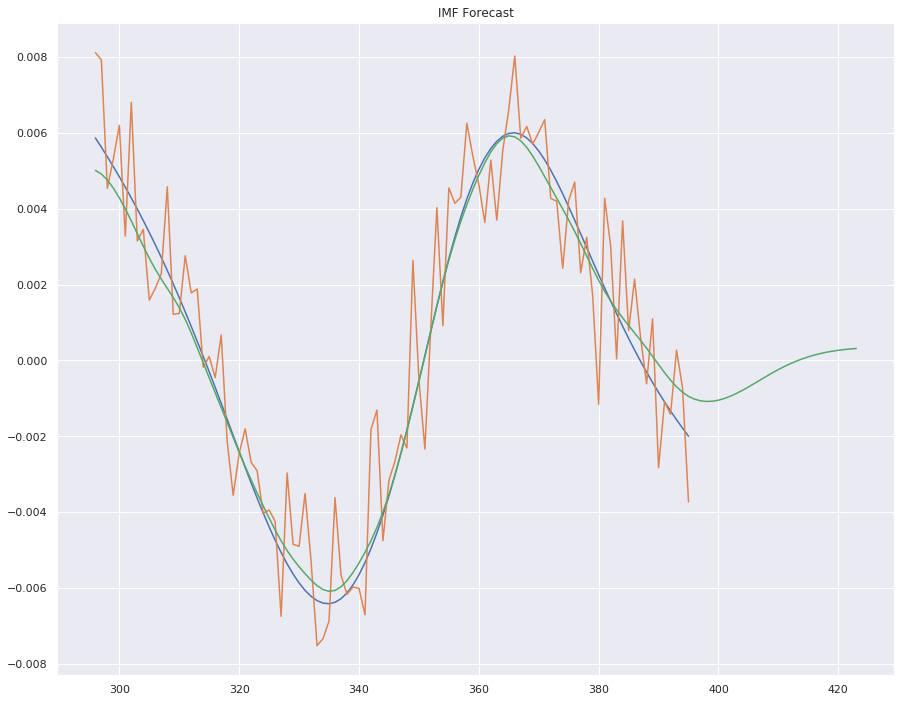

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

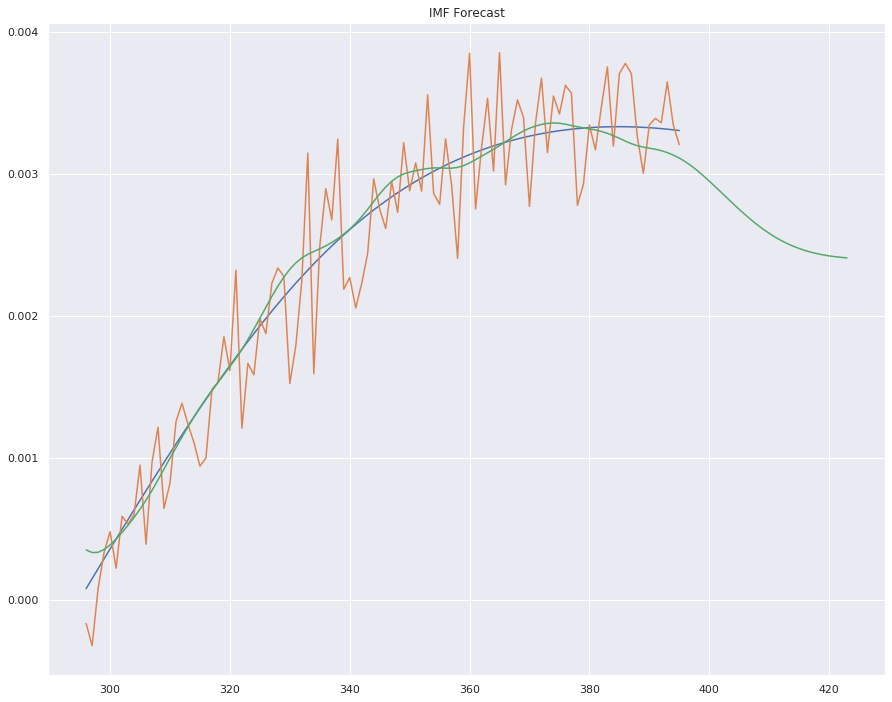

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

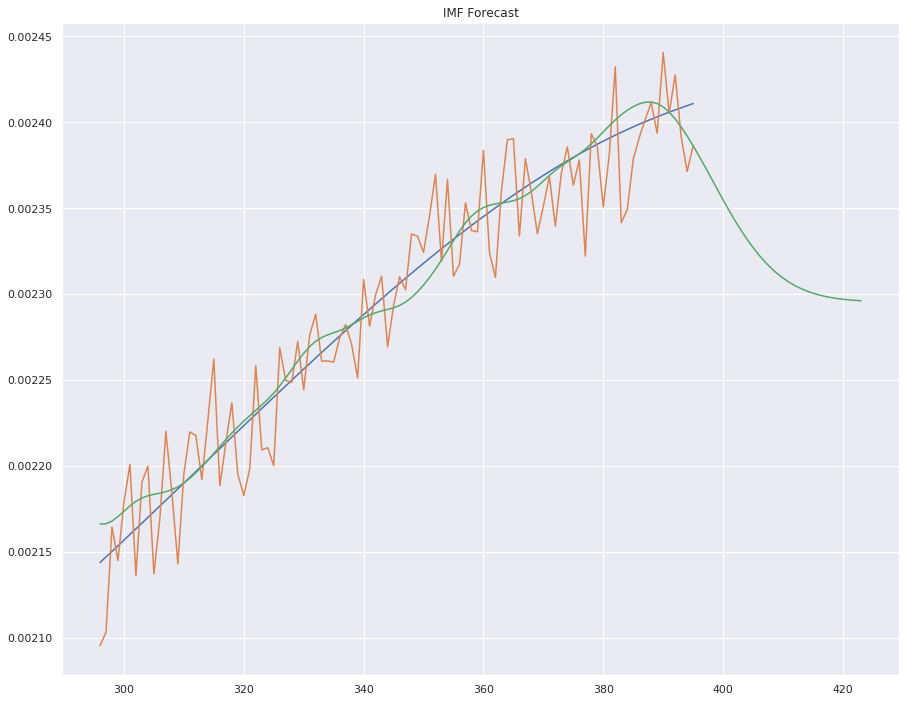

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

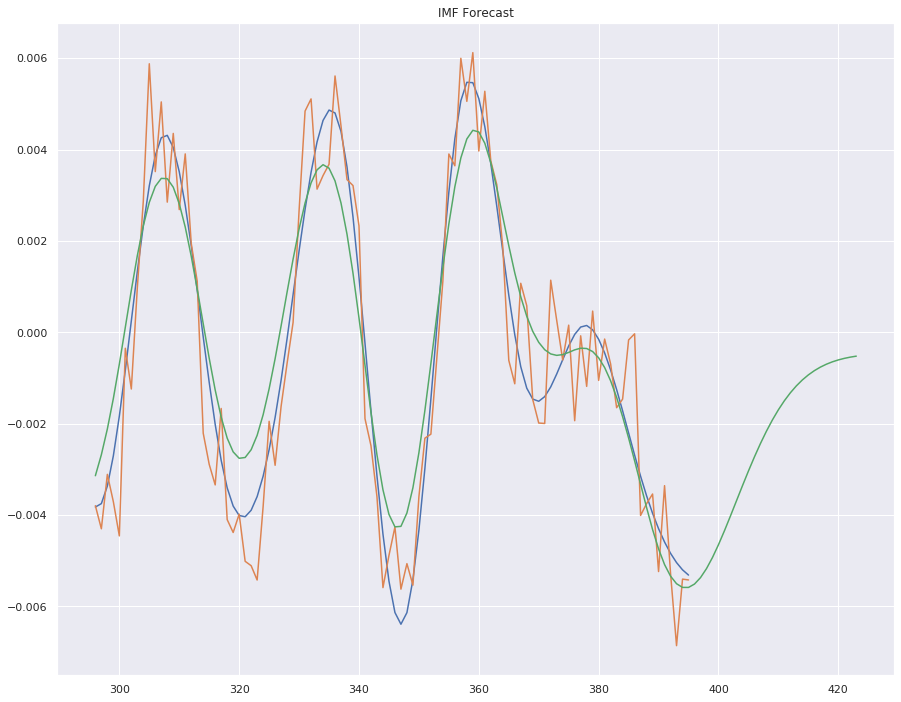

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

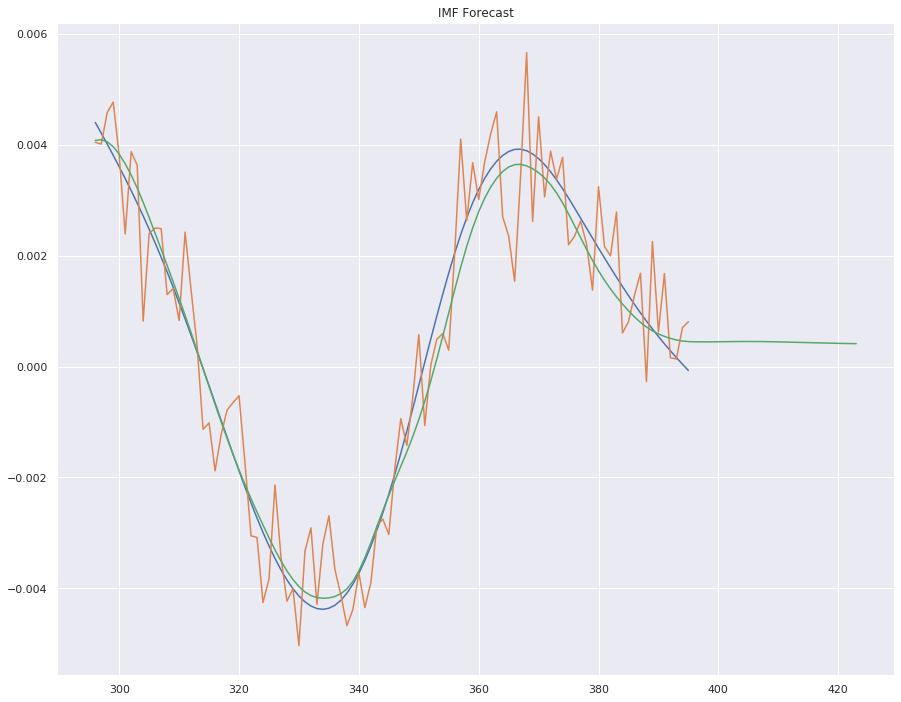

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

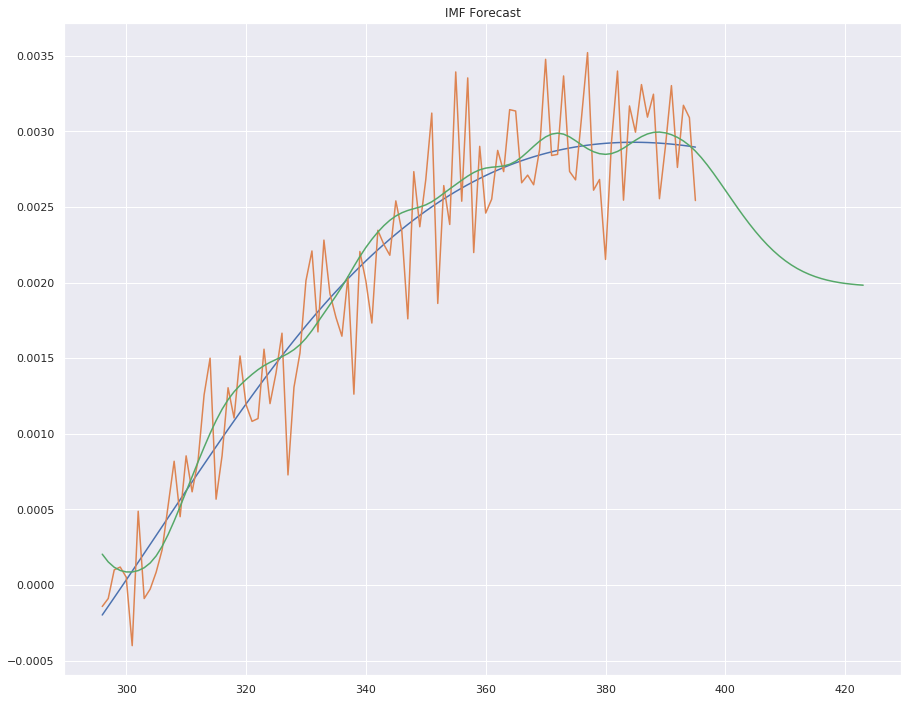

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

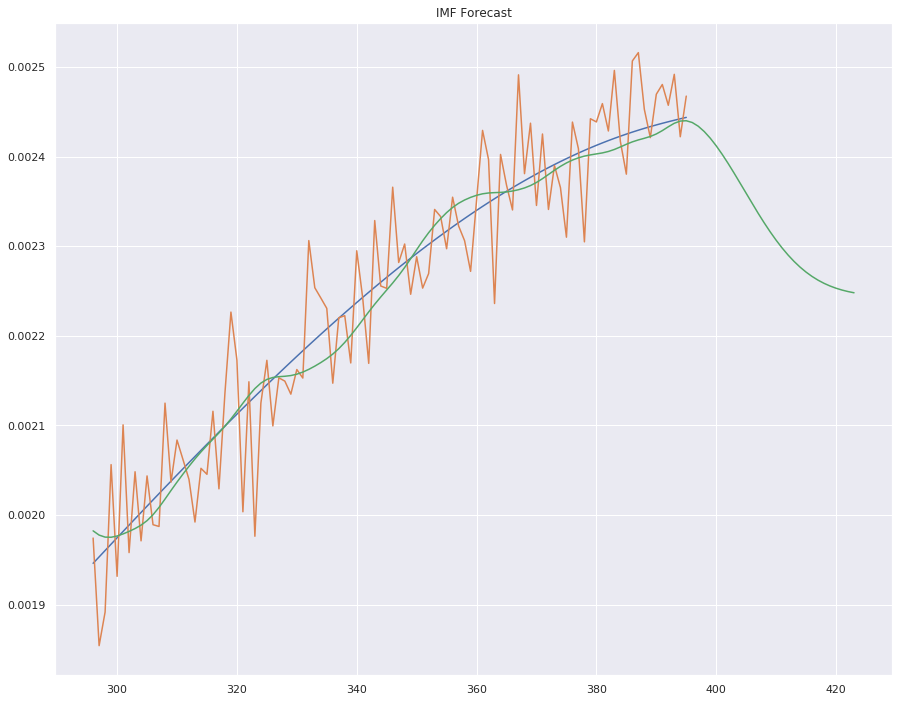

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

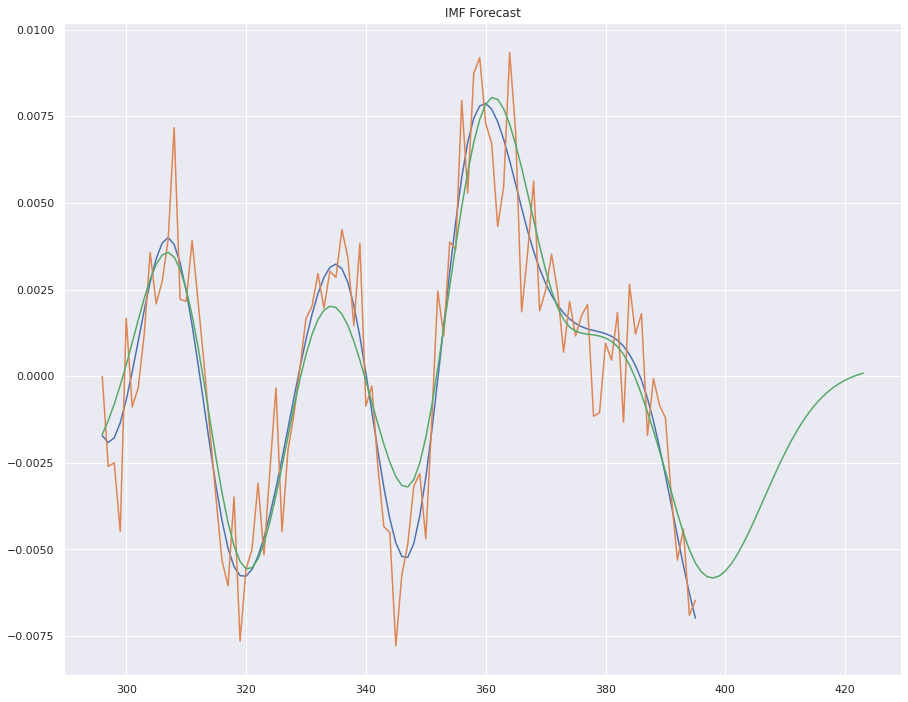

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

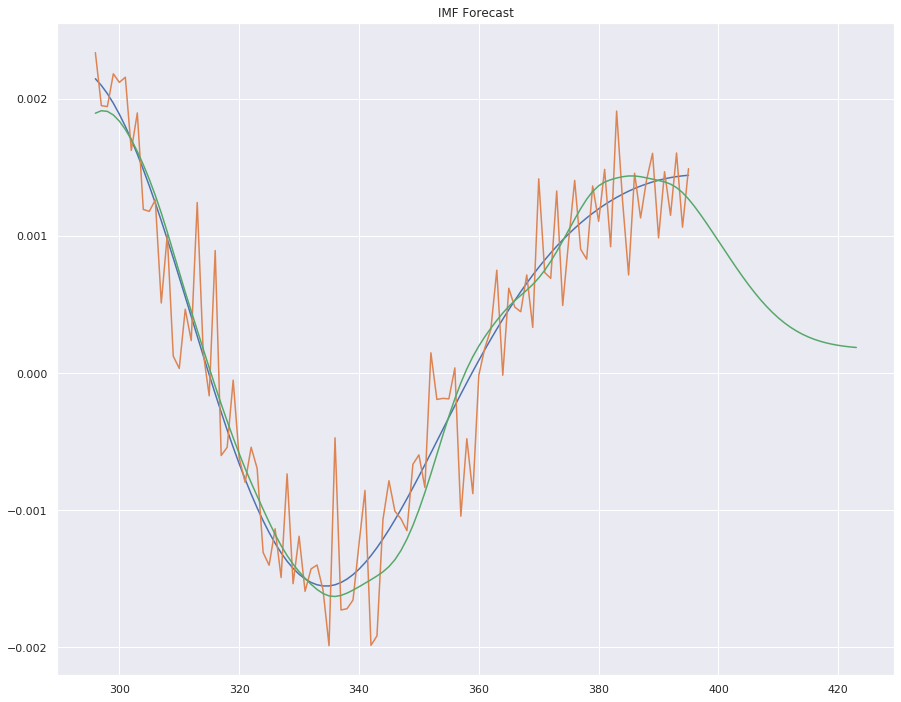

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

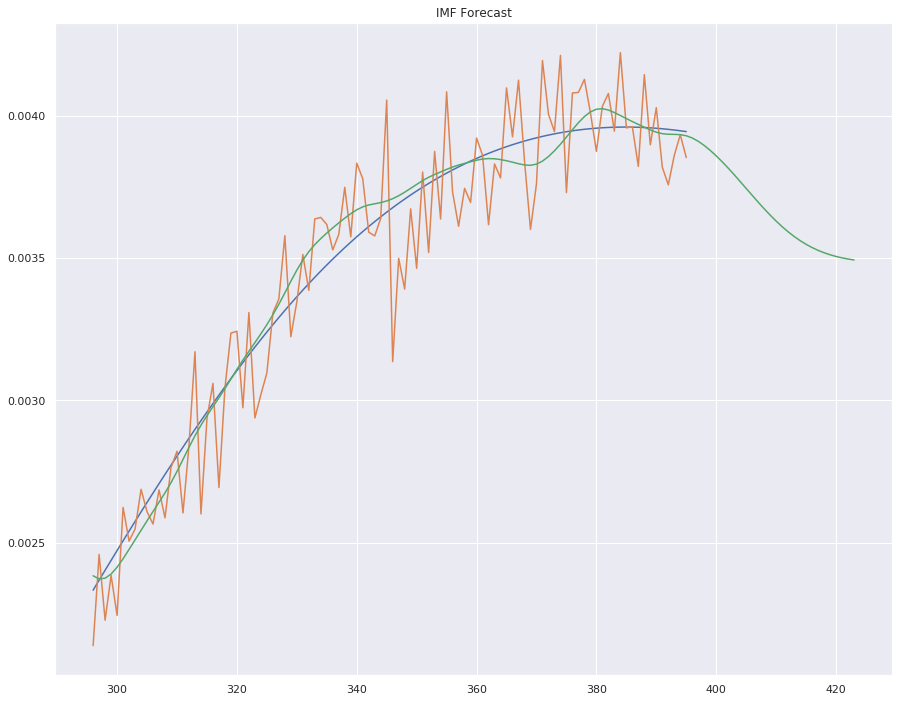

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

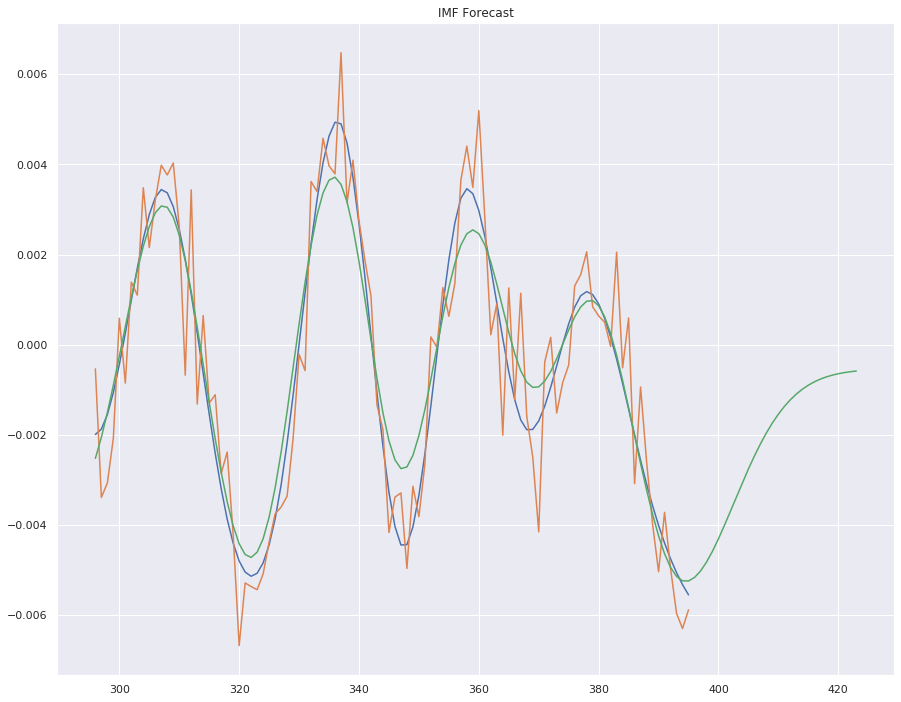

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

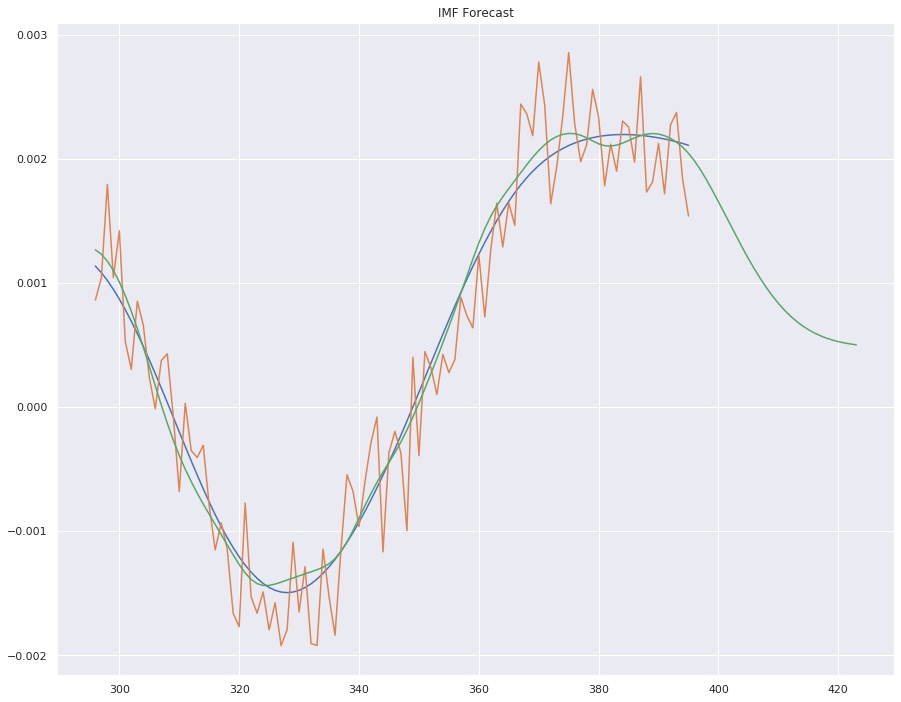

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

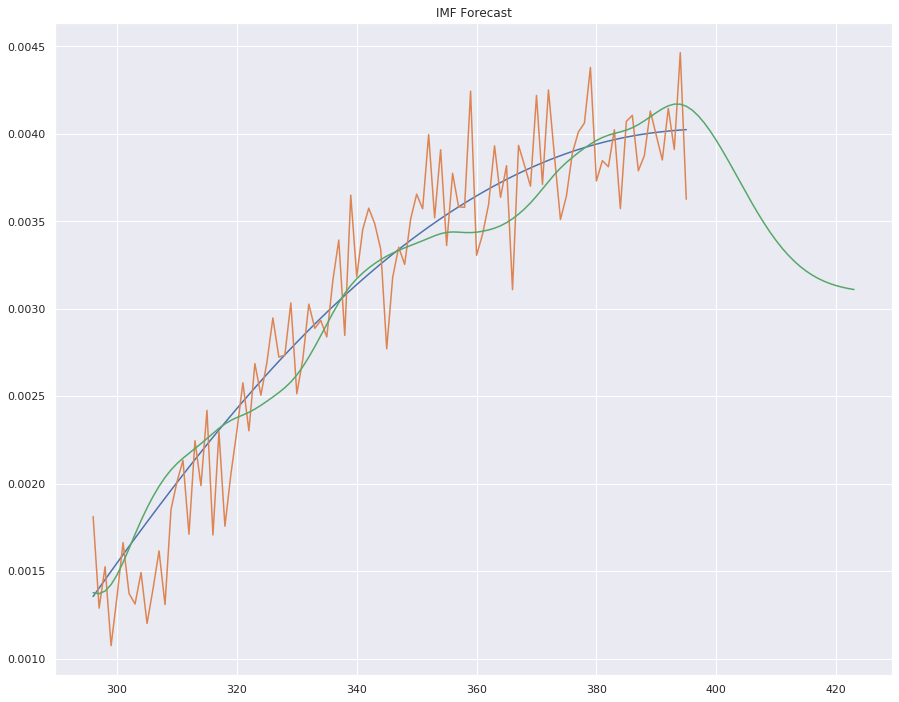

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

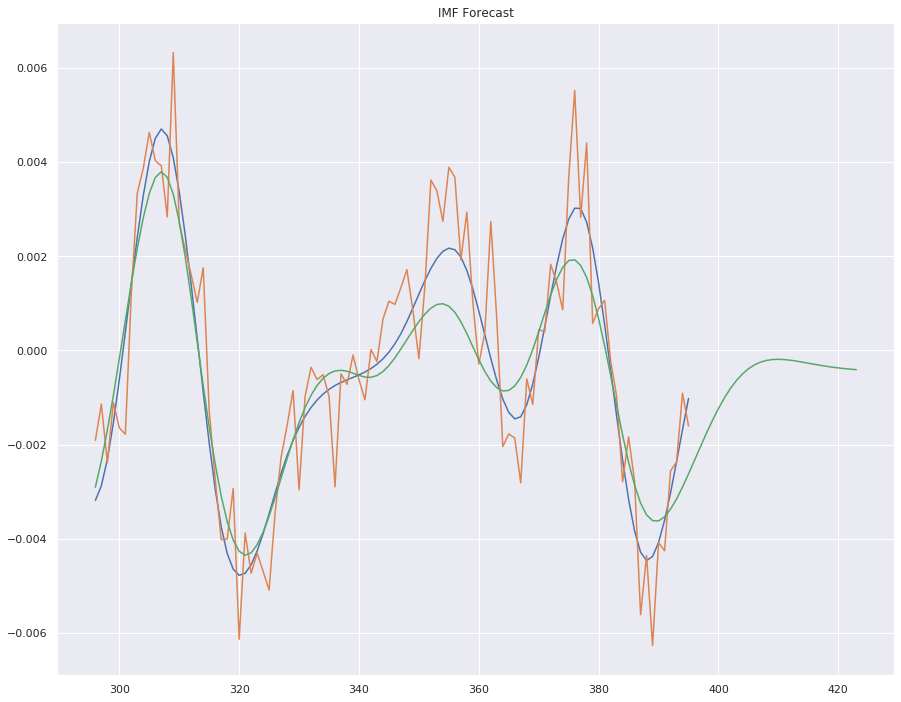

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

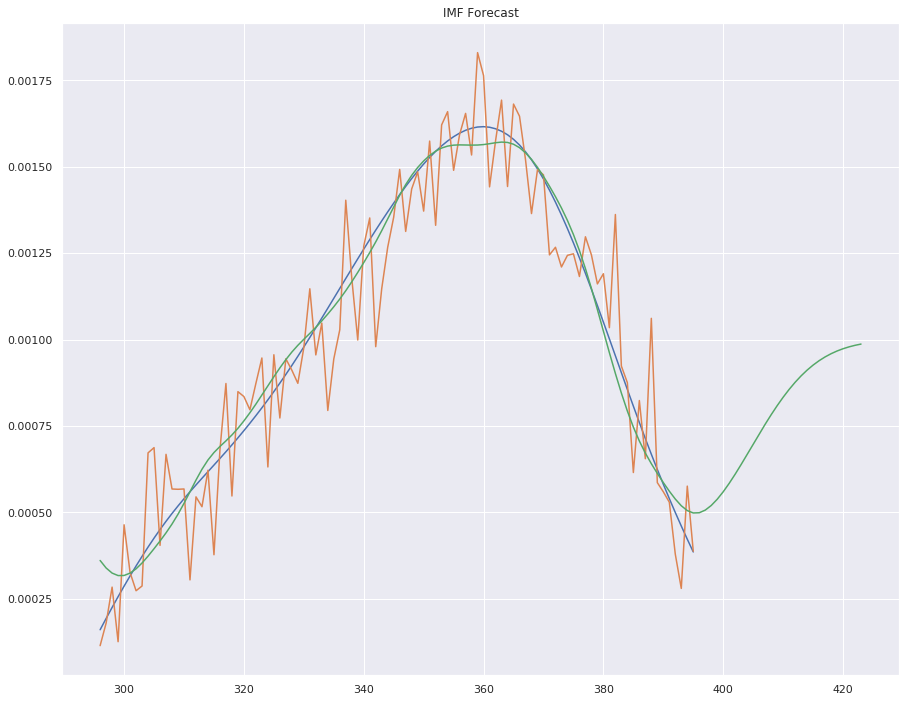

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

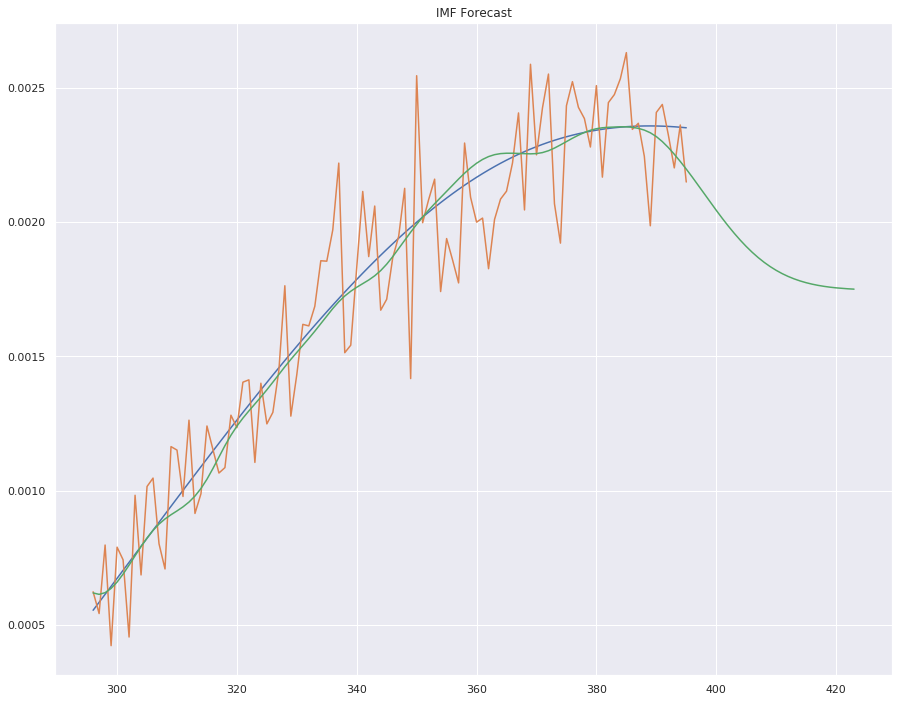

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

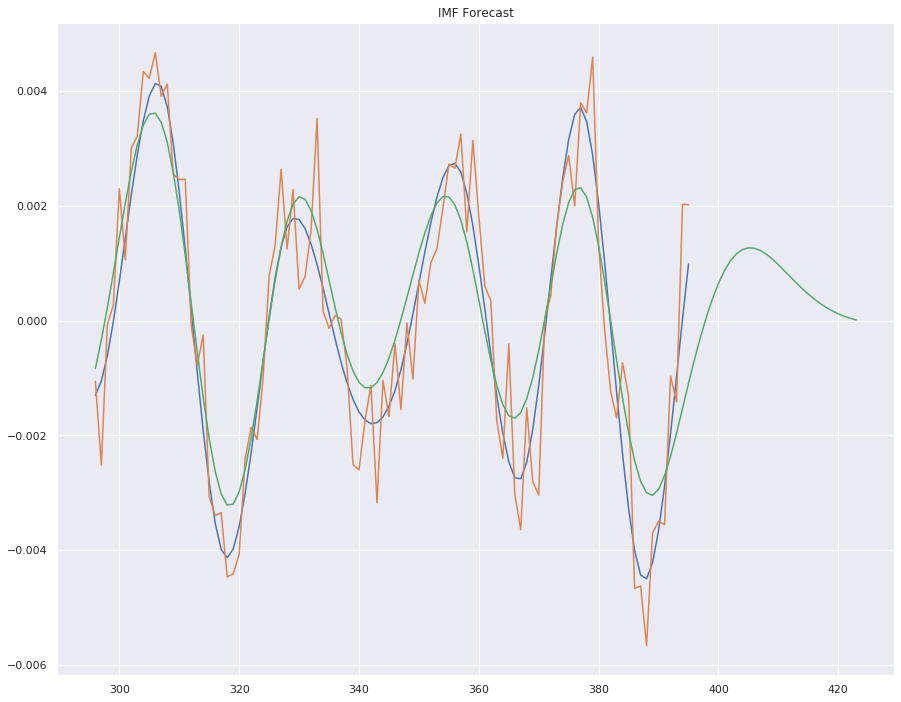

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

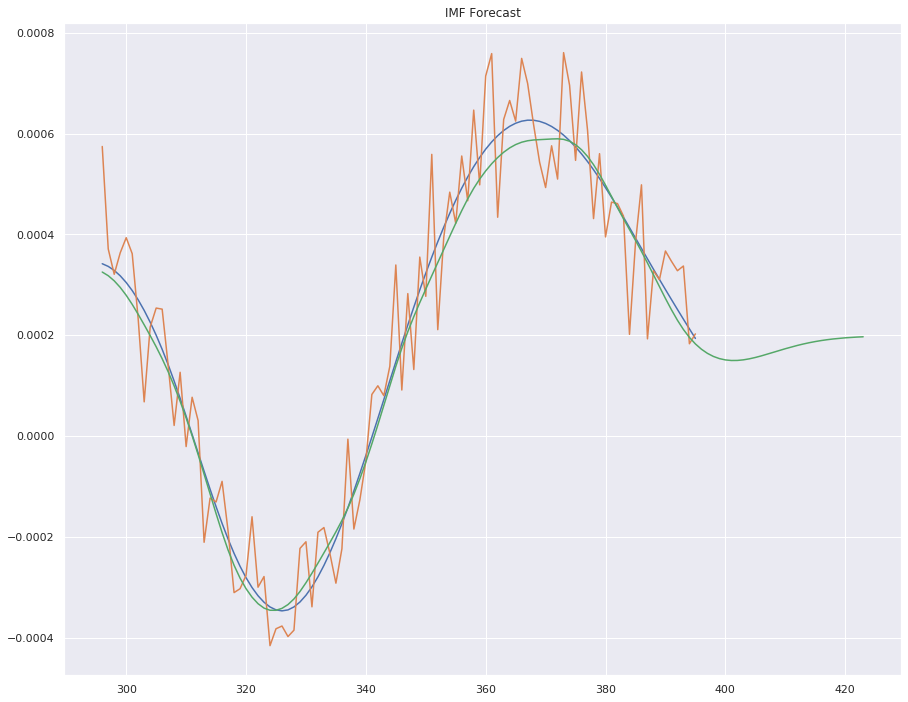

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

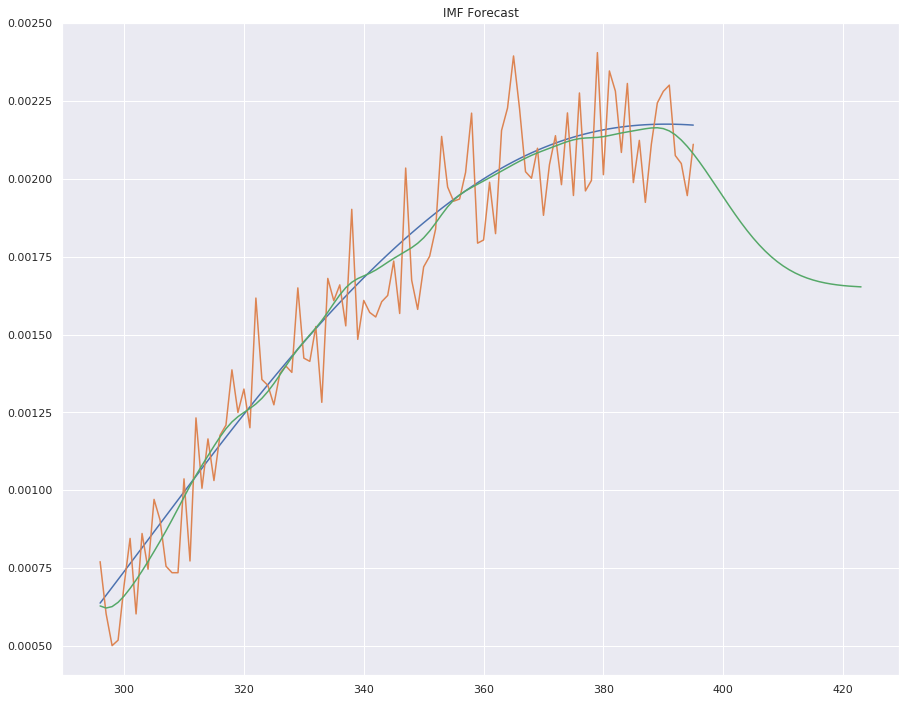

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

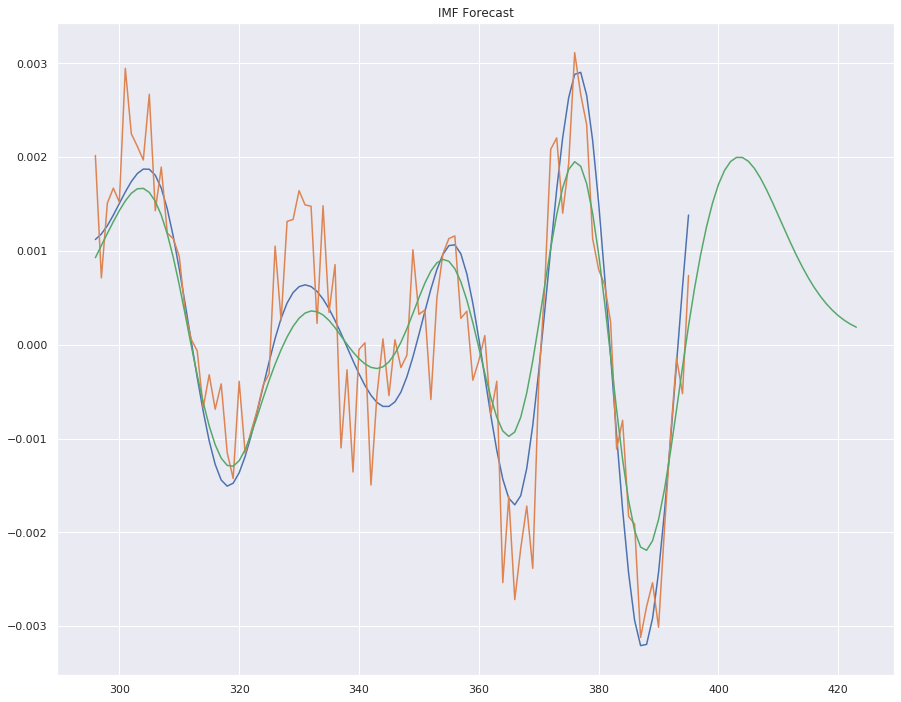

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

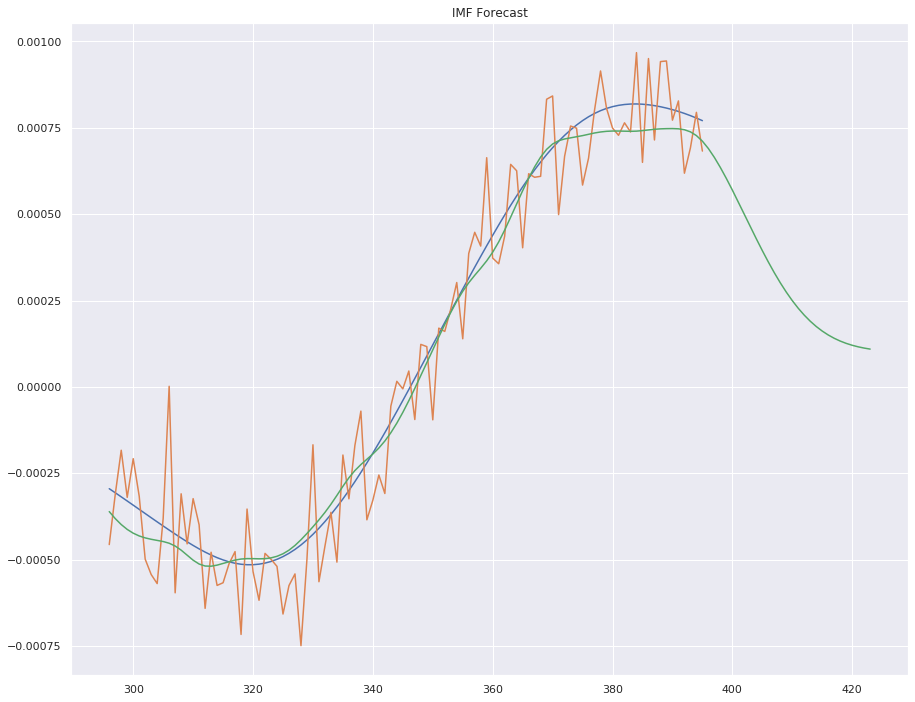

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

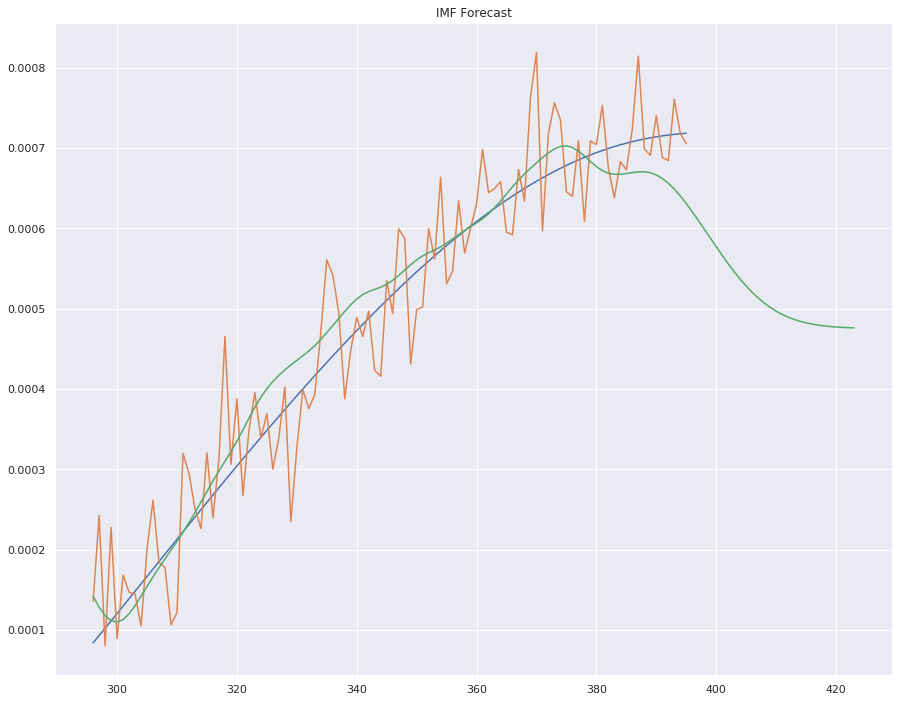

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

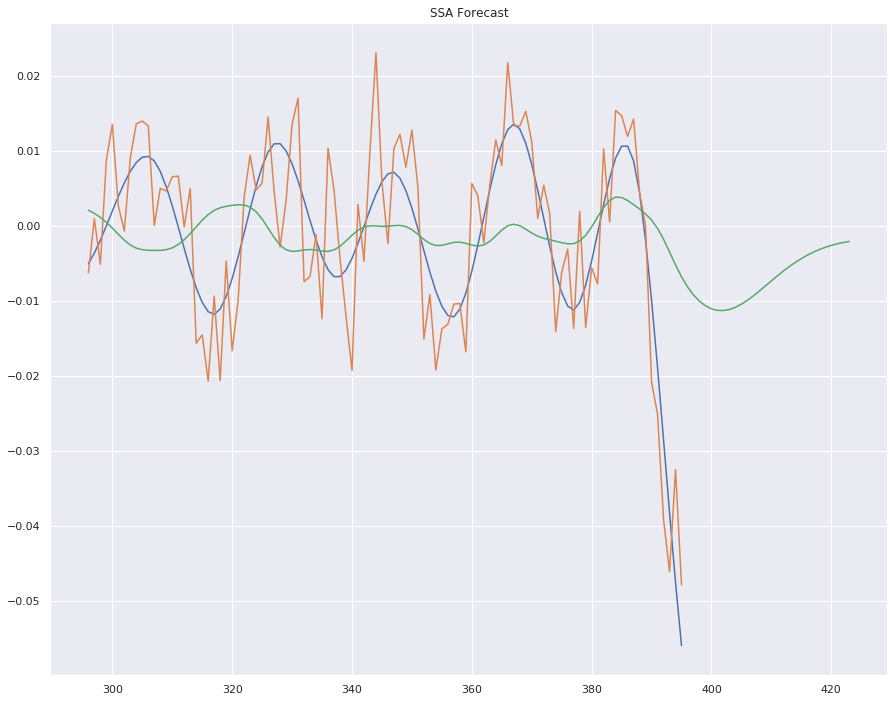

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

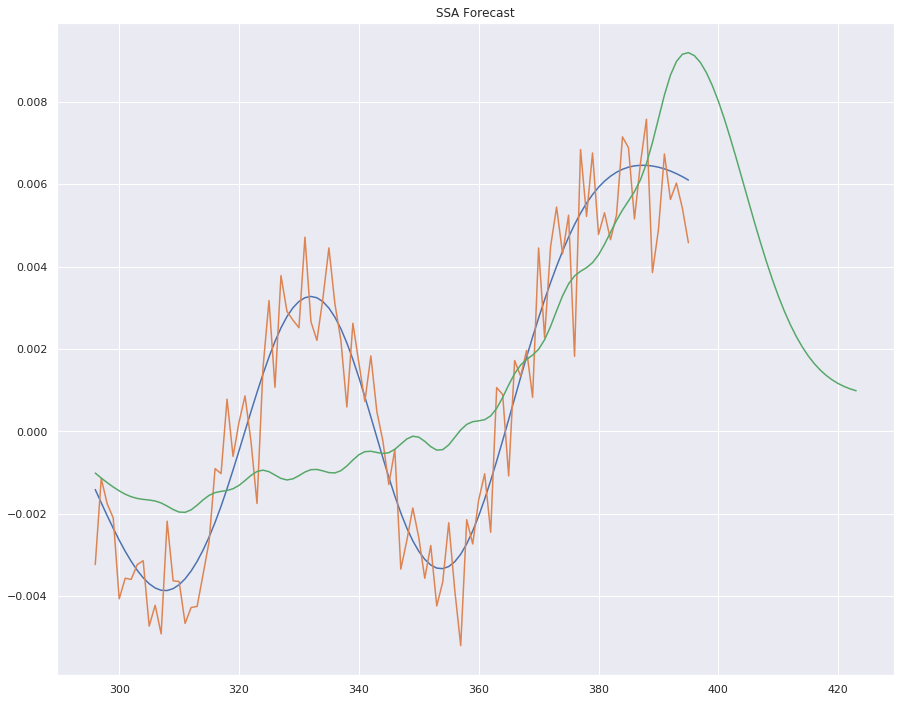

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

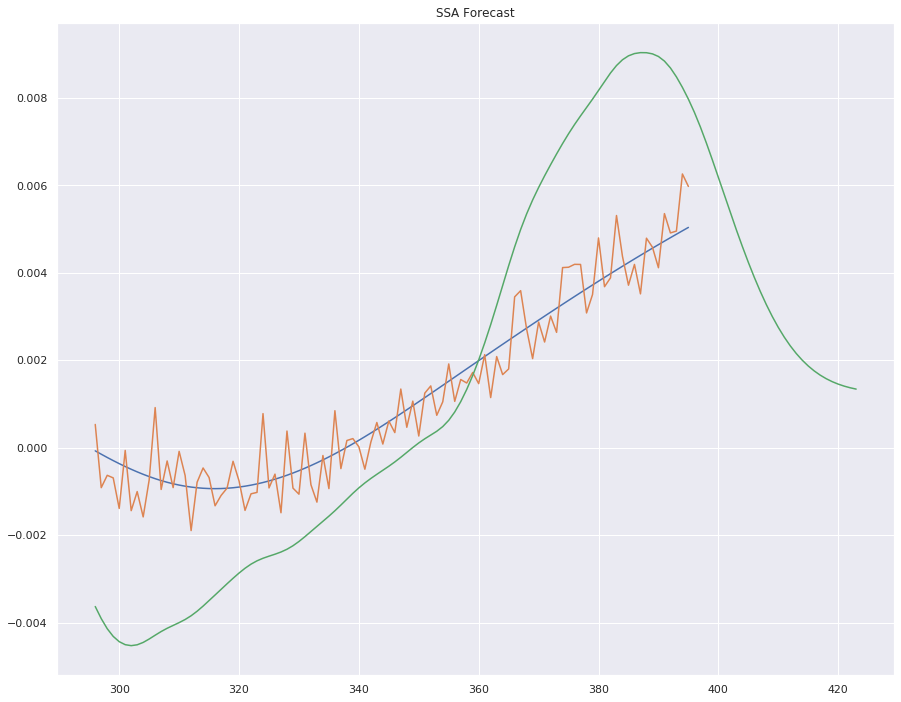

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

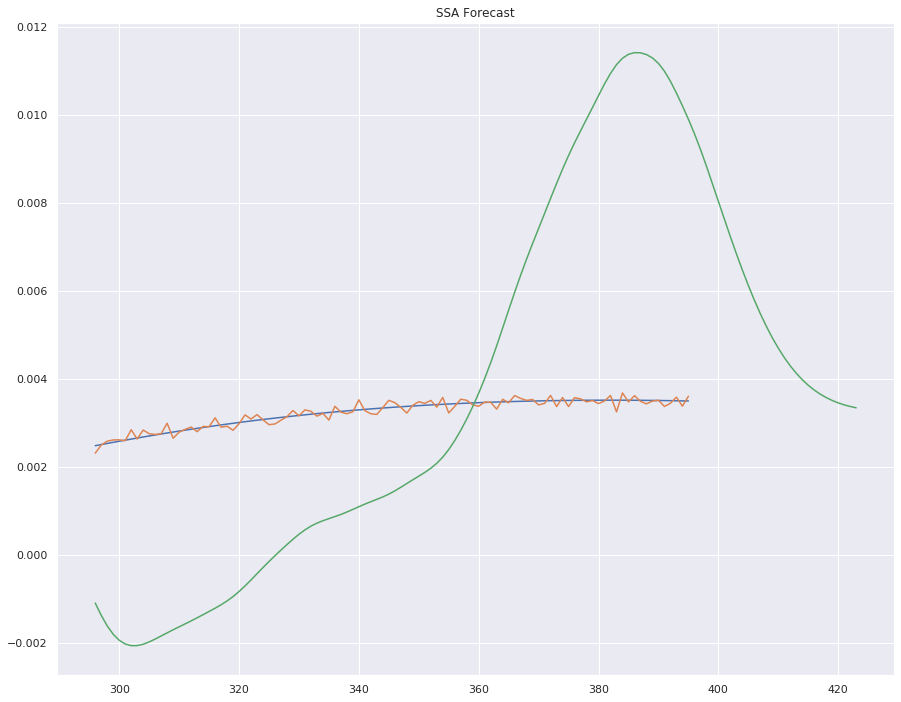

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

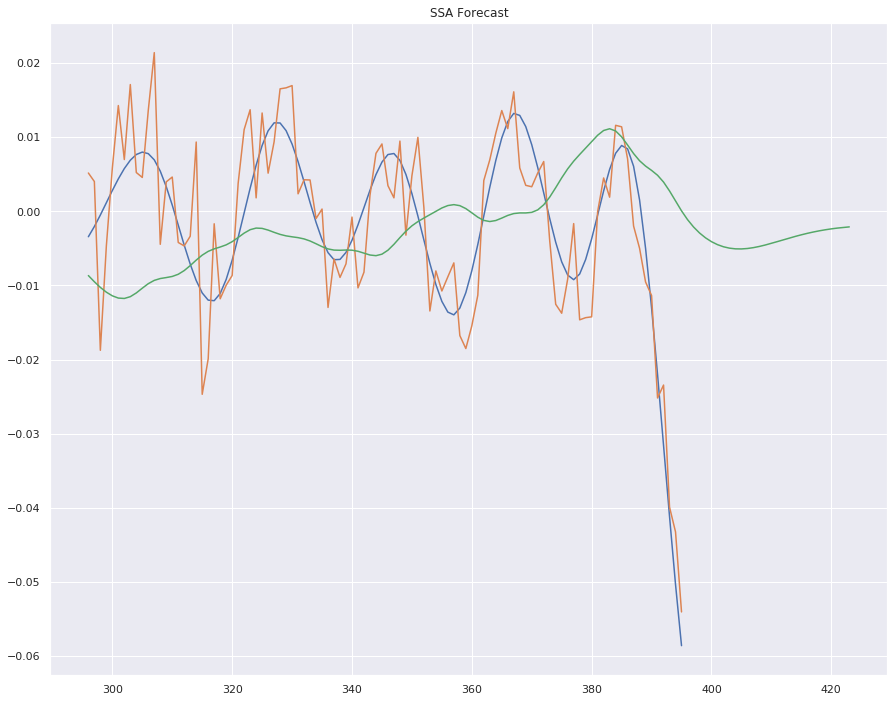

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

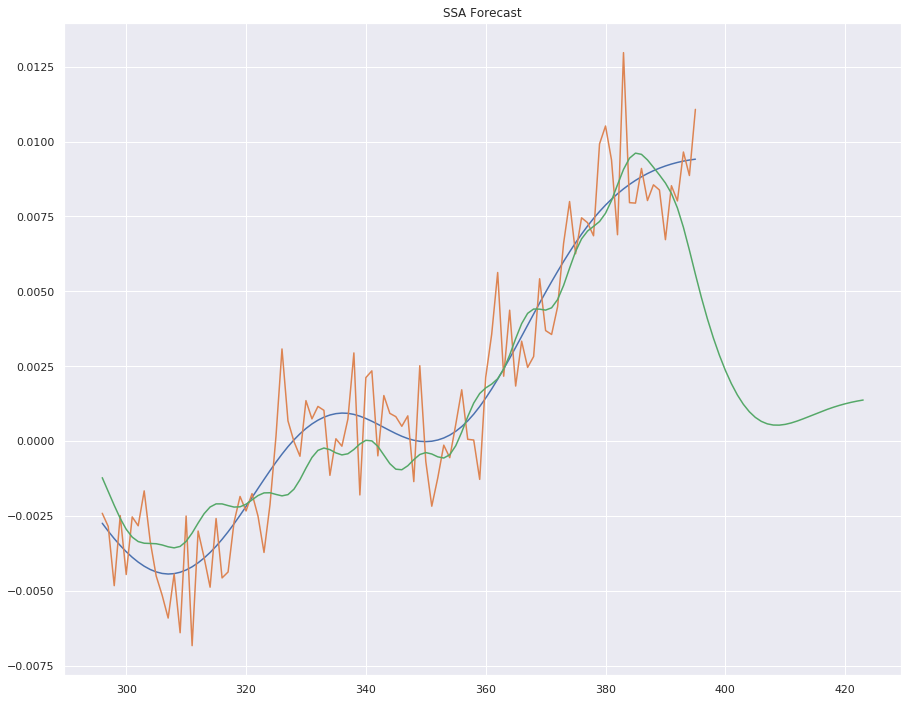

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

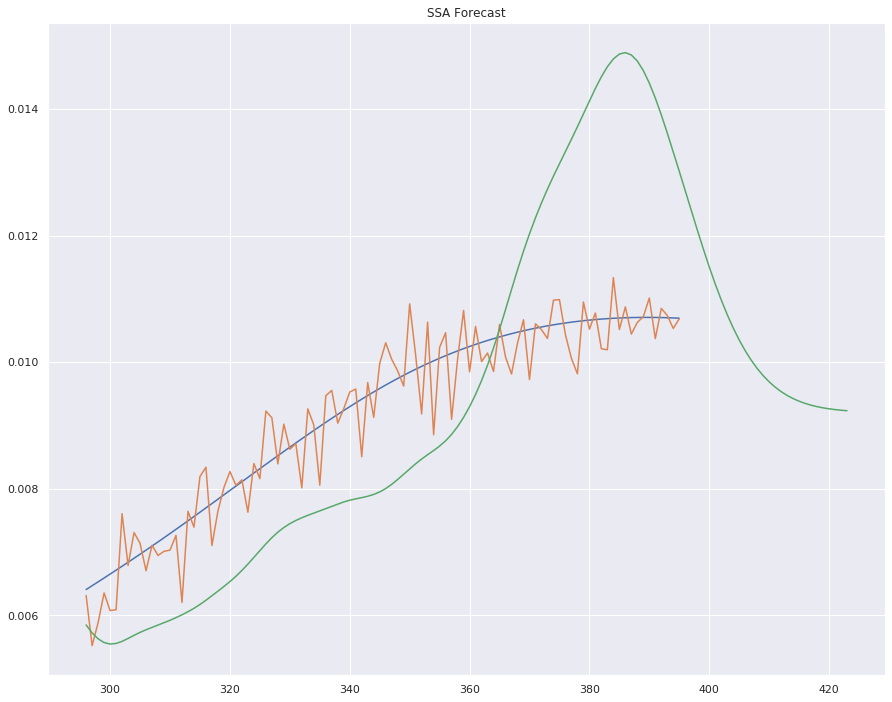

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

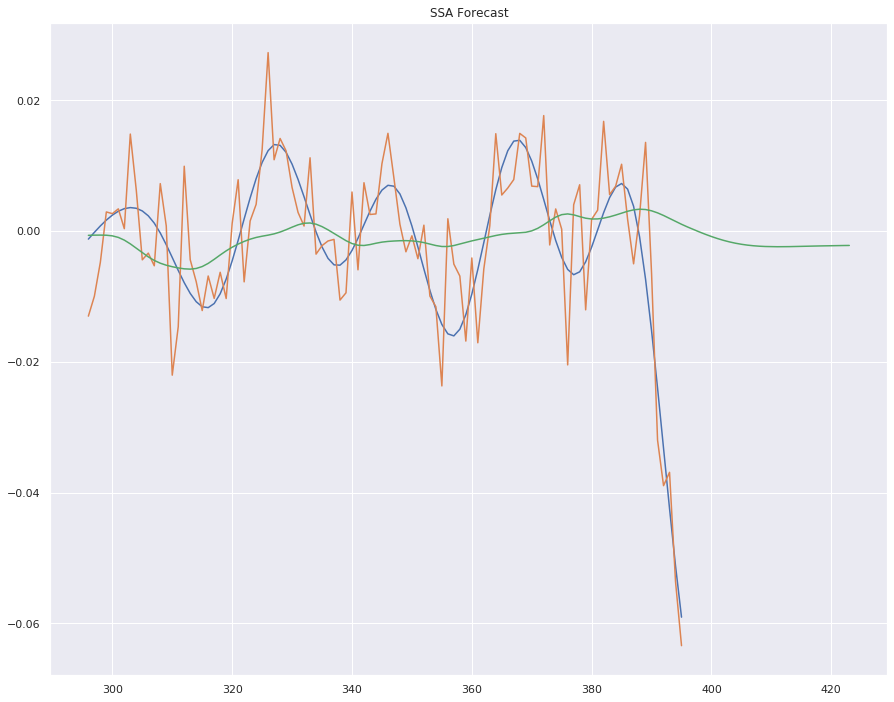

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

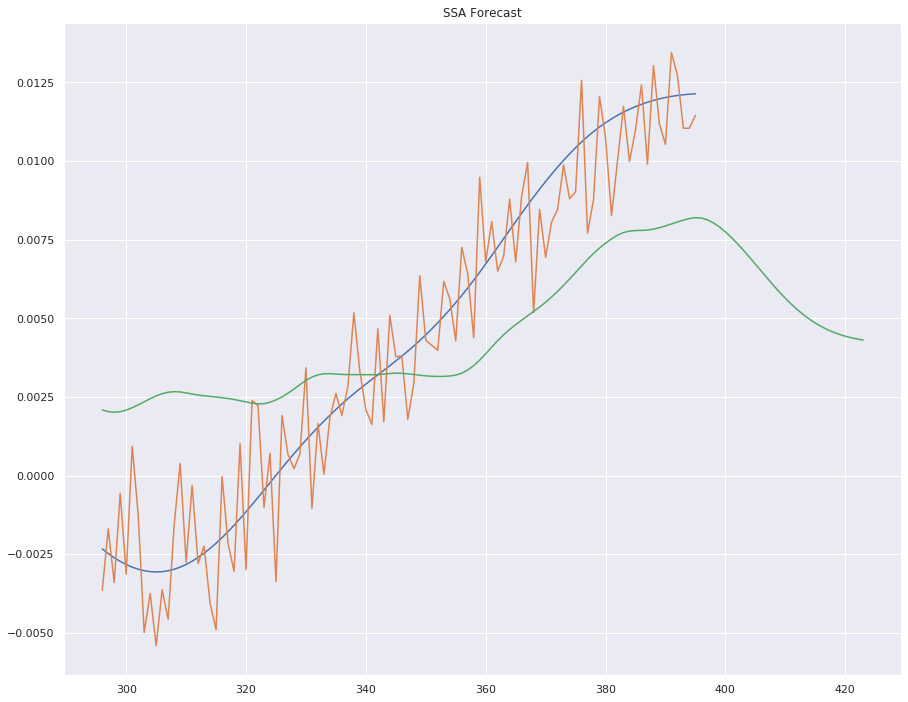

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

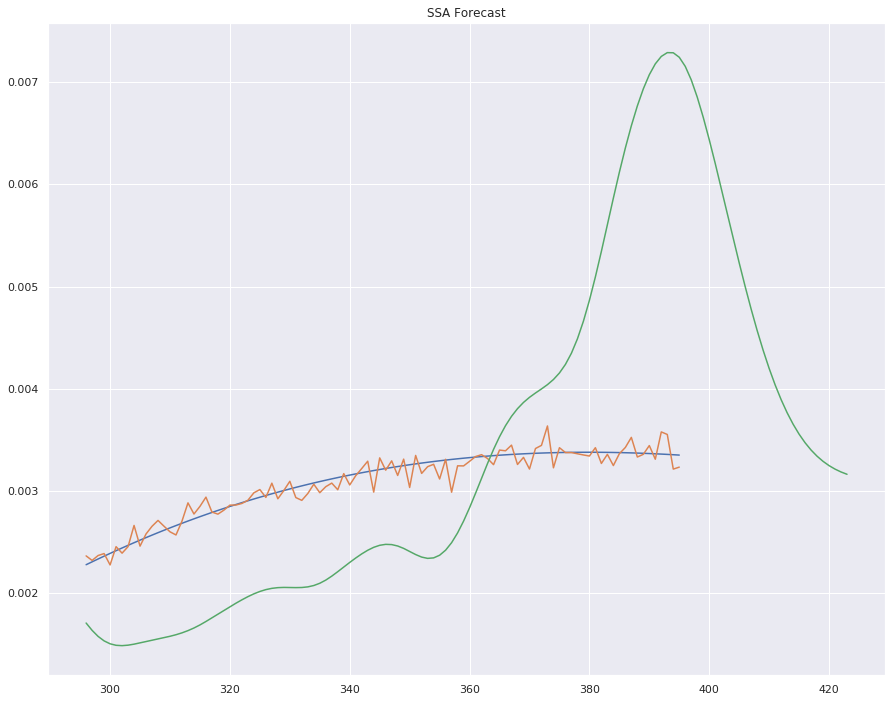

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

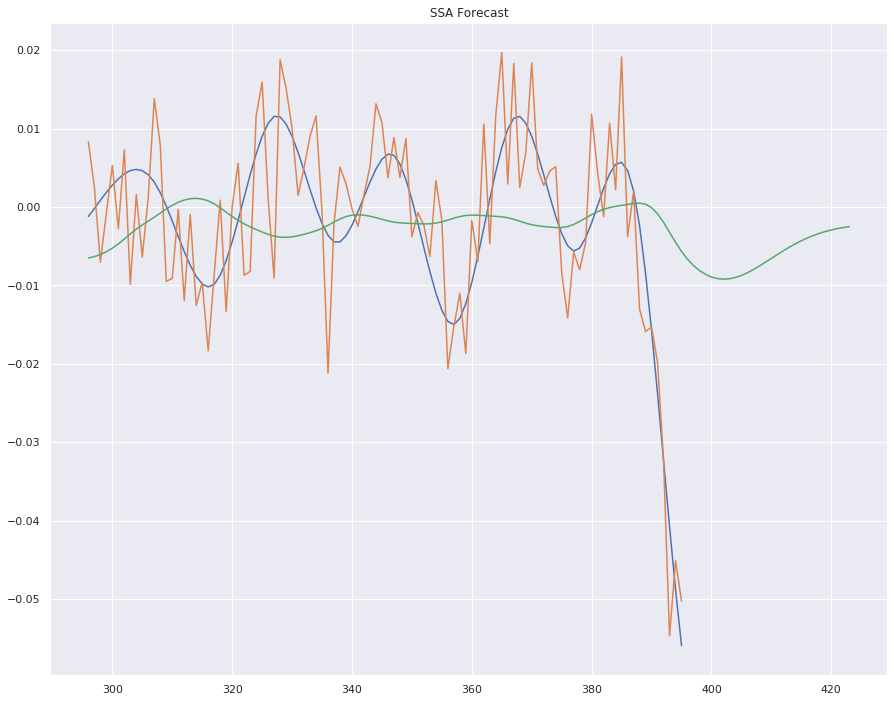

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

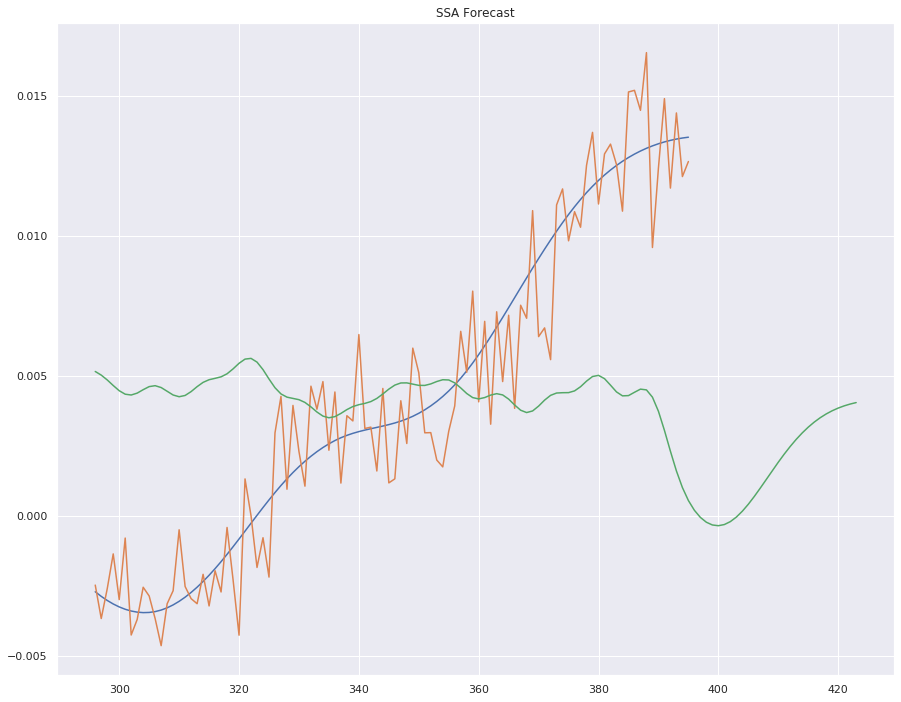

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

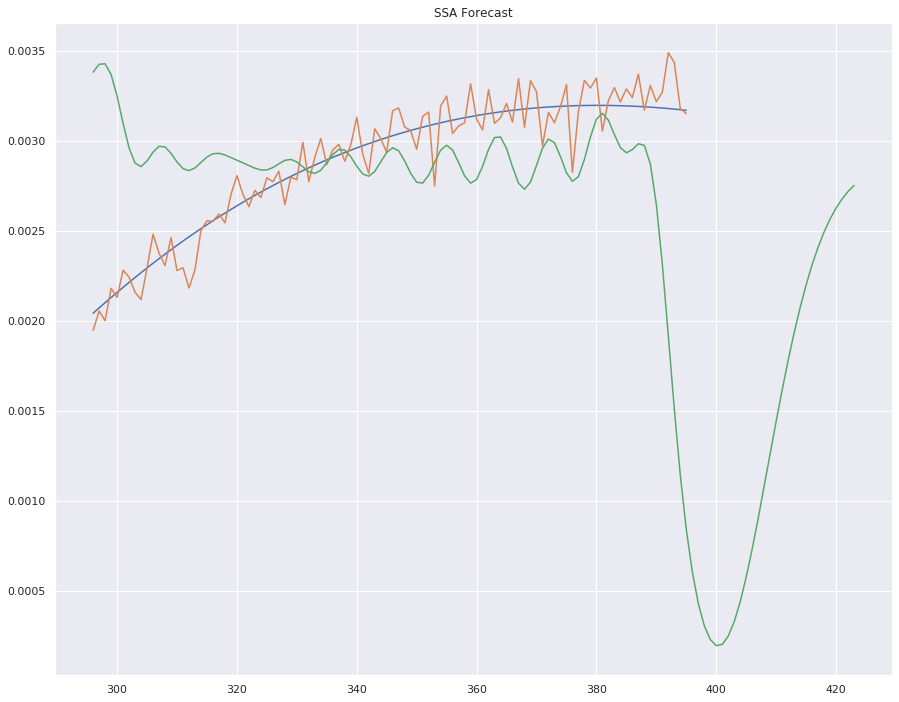

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

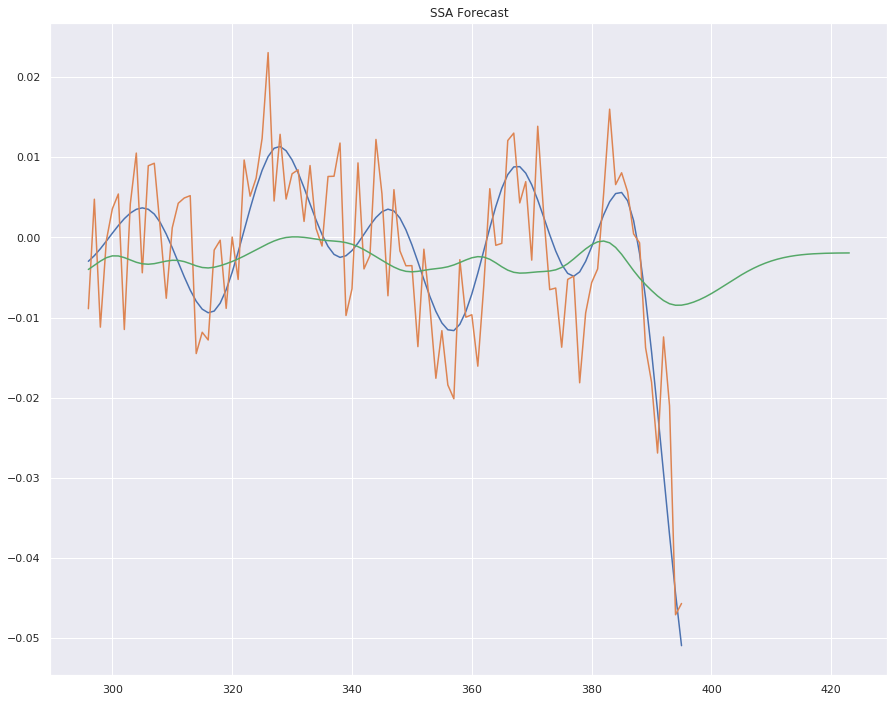

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

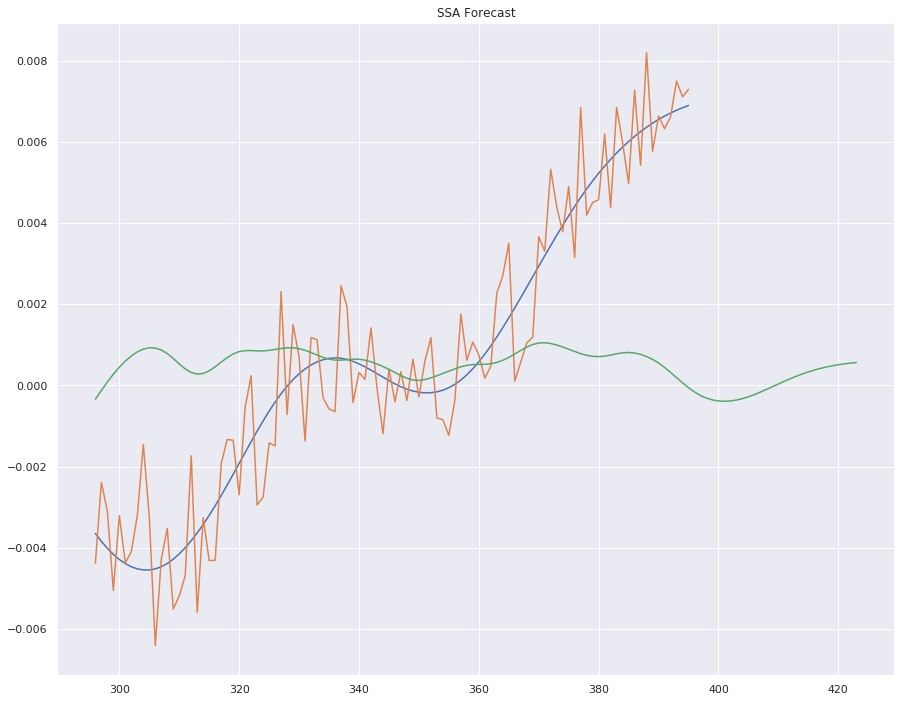

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

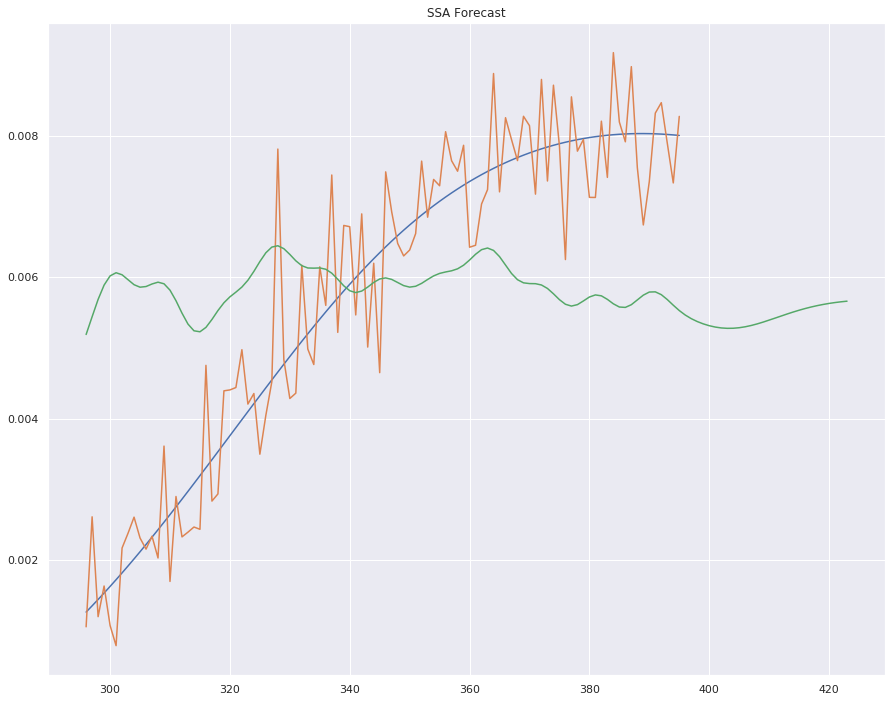

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

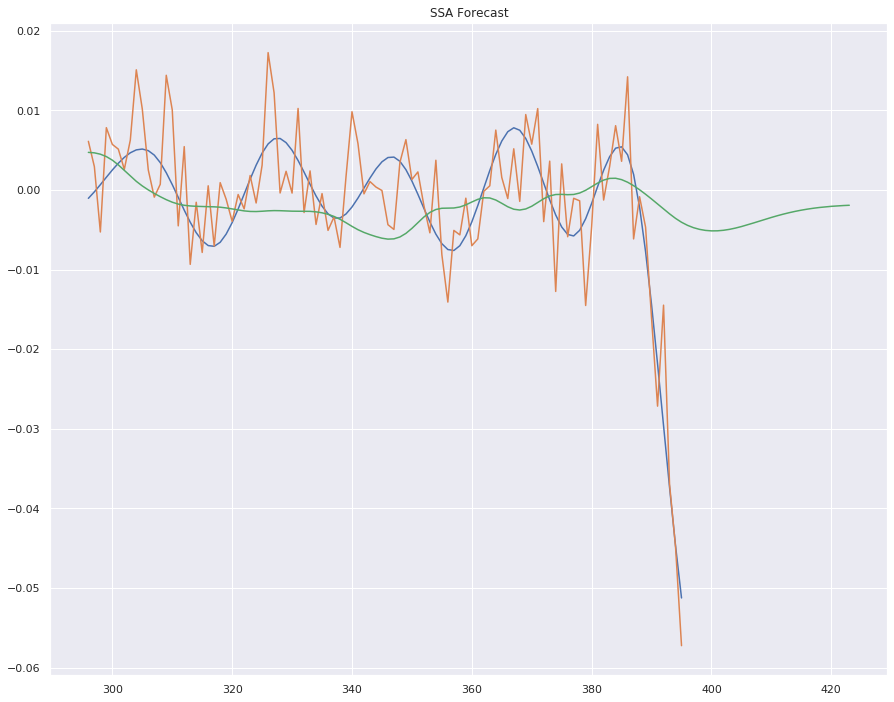

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

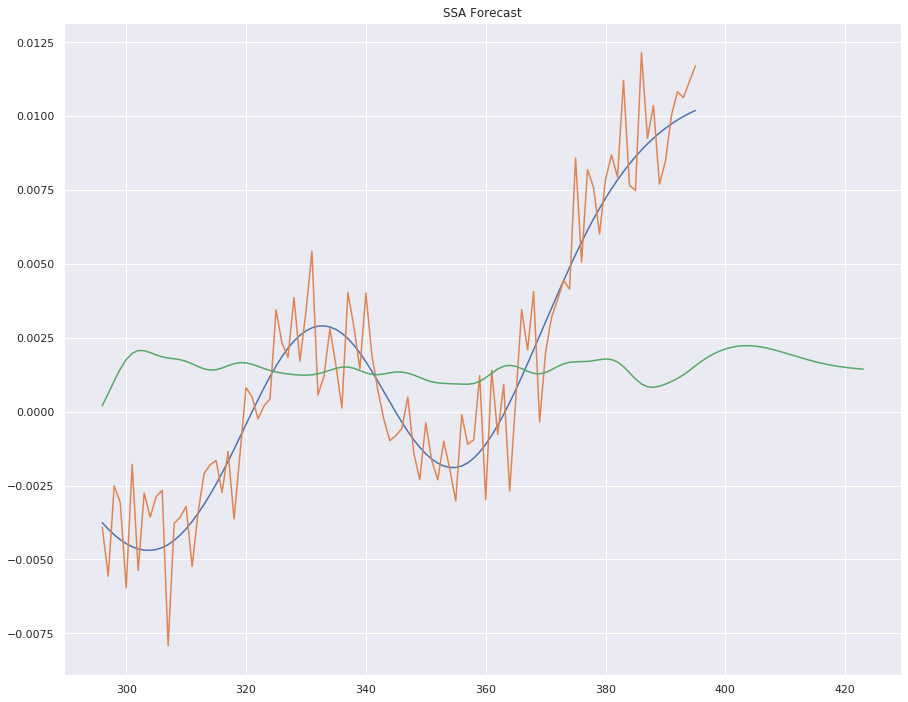

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

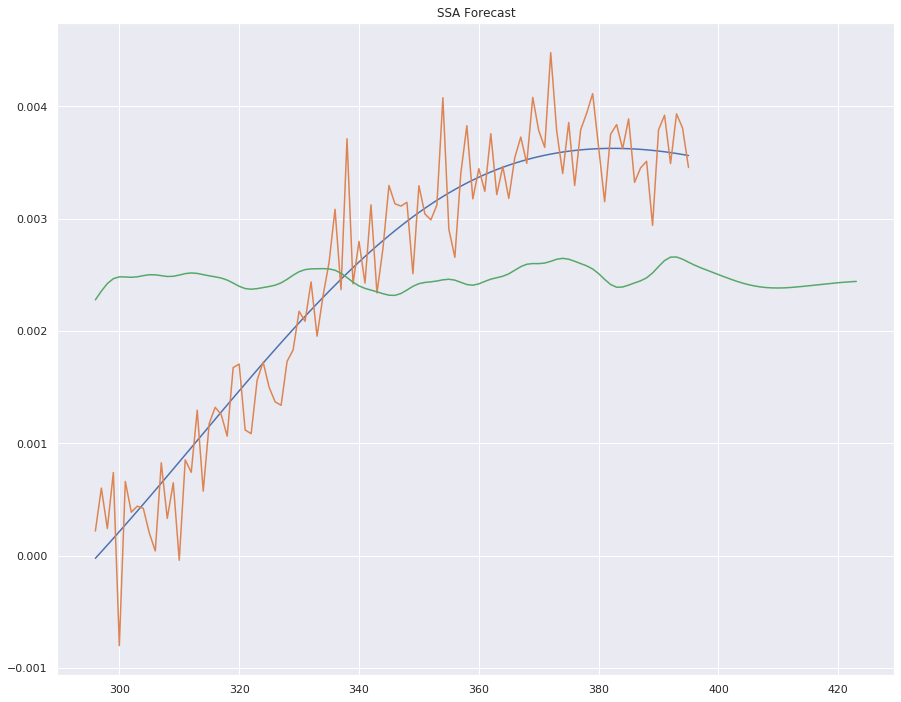

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

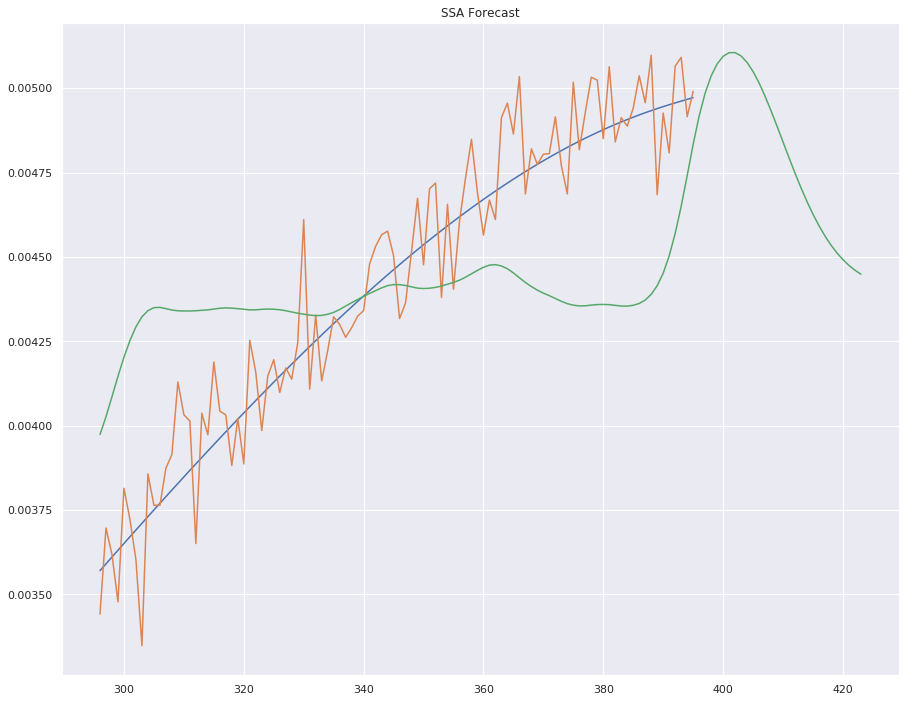

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

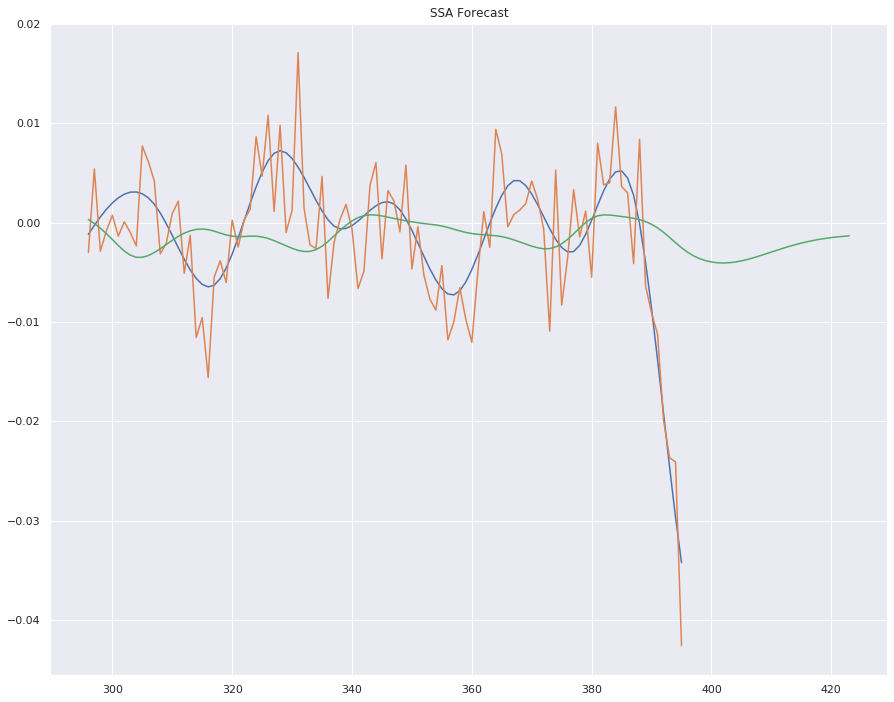

/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__alpha is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:437: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k1__k1__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/cole/miniconda3/envs/emd/lib/python3.7/site-packages/sklearn/gaussian_process/kernels.py:427: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__k1__k2__k1__alpha is close to the specified lower bound 0.1. Decreasing the bound and calling fit again may find a better value.
  ConvergenceWarning,
/home/c

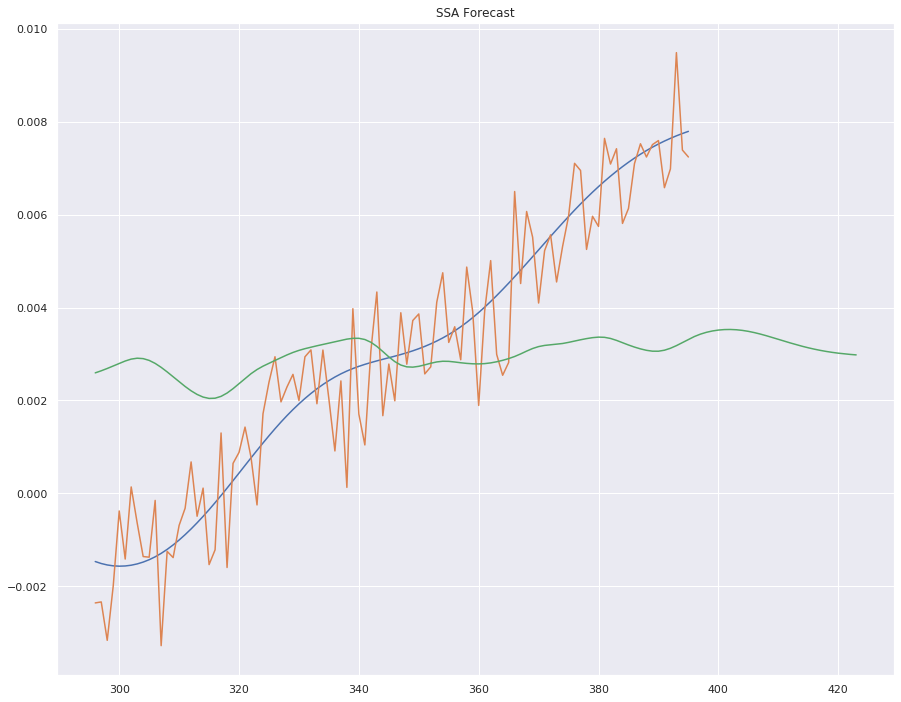

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100


In [15]:
# weights calculated on and used on different data (one month ahead)
# for day in range(len(end_of_month_vector_cumsum[:-int(months + 1)])):
for day in range(2):
    
    # calculate 'spline_basis'
    knots = 96  # arbitray - can adjust
    end_time = int(end_of_month_vector_cumsum[int(day + months)] - 1 - end_of_month_vector_cumsum[int(day)])
    spline_basis = cubic_b_spline(knots=np.linspace(-12, end_time + 12, knots), time=np.linspace(0, end_time, end_time + 1))
    spline_basis_direct_trunc = spline_basis[:, :int(end_of_month_vector_cumsum[int(day + months - 1)] - end_of_month_vector_cumsum[int(day)])]
    
    price_signal = np.cumsum(sector_11_indices_array[int(end_of_month_vector_cumsum[int(day)]):int(end_of_month_vector_cumsum[int(day + months)]), :], axis=1)
    
    # calculate 'A_est'
    A_est = np.linalg.lstsq(spline_basis.transpose(), sector_11_indices_array[end_of_month_vector_cumsum[int(day)]:end_of_month_vector_cumsum[int(day + months)], :], rcond=None)[0]
    
    # calculate 'x'
    # decompose price data
    for signal in range(np.shape(price_signal)[1]):
        emd = EMD(time_series=np.asarray(price_signal[:, signal]),
                  time=np.linspace(0, end_time, end_time + 1))
        imfs, _, _, _, _, _, _ = \
            emd.empirical_mode_decomposition(knot_envelope=np.linspace(-12, end_time + 12, knots),
                                             matrix=True)

        # ssa
        ssa_components = CovRegpy_ssa(np.asarray(price_signal[:, signal]), L=80, plot=False)[0]
        try:
            x_ssa = np.vstack((ssa_components, x_ssa))
        except:
            x_ssa = ssa_components.copy()

        # deal with constant last IMF and insert IMFs in dataframe
        # deal with different frequency structures here
        try:
            imfs = imfs[1:, :]
            if np.isclose(imfs[-1, 0], imfs[-1, -1]):
                imfs[-2, :] += imfs[-1, :]
                imfs = imfs[:-1, :]
        except:
            pass
        try:
            x = np.vstack((imfs, x))
        except:
            x = imfs.copy()
            
    # ssa
    x_ssa_trunc = x_ssa[:, :int(end_of_month_vector_cumsum[int(day + months - 1)] - end_of_month_vector_cumsum[int(day)])]

    # matrix to store forecasted IMFs
    forecasted_imfs = np.zeros((np.shape(x)[0], end_of_month_vector[int(day + months + 1)]))
    
    # decaying irregular seasonal component
    k5 = RationalQuadratic(length_scale=1.2, alpha=0.78, length_scale_bounds=(1e-01, 1e+01), alpha_bounds=(1e-01, 1e+01)) * \
         ExpSineSquared(length_scale=1.3, periodicity=1.0, length_scale_bounds=(1e-01, 1e+01), periodicity_bounds=(1e-01, 1e+01))

    k6 = RationalQuadratic(length_scale=1.2, alpha=0.78, length_scale_bounds=(1e-01, 1e+01), alpha_bounds=(1e-01, 1e+01)) * \
         RBF(length_scale=1.3, length_scale_bounds=(1e-01, 1e+01))

    k7 = RBF(length_scale=1.3, length_scale_bounds=(1e-01, 1e+01)) * \
         ExpSineSquared(length_scale=1.3, periodicity=1.0, length_scale_bounds=(1e-01, 1e+01), periodicity_bounds=(1e-01, 1e+01))
    
    k8 = WhiteKernel(noise_level=0.19 ** 2, noise_level_bounds=(1e-01, 1e+00))

    # kernel = k1 + k2 + k3 + k4
    kernel = k5 + k6 + k7 + k8

    x_fit = np.arange(end_of_month_vector_cumsum[day], end_of_month_vector_cumsum[int(day + months)])
    gp_forecast_days = np.arange(end_of_month_vector_cumsum[int(day + months)],
                                 end_of_month_vector_cumsum[int(day + months + 1)])

    forecast_range_imf = 100
    for forecast_day in range(np.shape(forecasted_imfs)[0]):
        full_estimate = gp_forecast(x_fit[-forecast_range_imf:],
                                    x[forecast_day, :][-forecast_range_imf:] -
                                    np.mean(x[forecast_day, :][-forecast_range_imf:]) +
                                    np.random.normal(0, 0.1 *
                                                     (np.max(x[forecast_day, :][-forecast_range_imf:] -
                                                             np.min(x[forecast_day, :][-forecast_range_imf:]))),
                                                     len(x[forecast_day, :][-forecast_range_imf:])),
                                    x_forecast=np.hstack((x_fit[-forecast_range_imf:], gp_forecast_days)),
                                    kernel=kernel, confidence_level=0.95)
        forecasted_imfs[forecast_day, :] = full_estimate[0][-np.shape(forecasted_imfs)[1]:] + \
                                           np.mean(x[forecast_day, :][-forecast_range_imf:])

        # debugging
        plt.title('IMF Forecast')
        plt.plot(x_fit[-forecast_range_imf:],
                 x[forecast_day, :][-forecast_range_imf:])
        plt.plot(x_fit[-forecast_range_imf:],
                 x[forecast_day, :][-forecast_range_imf:] -
                 np.random.normal(0, 0.1 *
                                  (np.max(x[forecast_day, :][-forecast_range_imf:] -
                                          np.min(x[forecast_day, :][-forecast_range_imf:]))),
                                  len(x[forecast_day, :][-forecast_range_imf:]))
                 )
        plt.plot(np.hstack((x_fit[-forecast_range_imf:], gp_forecast_days)),
                 full_estimate[0] + np.mean(x[forecast_day, :][-forecast_range_imf:]))
#         plt.plot(np.hstack((x_fit[-forecast_range_imf:], gp_forecast_days)),
#                  full_estimate[2] + np.mean(x[forecast_day, :][-forecast_range_imf:]))
#         plt.plot(np.hstack((x_fit[-forecast_range_imf:], gp_forecast_days)),
#                  full_estimate[3] + np.mean(x[forecast_day, :][-forecast_range_imf:]))
        plt.show()

    # matrix to store forecasted IMFs
    forecasted_ssa = np.zeros((np.shape(x_ssa)[0], end_of_month_vector[int(day + months + 1)]))

    forecast_range_ssa = 100
    for forecast_day in range(np.shape(x_ssa_trunc)[0]):
        full_estimate_ssa = gp_forecast(x_fit[-forecast_range_ssa:],
                                        x_ssa[forecast_day, :][-forecast_range_ssa:] -
                                        np.mean(x_ssa[forecast_day, :][-forecast_range_ssa:]) +
                                        np.random.normal(0, 0.1 *
                                                         (np.max(x[forecast_day, :][-forecast_range_imf:] -
                                                                 np.min(x[forecast_day, :][-forecast_range_imf:]))),
                                                         len(x[forecast_day, :][-forecast_range_imf:])),
                                        x_forecast=np.hstack((x_fit[-forecast_range_ssa:], gp_forecast_days)),
                                        kernel=kernel, confidence_level=0.95)
        forecasted_ssa[forecast_day, :] = full_estimate_ssa[0][-np.shape(forecasted_ssa)[1]:] + \
                                          np.mean(x_ssa[forecast_day, :][-forecast_range_ssa:])

        # debugging
        plt.title('SSA Forecast')
        plt.plot(x_fit[-forecast_range_imf:],
                 x[forecast_day, :][-forecast_range_imf:])
        plt.plot(x_fit[-forecast_range_imf:],
                 x[forecast_day, :][-forecast_range_imf:] -
                 np.random.normal(0, 0.1 *
                                  (np.max(x[forecast_day, :][-forecast_range_imf:] -
                                          np.min(x[forecast_day, :][-forecast_range_imf:]))),
                                  len(x[forecast_day, :][-forecast_range_imf:]))
                 )
        plt.plot(np.hstack((x_fit[-forecast_range_imf:], gp_forecast_days)),
                 full_estimate_ssa[0] + np.mean(x[forecast_day, :][-forecast_range_imf:]))
#         plt.plot(np.hstack((x_fit[-forecast_range_imf:], gp_forecast_days)),
#                  full_estimate_ssa[2] + np.mean(x[forecast_day, :][-forecast_range_imf:]))
#         plt.plot(np.hstack((x_fit[-forecast_range_imf:], gp_forecast_days)),
#                  full_estimate_ssa[3] + np.mean(x[forecast_day, :][-forecast_range_imf:]))
        plt.show()

    # Gaussian Process truncation of matrix
    spline_basis_gp_trunc = spline_basis[:, :-1]

    # # calculate truncated x - Gaussian Processes
    x_gp_trunc = x[:, :int(end_of_month_vector_cumsum[int(day + months)] - end_of_month_vector_cumsum[day] - 1)]

    # calculate y - Gaussian Processes
    y_gp = sector_11_indices_array[
           end_of_month_vector_cumsum[day]:int(end_of_month_vector_cumsum[int(day + months)] - 1), :]
    y_gp = y_gp.T
    
    # calculate 'A_est'
    A_est = np.linalg.lstsq(spline_basis.transpose(), sector_11_indices_array[end_of_month_vector_cumsum[int(day)]:end_of_month_vector_cumsum[int(day + months)], :], rcond=None)[0]
    # calculate 'A_est'
    A_est_ssa = A_est.copy()

    # ssa gp

    x_gp_trunc_ssa = x_ssa[:, :int(end_of_month_vector_cumsum[int(day + months)] - end_of_month_vector_cumsum[day] - 1)]
    B_est_gp_ssa, Psi_est_gp_ssa = \
        cov_reg_given_mean(A_est=A_est_ssa, basis=spline_basis_gp_trunc, x=x_gp_trunc_ssa, y=y_gp, iterations=100)

    # ssa gp

    # calculate B_est and Psi_est - Gaussian Processes
    B_est_gp, Psi_est_gp = \
        cov_reg_given_mean(A_est=A_est, basis=spline_basis_gp_trunc, x=x_gp_trunc, y=y_gp, iterations=100)

    # imf days that will be used to forecast variance of returns - Gaussain Process
    forecast_days_gp = np.arange(int(end_of_month_vector_cumsum[int(day + months)] - 1),
                                 int(end_of_month_vector_cumsum[int(day + months + 1)] - 1))

    days_in_month_forecast_gp = end_of_month_vector[int(day + months + 1)]

    # empty forecasted variance storage matrix - Gaussian Process
    variance_Model_forecast_gp = np.zeros((days_in_month_forecast_gp, np.shape(B_est_gp)[1], np.shape(B_est_gp)[1]))

    # empty forecasted variance storage matrix - Gaussian Process ssa
    variance_Model_forecast_gp_ssa = np.zeros((days_in_month_forecast_gp, np.shape(B_est_gp_ssa)[1], np.shape(B_est_gp_ssa)[1]))

    # iteratively calculate variance
    for forecasted_variance_index in range(len(forecast_days_gp)):

        variance_Model_forecast_gp[forecasted_variance_index] = \
            Psi_est_gp + np.matmul(np.matmul(B_est_gp.T,
                                             forecasted_imfs[:, forecasted_variance_index]).astype(np.float64).reshape(-1, 1),
                                   np.matmul(forecasted_imfs[:, forecasted_variance_index].T,
                                             B_est_gp).astype(np.float64).reshape(1, -1)).astype(np.float64)

        # ssa gp

        variance_Model_forecast_gp_ssa[forecasted_variance_index] = \
            Psi_est_gp_ssa + \
            np.matmul(np.matmul(B_est_gp_ssa.T,
                                forecasted_ssa[:, forecasted_variance_index]).astype(np.float64).reshape(-1, 1),
                      np.matmul(forecasted_ssa[:, forecasted_variance_index].T,
                                B_est_gp_ssa).astype(np.float64).reshape(1, -1)).astype(np.float64)

        # ssa gp

    # debugging
    # plt.plot(np.mean(np.mean(np.abs(variance_Model_forecast_gp), axis=1), axis=1))
    # plt.plot(np.mean(np.mean(np.abs(variance_Model_forecast_gp_ssa), axis=1), axis=1))
    # plt.show()
    variance_median_gp = np.median(variance_Model_forecast_gp, axis=0)
    variance_median_gp_ssa = np.median(variance_Model_forecast_gp_ssa, axis=0)
